# Simplified-Workflow ver9

eyes open


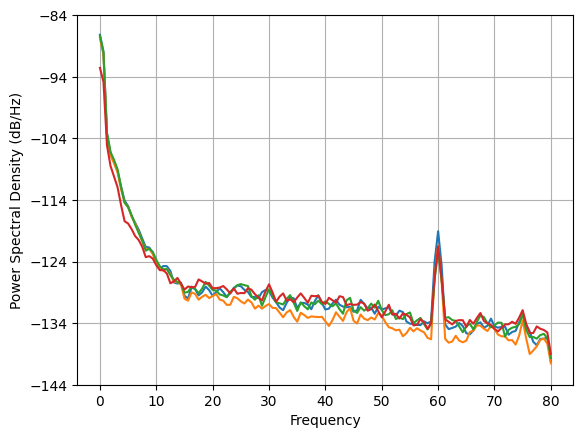

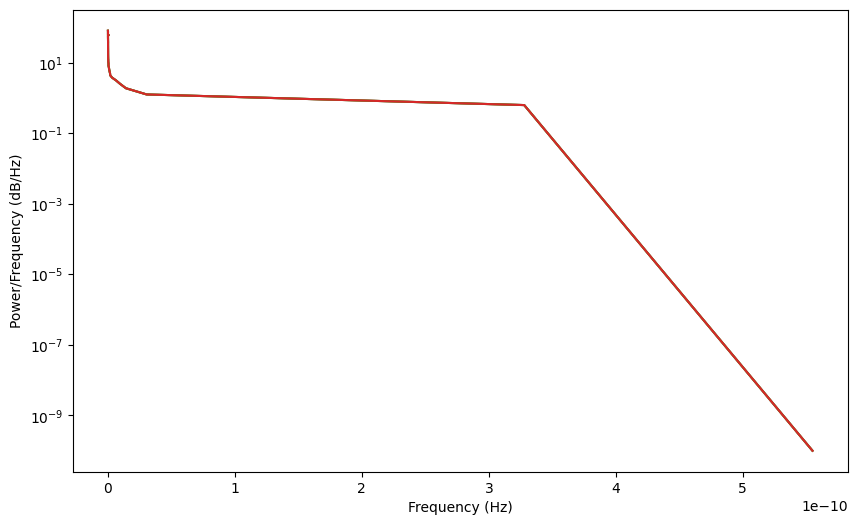

eyes closed


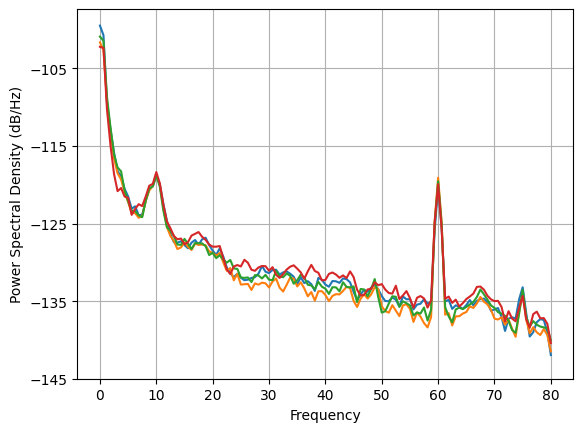

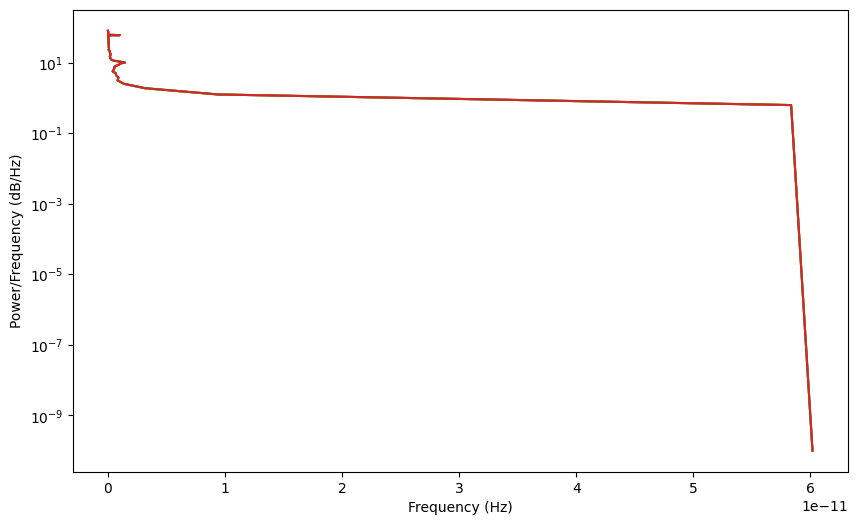

In [17]:
import mne
import numpy as np 
import matplotlib.pyplot as plt
import torch
import os
import sklearn
from sklearn.pipeline import Pipeline
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.model_selection import ShuffleSplit, cross_val_score, train_test_split
from torch.utils.data import DataLoader, Dataset
import torch.nn as nn
import torch.optim as optim
from torchvision import transforms
from sklearn.preprocessing import MinMaxScaler
from torch.utils.data import TensorDataset, DataLoader
import torch.nn.functional as F
from torch.fft import rfft, irfft


eyes_open = np.load('training_open.npy')
eyes_closed = np.load('training_closed.npy')

training_data_open = []
training_data_closed = []

for i in range(len(eyes_open)):
    aux = []
    for ch in [21,22,23,27]:
        aux.append(eyes_open[i,ch,:])
    training_data_open.append(aux)

for i in range(len(eyes_closed)):
    aux = []
    for ch in [21,22,23,27]:
        aux.append(eyes_closed[i,ch,:])
    training_data_closed.append(aux)


eyes_open = None
eyes_closed = None

NUM_CHANNELS = 4
SEQUENCE_LENGTH = 9760
LAMBDA_GP = 5
SPECTRAL_LOSS_FACTOR = 0.001

def compute_psd(data, fs, nperseg=256, noverlap=None):
    """
    Compute Power Spectral Density (PSD) using the Welch method.

    Parameters:
        data (array): EEG data array with shape (n_channels, n_samples).
        fs (float): Sampling frequency.
        nperseg (int): Length of each segment for PSD estimation.
        noverlap (int): Number of overlapping samples between segments.
    
    Returns:
        freqs (array): Frequency values.
        psd (array): Power Spectral Density values.
    """
    n_channels, n_samples = data.shape
    psd = np.zeros((n_channels, nperseg // 2 + 1))

    for ch_idx in range(n_channels):
        f, Pxx = plt.psd(data[ch_idx], Fs=fs, NFFT=nperseg, noverlap=noverlap)
        # Add a small epsilon to avoid zero values
        psd[ch_idx] = Pxx + 1e-10

    return f, psd

def average_across_arrays(generated_data):
    return generated_data.mean(dim=0)

# Set the sampling frequency
fs = 160.0

## open data
averaged_data = average_across_arrays(torch.tensor(training_data_open).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(NUM_CHANNELS):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes open")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()



## closed data
averaged_data = average_across_arrays(torch.tensor(training_data_closed).detach())
freqs, psd = compute_psd(averaged_data, fs)
plt.figure(figsize=(10, 6))  # Add this line to create a single figure
for ch_idx in range(NUM_CHANNELS):
    plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')

print("eyes closed")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.show()


def weights_init(model):
    for m in model.modules():
      if isinstance(m, (nn.Conv1d, nn.ConvTranspose1d)):
        nn.init.normal_(m.weight.data, 0.0, 0.02)

# Gaussian normal distribution
def sample_normal_distribution(i, j, k):
    mu = 0
    sigma = 0.02
    return torch.Tensor(np.random.normal(mu, sigma, (i, j, k)))

def gradient_penalty(D, real, fake):
    alpha = torch.rand((BATCH_SIZE, 1, 1)).repeat(1, NUM_CHANNELS, SEQUENCE_LENGTH)
    interpolated_seq = real * alpha + fake * (1 - alpha)

    # Calculate discriminator scores
    mixed_scores = D(interpolated_seq)

    # Take the gradient of the scores with respect to the images
    gradient = torch.autograd.grad(
        inputs=interpolated_seq,
        outputs=mixed_scores,
        grad_outputs=torch.ones_like(mixed_scores),
        create_graph=True,
        retain_graph=True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim=1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    return gradient_penalty

def plot_everything(generated_data, gen_err, critic_err):
    generated_data = generated_data.detach()
    
    # plotting generated data
    values = generated_data[0, 0, :]
    plt.plot(values.tolist())
    plt.show()

    # plotting PSD
    averaged_data = average_across_arrays(generated_data)
    freqs, psd = compute_psd(averaged_data, fs)
    plt.figure(figsize=(10, 6))  # Add this line to create a single figure
    for ch_idx in range(NUM_CHANNELS):
        plt.semilogy(freqs, psd[ch_idx], label=f'Channel {ch_idx + 1}')
    plt.xlabel('Frequency (Hz)')
    plt.ylabel('Power/Frequency (dB/Hz)')
    plt.show()

    # plotting G vs D losses
    plt.figure(figsize=(10,5))
    plt.title("Generator and Discriminator Loss During Training")
    plt.plot(gen_err,label="Generator")
    plt.plot(critic_err,label="Critic")
    plt.xlabel("iterations")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

# Spectral loss term

Epoch 0: Critic error ([34.833952380099944]) Generator err ([-5.323647499084473])


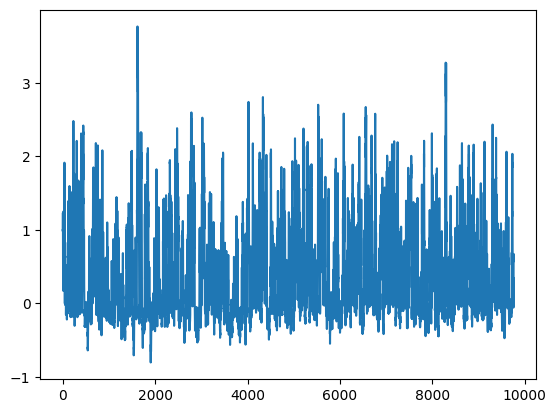

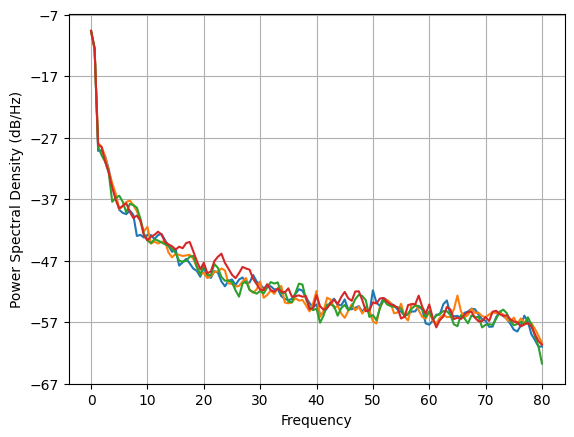

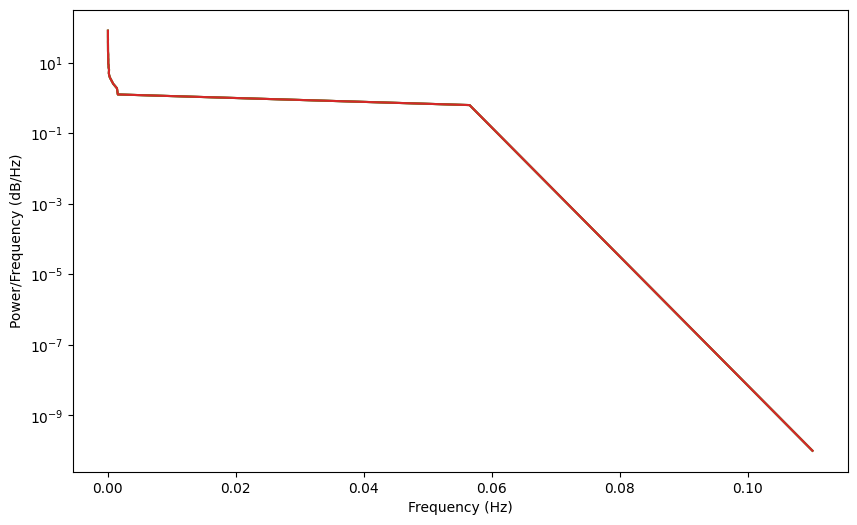

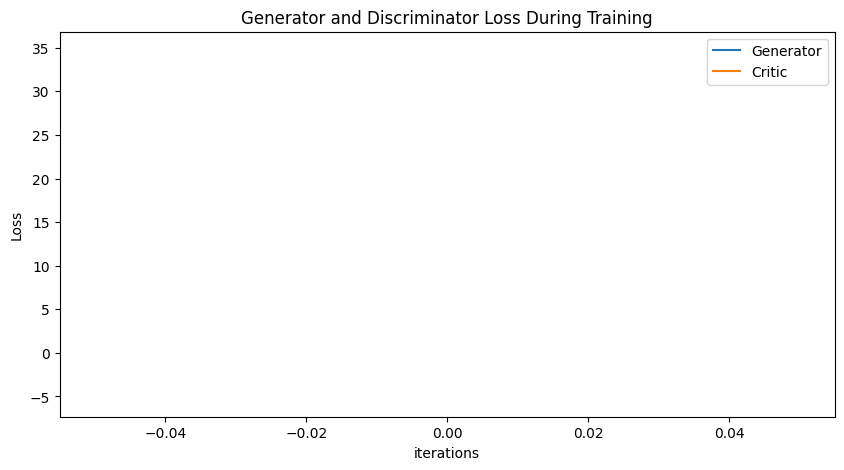

Epoch 10: Critic error ([34.833952380099944, 27.956688501071856, -5.818056916722526, -9.898236182588928, -9.049508205360635, -15.026790413443871, -10.349790147471086, -10.883548145689325, -16.742314651413235, -14.758788593541144, -18.740192670736235]) Generator err ([-5.323647499084473, 13.577136039733887, 39.67827606201172, 57.744964599609375, 19.296354293823242, 60.645145416259766, 43.648712158203125, 97.1063232421875, 60.02141189575195, 75.506103515625, 49.465538024902344])


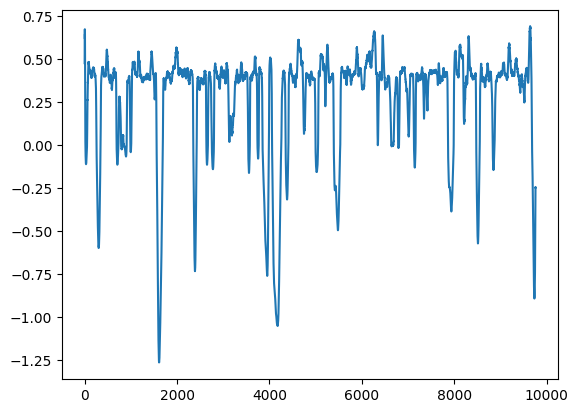

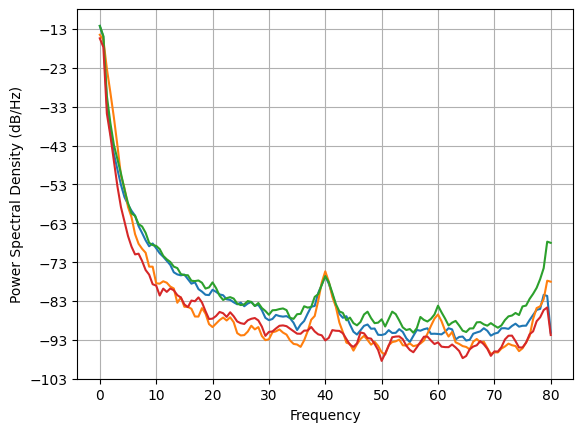

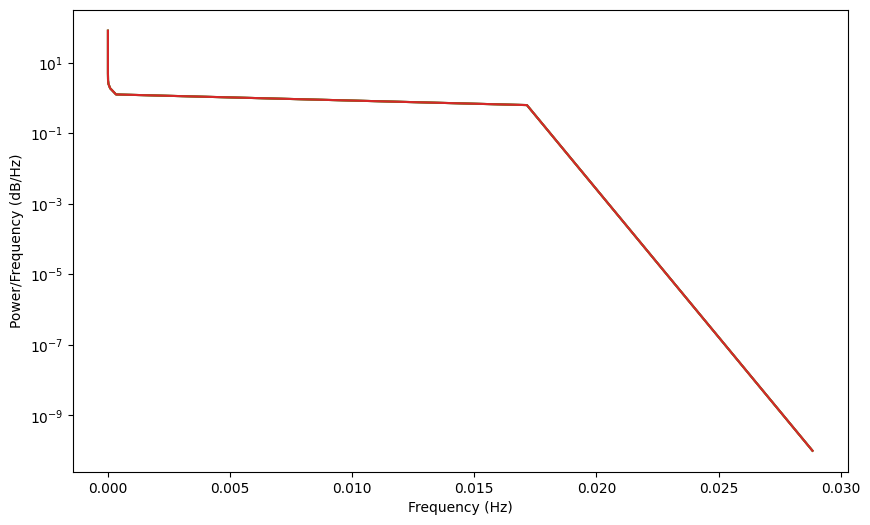

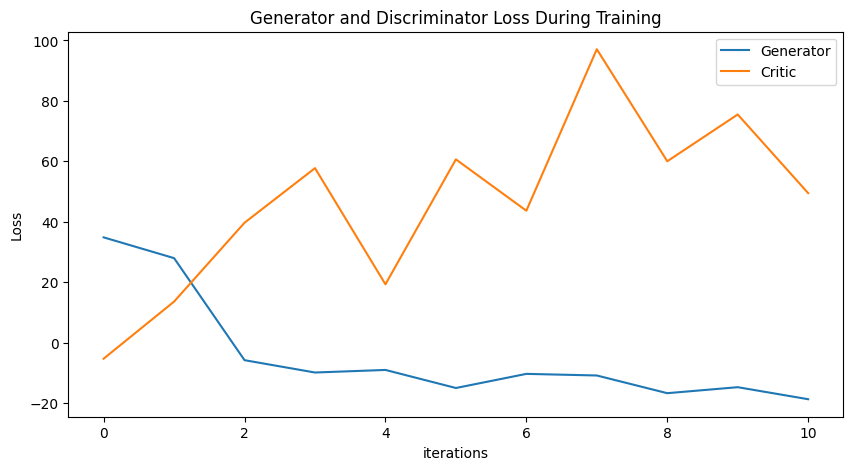

Epoch 20: Critic error ([34.833952380099944, 27.956688501071856, -5.818056916722526, -9.898236182588928, -9.049508205360635, -15.026790413443871, -10.349790147471086, -10.883548145689325, -16.742314651413235, -14.758788593541144, -18.740192670736235, -19.698088381106366, -22.37637051026664, -21.54821063749752, -16.80425722504641, -16.754622116374062, -12.685491186249202, -12.717651645864944, -13.36463681656202, -13.332133200640259, -13.125799795229081]) Generator err ([-5.323647499084473, 13.577136039733887, 39.67827606201172, 57.744964599609375, 19.296354293823242, 60.645145416259766, 43.648712158203125, 97.1063232421875, 60.02141189575195, 75.506103515625, 49.465538024902344, 73.21574401855469, 54.994789123535156, 65.63176727294922, 42.555057525634766, 30.139265060424805, 29.383068084716797, 26.127986907958984, 26.661502838134766, 25.126136779785156, 24.63695526123047])


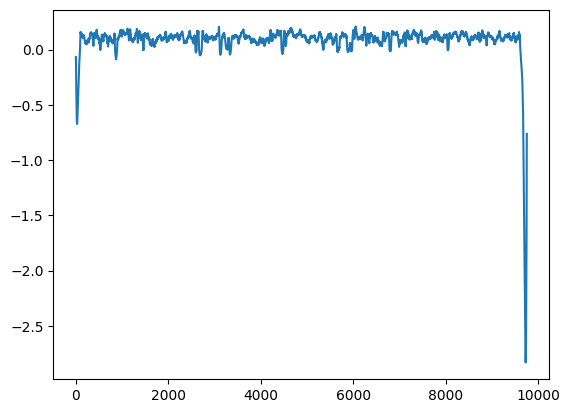

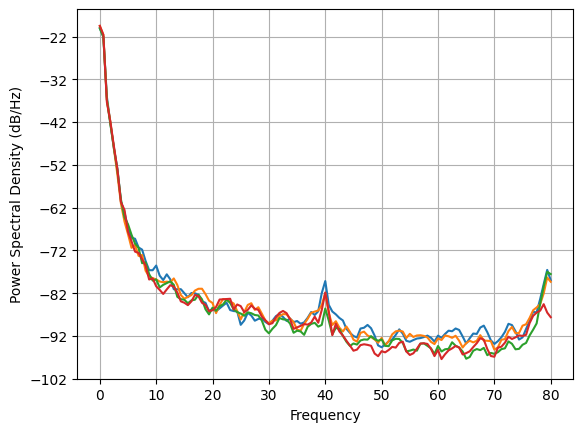

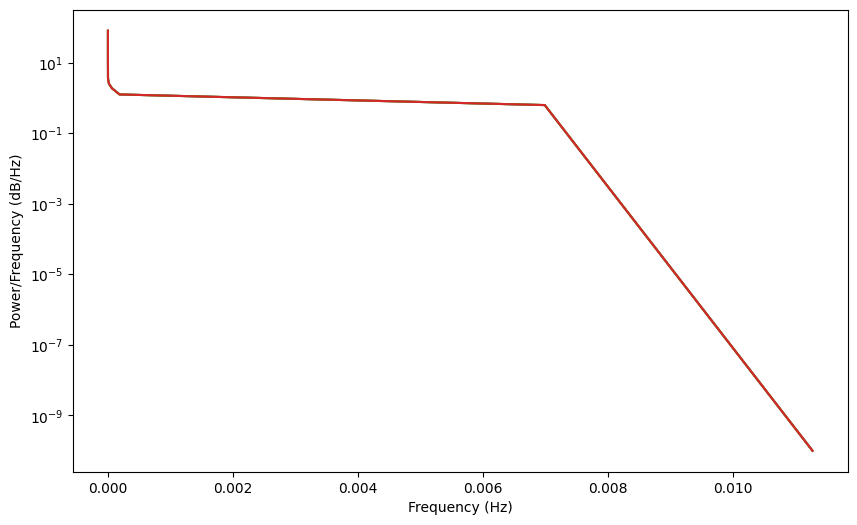

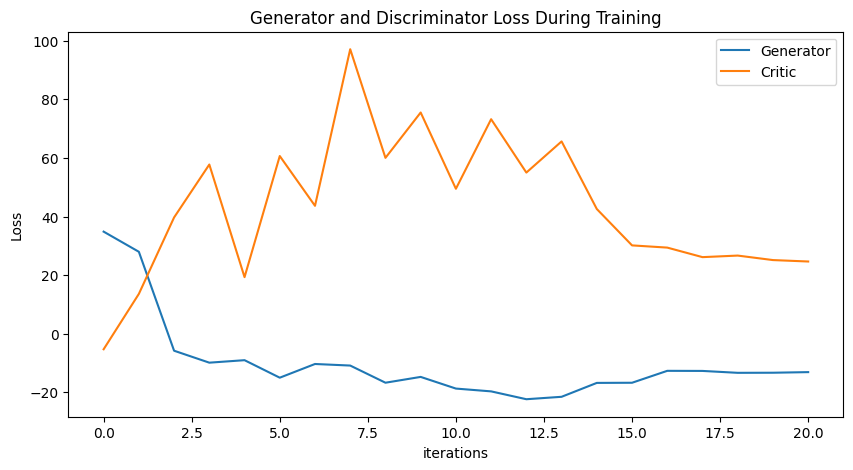

KeyboardInterrupt: 

In [26]:
NUM_EPOCHS = 300
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(training_data_closed)[0]
train_loader = DataLoader(TensorDataset(torch.tensor(training_data_closed).detach()), batch_size=BATCH_SIZE, shuffle=True)

def spectral_loss(real_data, fake_data):
    fft_real = rfft(real_data)
    fft_fake = rfft(fake_data)
    magnitude_real = torch.sqrt(fft_real.real**2 + fft_real.imag**2)
    magnitude_fake = torch.sqrt(fft_fake.real**2 + fft_fake.imag**2)
    return F.mse_loss(magnitude_real, magnitude_fake)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, NUM_CHANNELS, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(NUM_CHANNELS, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(NUM_CHANNELS, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, NUM_CHANNELS, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            (real, ) = next(iter(train_loader))
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)
            noise = sample_normal_distribution(BATCH_SIZE, 200, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty(D, real, fake) * LAMBDA_GP
            D.zero_grad()
            # normal WGAN-GP loss
            loss_critic = loss_critic_real + loss_critic_fake + gp
            # add spectral loss
            loss_critic +=  (spectral_loss(real.data, fake.data) * 0.005)
            loss_critic.backward()
            critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 200, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        loss_gen -= (spectral_loss(real.data, fake.data) * SPECTRAL_LOSS_FACTOR)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_data_closed, disc, gen = train()

torch.save(gen, 'generator-spectral.pt')
torch.save(disc, 'discriminator-spectral.pt')
np.save('4ch-spectral.npy', generated_data_closed.detach())
plot_everything(generated_data_closed, gen_err, critic_err)
generated_data_closed = None

# Same as above, different spectral loss magnitude

Epoch 0: Critic error ([29.485516883929883]) Generator err ([-22.087566375732422])
Epoch 0: Spectral critic error ([tensor(6010.7683, dtype=torch.float64), tensor(6004.3773, dtype=torch.float64), tensor(6009.3467, dtype=torch.float64), tensor(6002.9378, dtype=torch.float64), tensor(5991.8323, dtype=torch.float64)]) Spectral generator err ([tensor(5996.8111, dtype=torch.float64)])


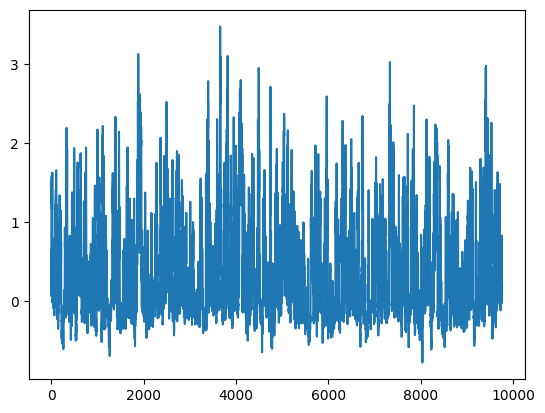

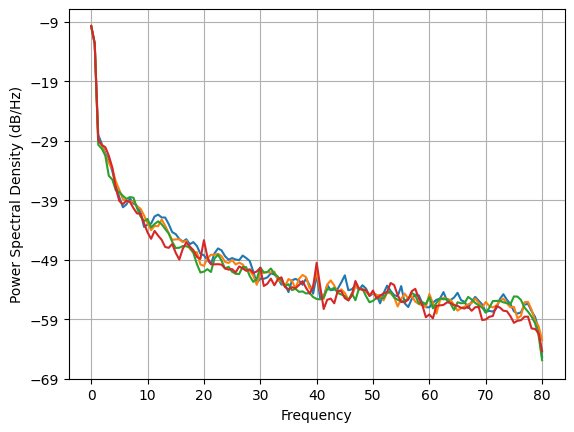

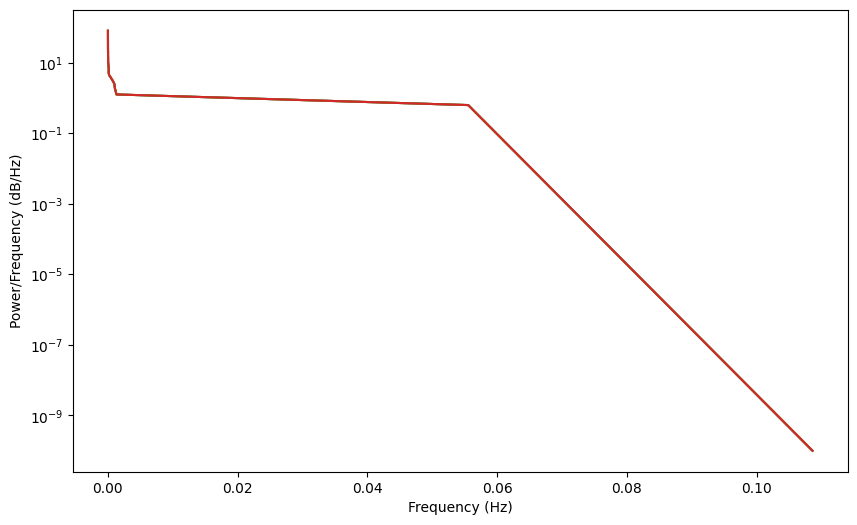

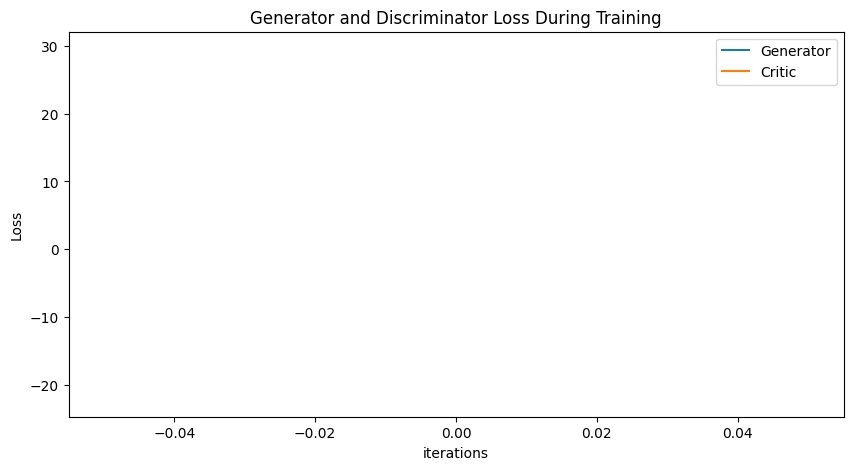

Epoch 10: Critic error ([29.485516883929883, 29.61890981460374, -1.8295364380382964, -8.173624058964613, -9.36259497342376, -12.263251854877897, -3.2877397835229267, -16.55465226131147, -18.29796373031348, -22.719942567091685, -17.50850749876269]) Generator err ([-22.087566375732422, -24.00018882751465, 74.89057922363281, 52.29327392578125, 25.588478088378906, 52.248390197753906, 48.3138542175293, 42.17371368408203, 54.40047073364258, 94.241943359375, 40.046268463134766])
Epoch 10: Spectral critic error ([tensor(6010.7683, dtype=torch.float64), tensor(6004.3773, dtype=torch.float64), tensor(6009.3467, dtype=torch.float64), tensor(6002.9378, dtype=torch.float64), tensor(5991.8323, dtype=torch.float64), tensor(5804.9846, dtype=torch.float64), tensor(5802.6457, dtype=torch.float64), tensor(5803.2195, dtype=torch.float64), tensor(5798.4088, dtype=torch.float64), tensor(5793.6265, dtype=torch.float64), tensor(5683.7027, dtype=torch.float64), tensor(5652.9397, dtype=torch.float64), tensor(56

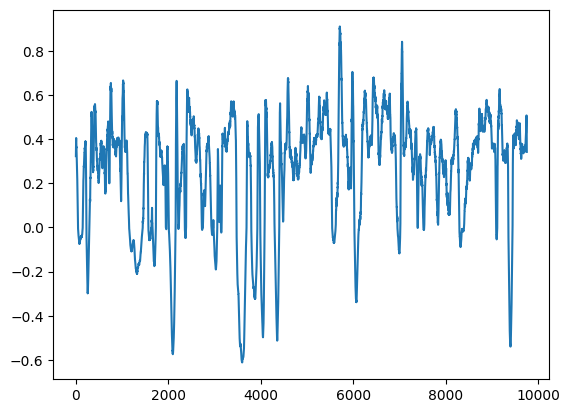

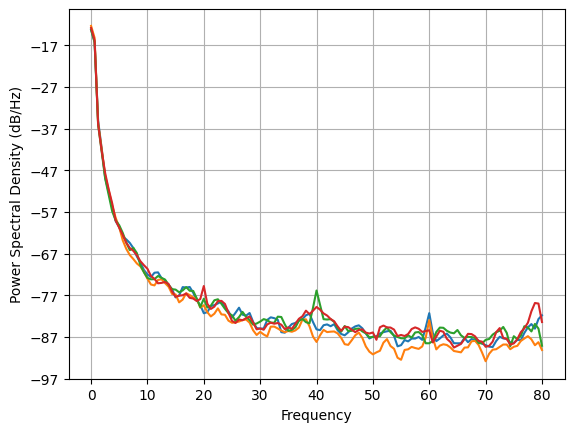

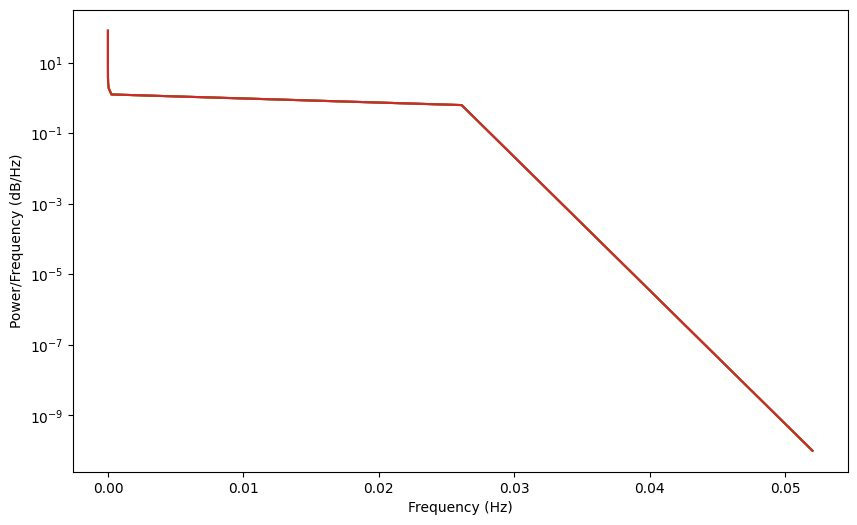

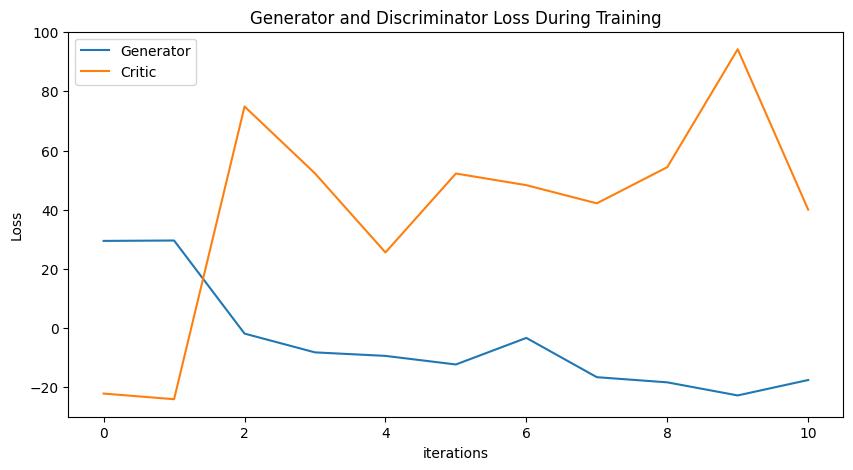

Epoch 20: Critic error ([29.485516883929883, 29.61890981460374, -1.8295364380382964, -8.173624058964613, -9.36259497342376, -12.263251854877897, -3.2877397835229267, -16.55465226131147, -18.29796373031348, -22.719942567091685, -17.50850749876269, -17.925576893837118, -24.340635927324897, -19.780457340209654, -17.864841200872924, -16.21342530771618, -16.914085999180024, -14.093704965415919, -20.72900383332172, -18.91461210614723, -18.217783640768076]) Generator err ([-22.087566375732422, -24.00018882751465, 74.89057922363281, 52.29327392578125, 25.588478088378906, 52.248390197753906, 48.3138542175293, 42.17371368408203, 54.40047073364258, 94.241943359375, 40.046268463134766, 41.675498962402344, 43.96702575683594, 37.29881286621094, 39.196083068847656, 29.16444206237793, 33.72837448120117, 52.3489875793457, 38.150630950927734, 35.14801025390625, 34.921234130859375])
Epoch 20: Spectral critic error ([tensor(6010.7683, dtype=torch.float64), tensor(6004.3773, dtype=torch.float64), tensor(60

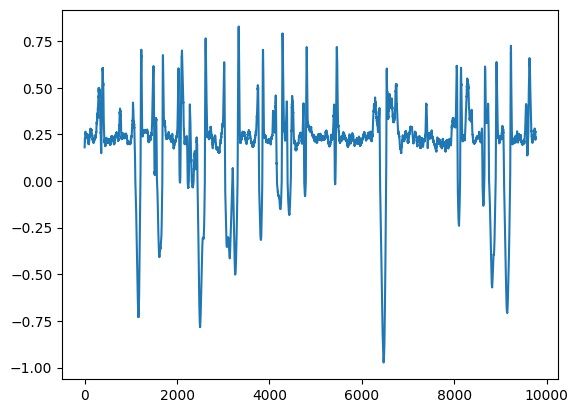

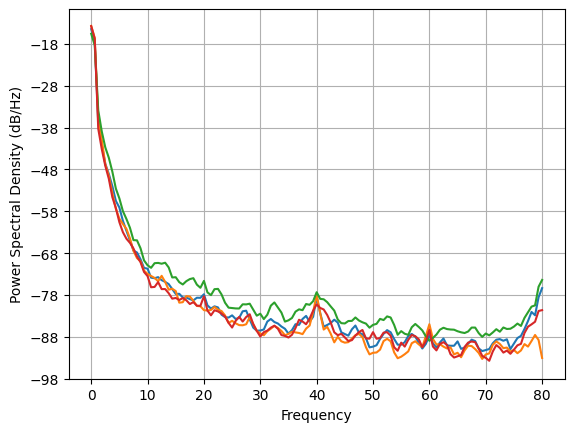

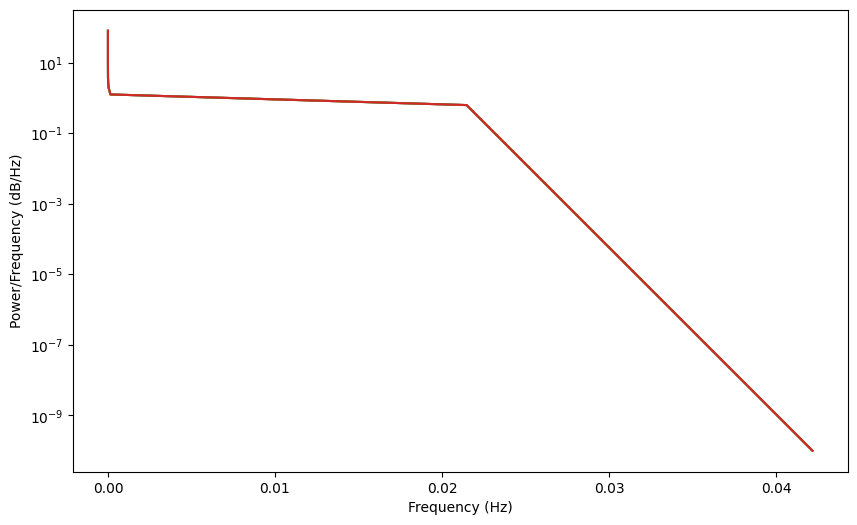

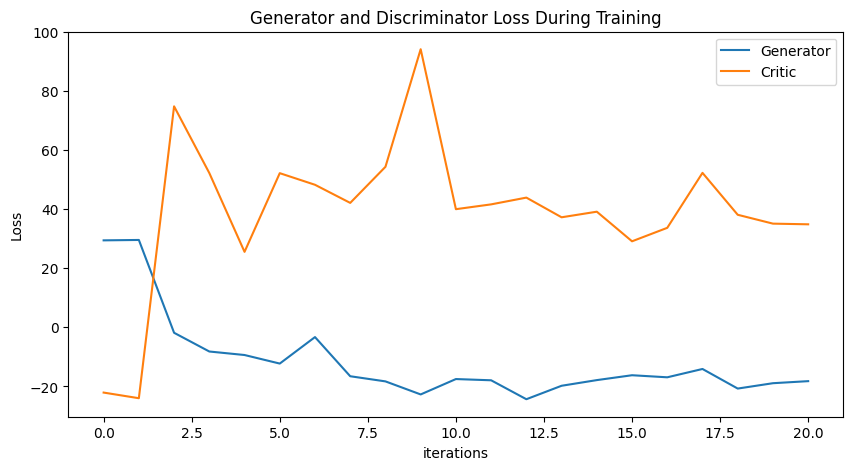

Epoch 30: Critic error ([29.485516883929883, 29.61890981460374, -1.8295364380382964, -8.173624058964613, -9.36259497342376, -12.263251854877897, -3.2877397835229267, -16.55465226131147, -18.29796373031348, -22.719942567091685, -17.50850749876269, -17.925576893837118, -24.340635927324897, -19.780457340209654, -17.864841200872924, -16.21342530771618, -16.914085999180024, -14.093704965415919, -20.72900383332172, -18.91461210614723, -18.217783640768076, -17.288972648073575, -17.415384906930232, -17.988500467033194, -19.796901636709826, -17.13223475628672, -15.511713518231147, -16.669077213481035, -15.271983814675044, -14.376655969527736, -14.694204693557221]) Generator err ([-22.087566375732422, -24.00018882751465, 74.89057922363281, 52.29327392578125, 25.588478088378906, 52.248390197753906, 48.3138542175293, 42.17371368408203, 54.40047073364258, 94.241943359375, 40.046268463134766, 41.675498962402344, 43.96702575683594, 37.29881286621094, 39.196083068847656, 29.16444206237793, 33.72837448

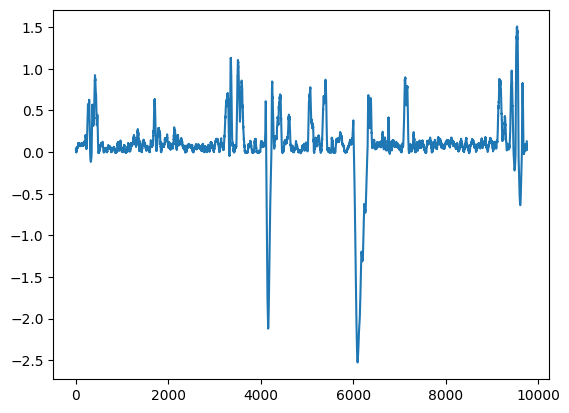

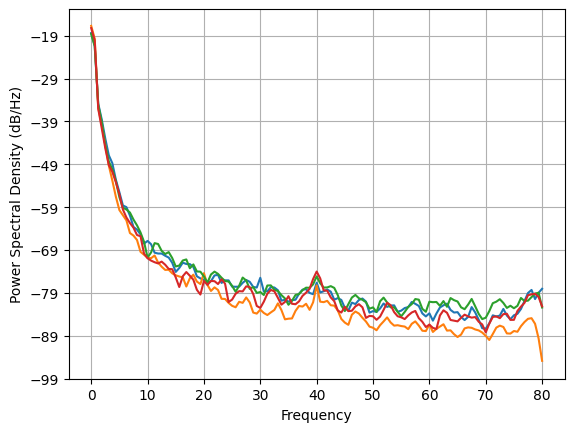

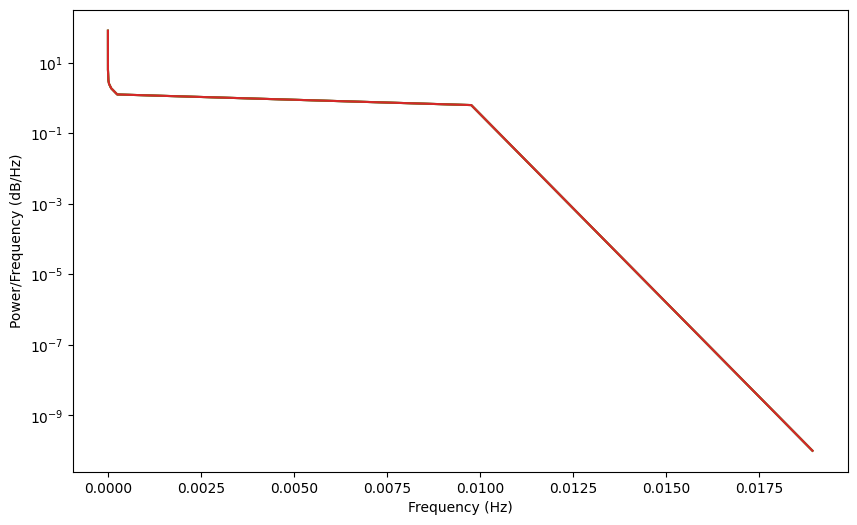

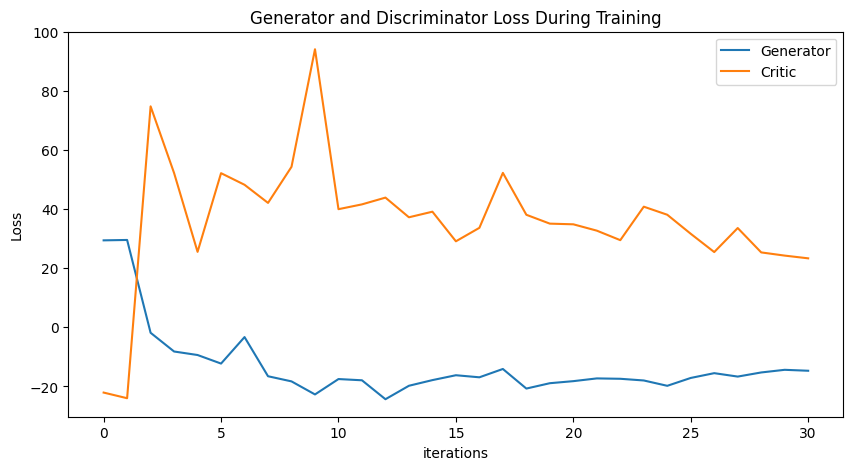

KeyboardInterrupt: 

In [25]:
NUM_EPOCHS = 300
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(training_data_closed)[0]
train_loader = DataLoader(TensorDataset(torch.tensor(training_data_closed).detach()), batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, NUM_CHANNELS, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(NUM_CHANNELS, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(NUM_CHANNELS, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, NUM_CHANNELS, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def spectral_loss(real_data, fake_data):
    fft_real = rfft(real_data)
    fft_fake = rfft(fake_data)
    magnitude_real = torch.sqrt(fft_real.real**2 + fft_real.imag**2)
    magnitude_fake = torch.sqrt(fft_fake.real**2 + fft_fake.imag**2)
    return F.mse_loss(magnitude_real, magnitude_fake)

def train():
    critic_err, gen_err, generated_data = [], [], None
    spec_critic_err, spec_gen_err = [], []
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            (real, ) = next(iter(train_loader))
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)
            noise = sample_normal_distribution(BATCH_SIZE, 200, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty(D, real, fake) * LAMBDA_GP
            D.zero_grad()
            # normal WGAN-GP loss
            loss_critic = loss_critic_real + loss_critic_fake + gp
            # add spectral loss
            spec_loss = spectral_loss(real.data, fake.data)
            spec_critic_err.append(spec_loss)
            loss_critic +=  (spec_loss * 0.005)
            loss_critic.backward()
            critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 200, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        spec_loss = spectral_loss(real.data, fake.data)
        spec_gen_err.append(spec_loss)
        loss_gen -= (spec_loss * 0.005)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            print("Epoch %s: Spectral critic error (%s) Spectral generator err (%s)" % (epoch, spec_critic_err, spec_gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_data_closed, disc, gen = train()

torch.save(gen, 'generator-spectral.pt')
torch.save(disc, 'discriminator-spectral.pt')
np.save('4ch-spectral.npy', generated_data_closed.detach())
plot_everything(generated_data_closed, gen_err, critic_err)
generated_data_closed = None

# Same as above, DFT instead of FFT

Epoch 0: Critic error ([17.24636473329793]) Generator err ([25.51061093770808])


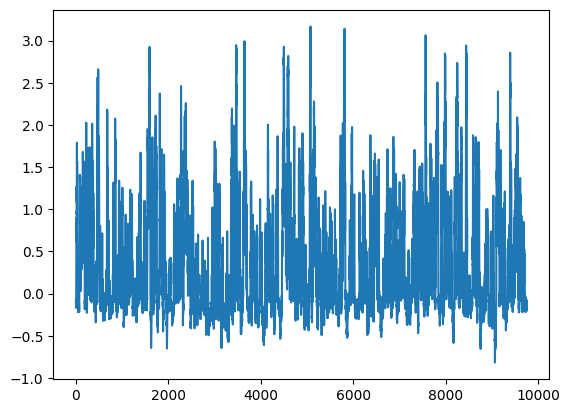

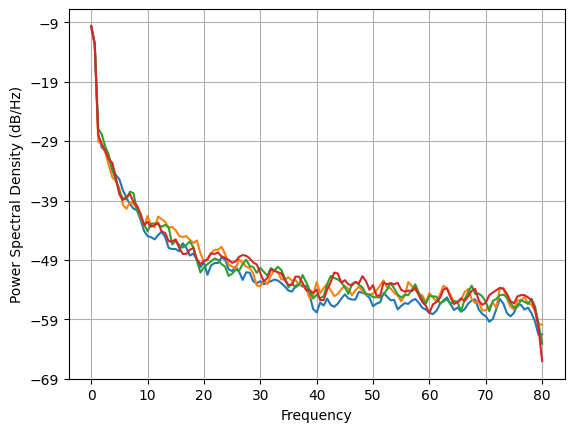

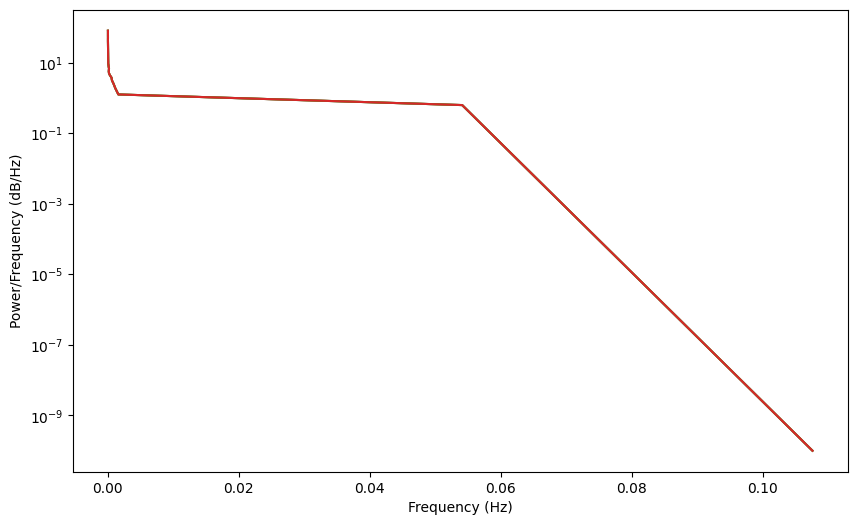

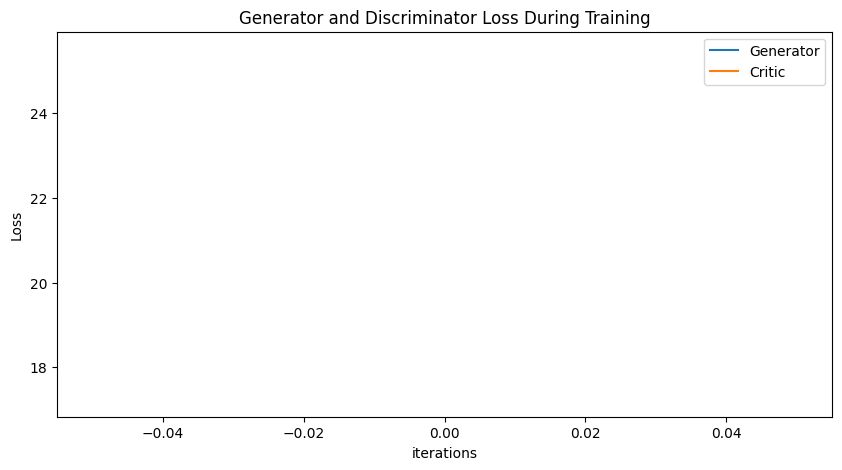

Epoch 10: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673]) Generator err ([25.51061093770808, 23.12580074561577, 15.82468511648981, -9.27888841132797, -54.23351849675631, -41.53710831203631, -191.91422344616467, -78.68181843558318, -170.34393585073474, -252.37335072710303, -273.39888066876216])


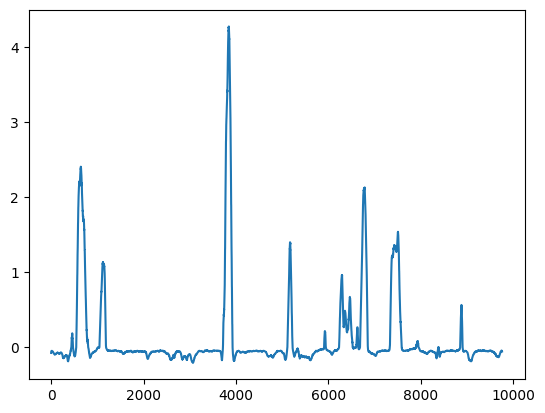

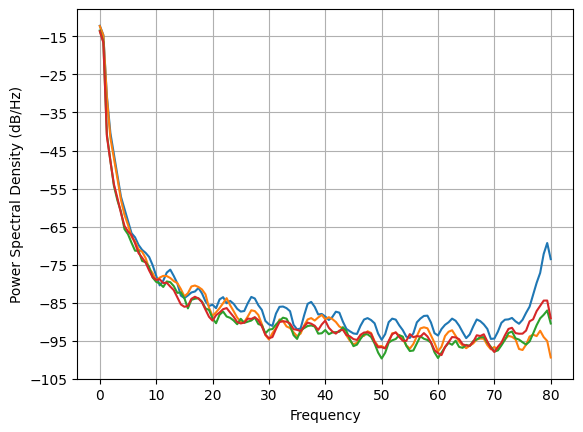

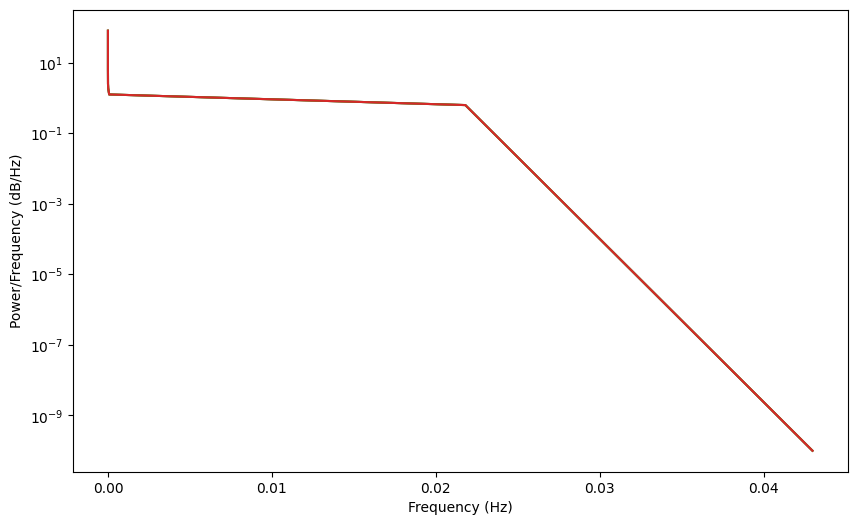

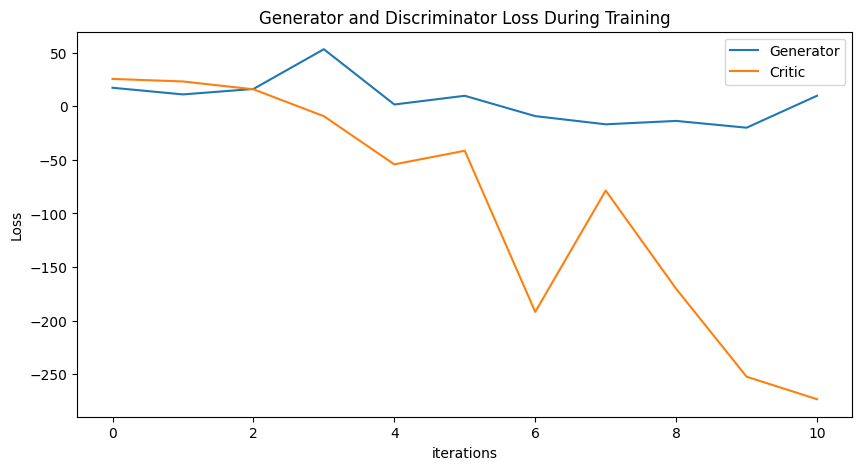

Epoch 20: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476]) Generator err ([25.51061093770808, 23.12580074561577, 15.82468511648981, -9.27888841132797, -54.23351849675631, -41.53710831203631, -191.91422344616467, -78.68181843558318, -170.34393585073474, -252.37335072710303, -273.39888066876216, -264.6860947847417, -252.7642056783809, -384.12073145009816, -217.62564287384922, -261.3012335434115, -264.9116045890093, -249.83831519575102, -236.59412495912386, -241.4156088999645, -257.39484160495715])


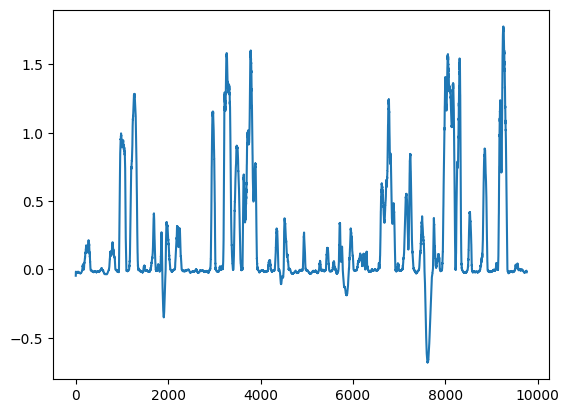

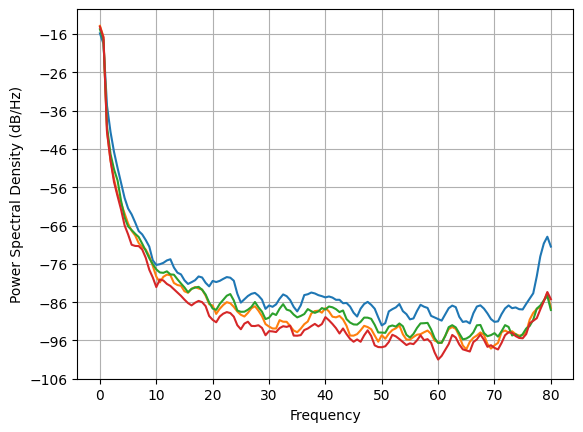

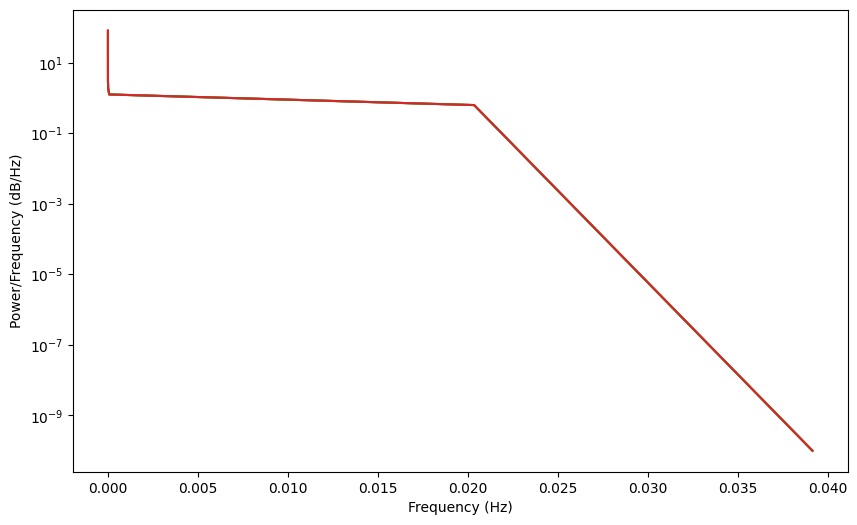

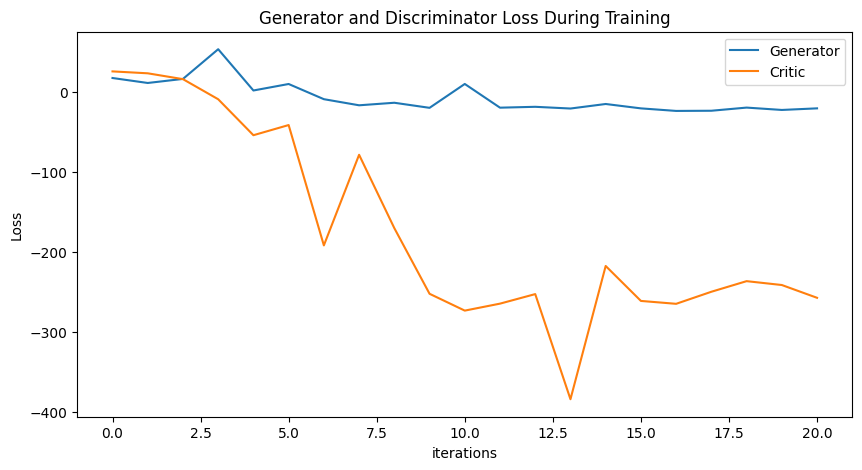

Epoch 30: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208]) Generator err ([25.51061093770808, 23.12580074561577, 15.82468511648981, -9.27888841132797, -54.23351849675631, -41.53710831203631, -191.91422344616467, -78.68181843558318, -170.34393585073474, -252.37335072710303, -273.39888066876216, -264.6860947847417, -252.7642056783809, -384.12073145009816, -217.62564287384922, -261.3012335434115, -264.

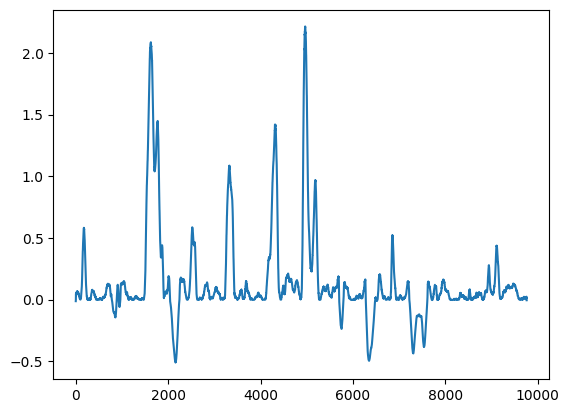

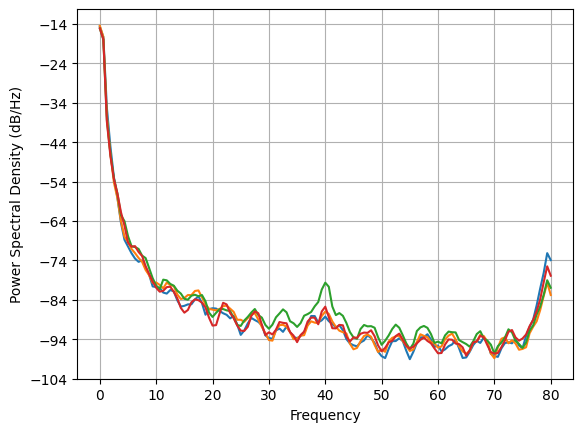

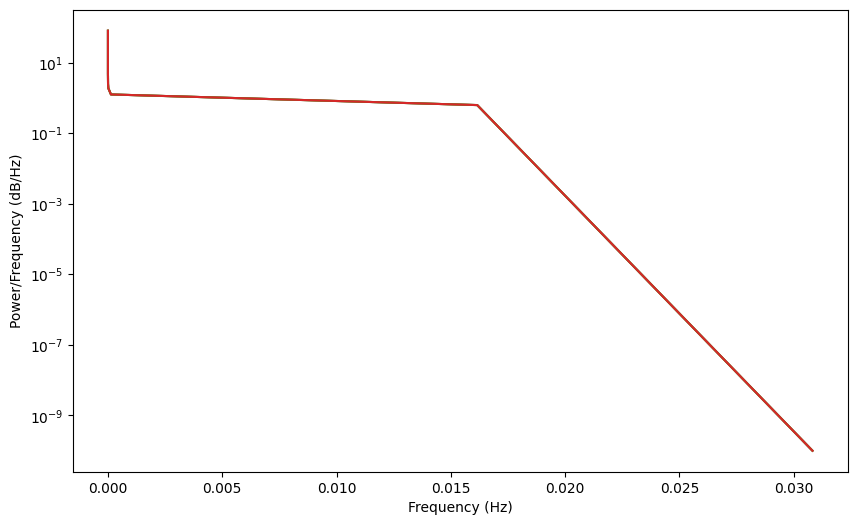

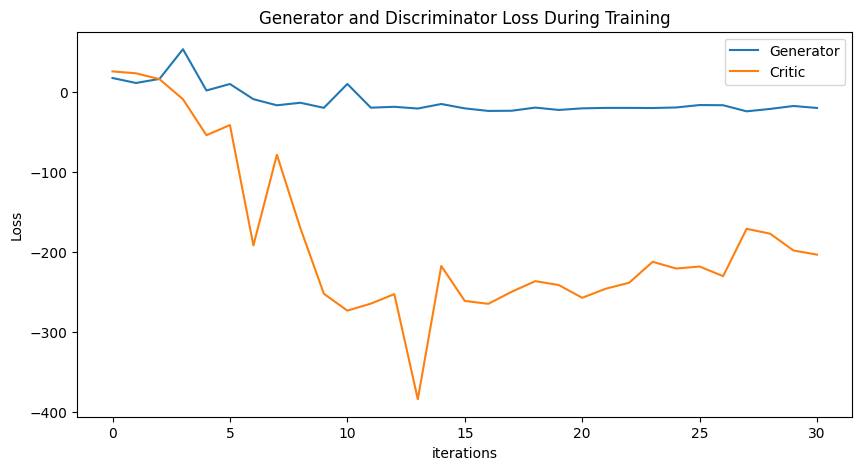

Epoch 40: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155]) Generator err ([25.51061093770808, 23.12580074561577, 15.82468511648981, -9.27888841132797, -54.23351849675631, -41.53710831203631, -191.9142

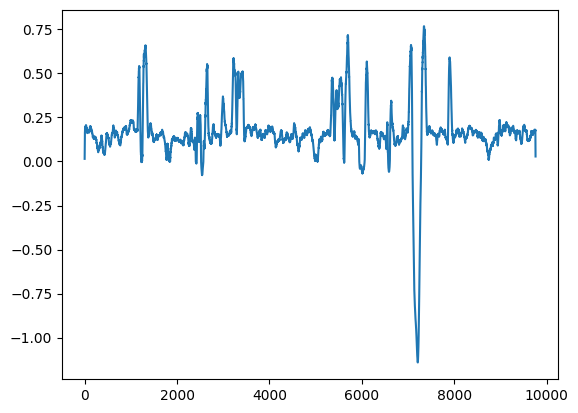

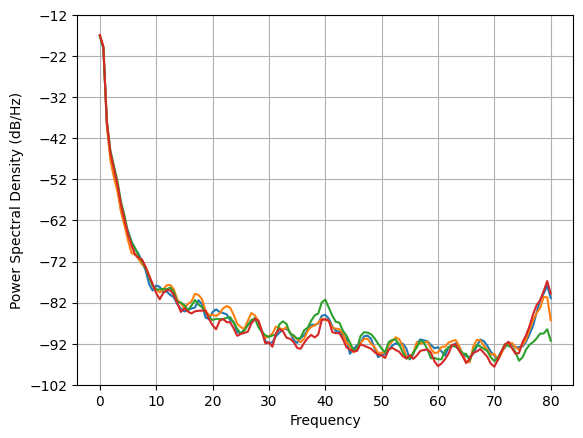

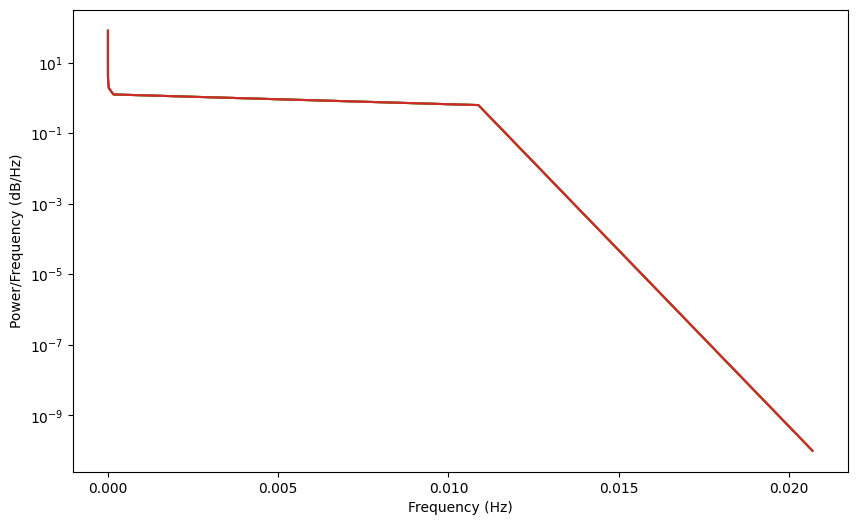

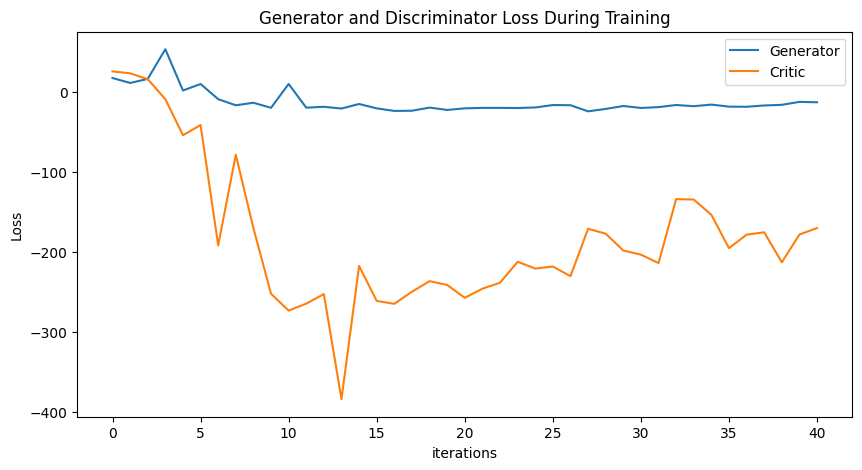

Epoch 50: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.0362612796758

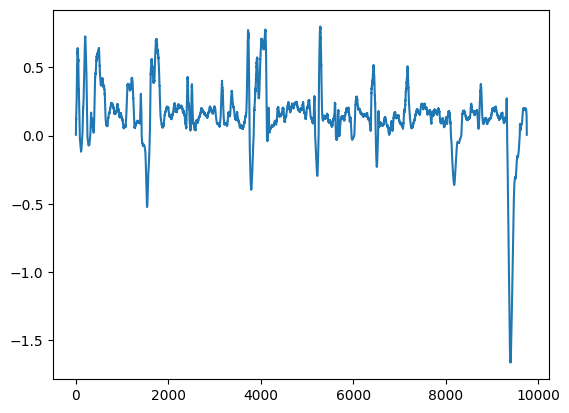

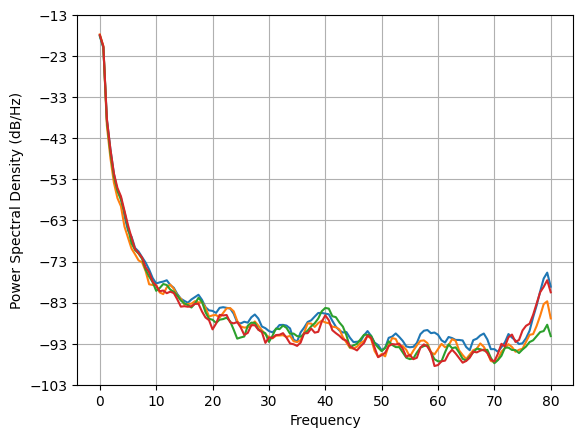

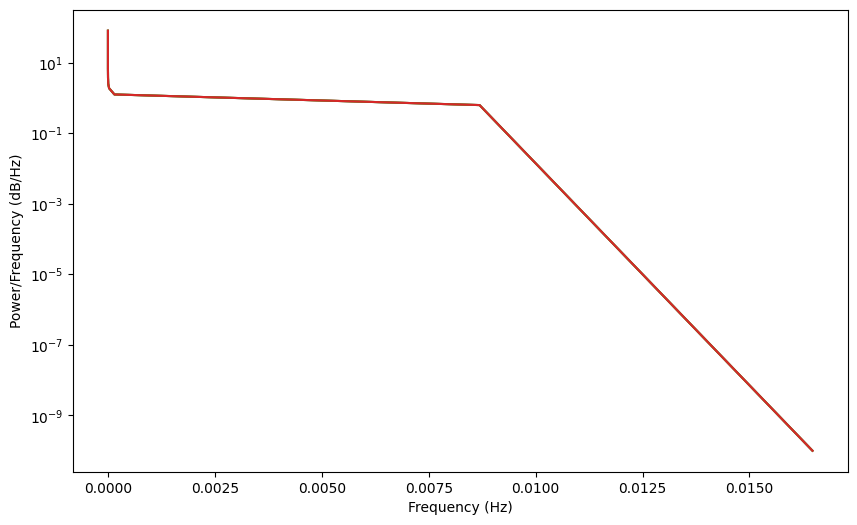

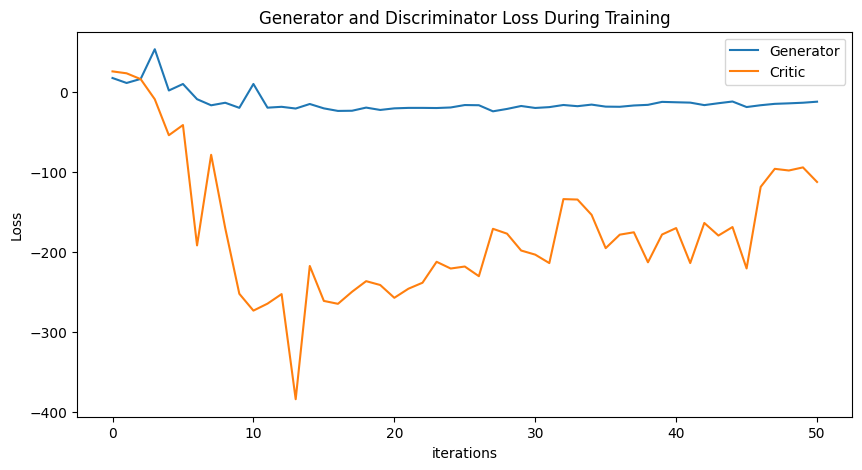

Epoch 60: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.0362612796758

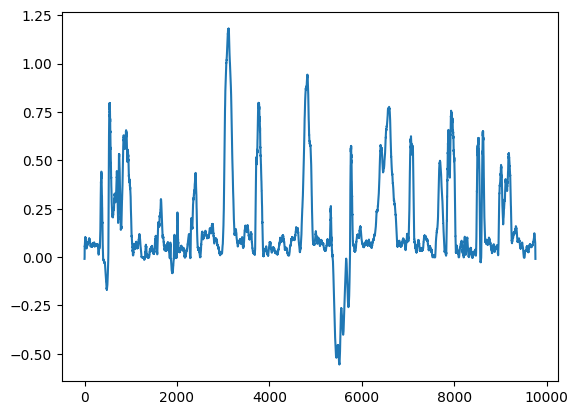

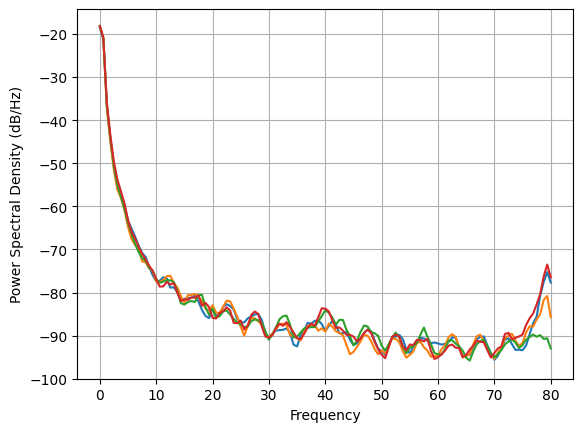

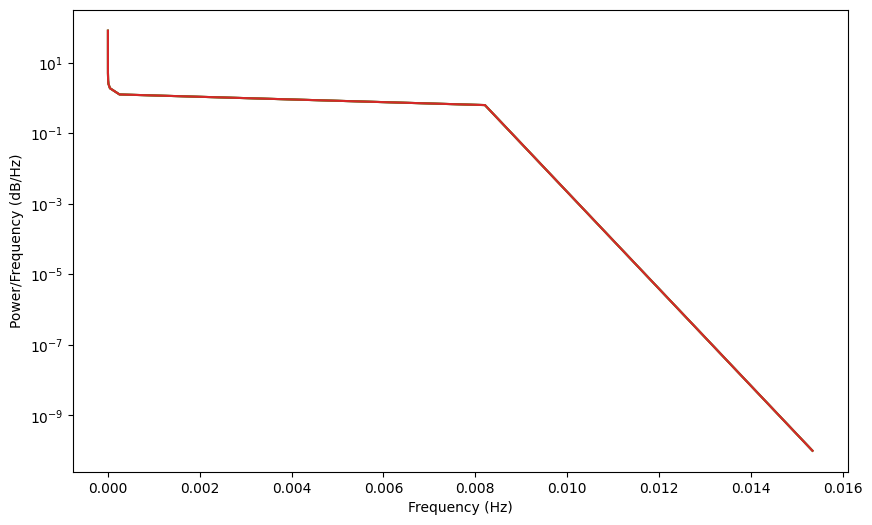

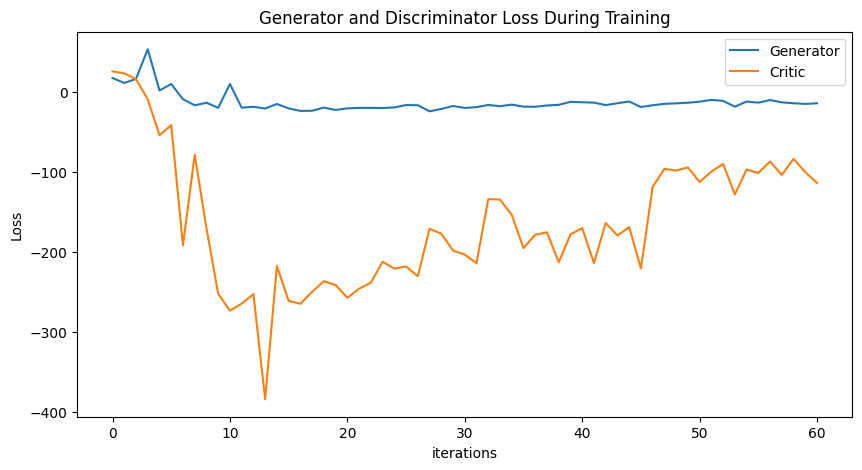

Epoch 70: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.0362612796758

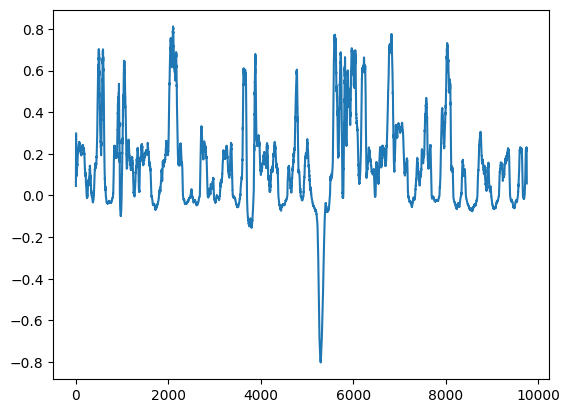

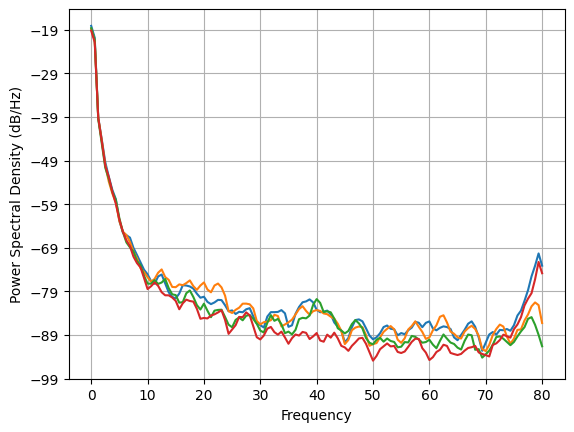

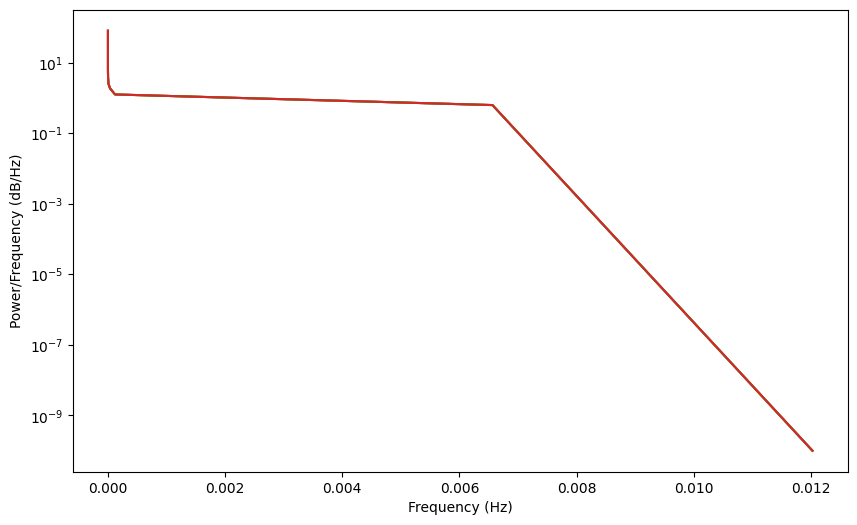

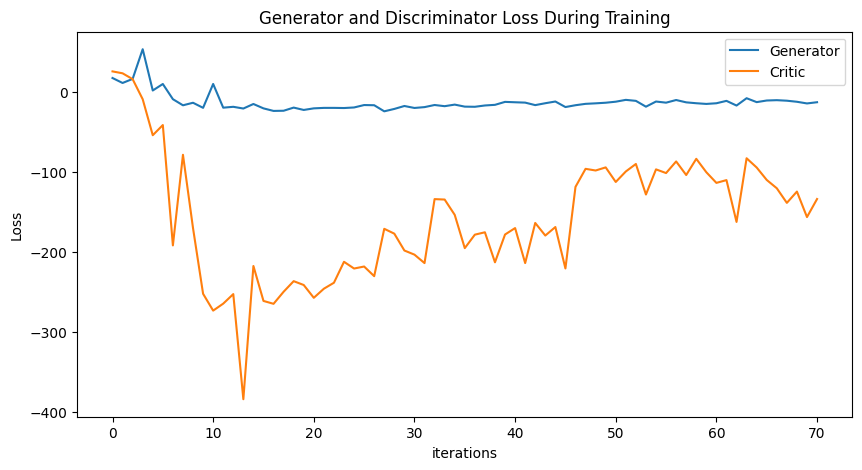

Epoch 80: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.0362612796758

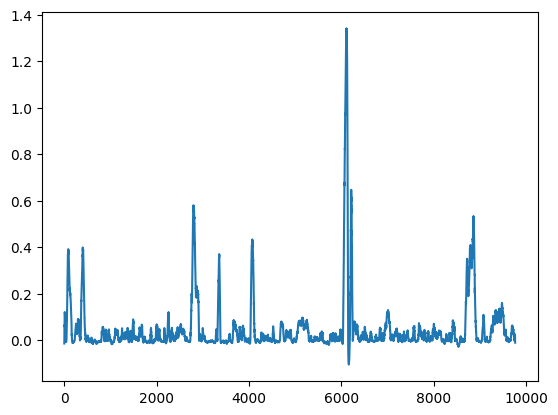

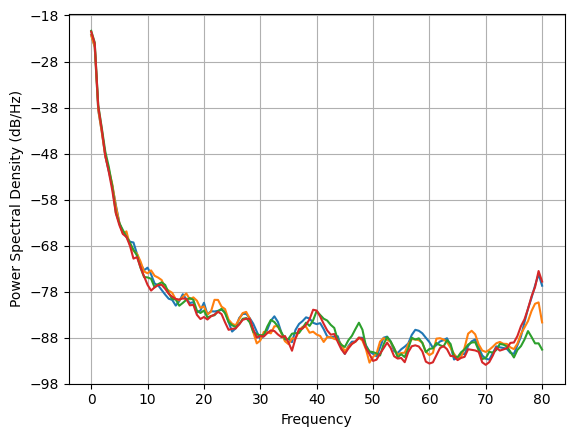

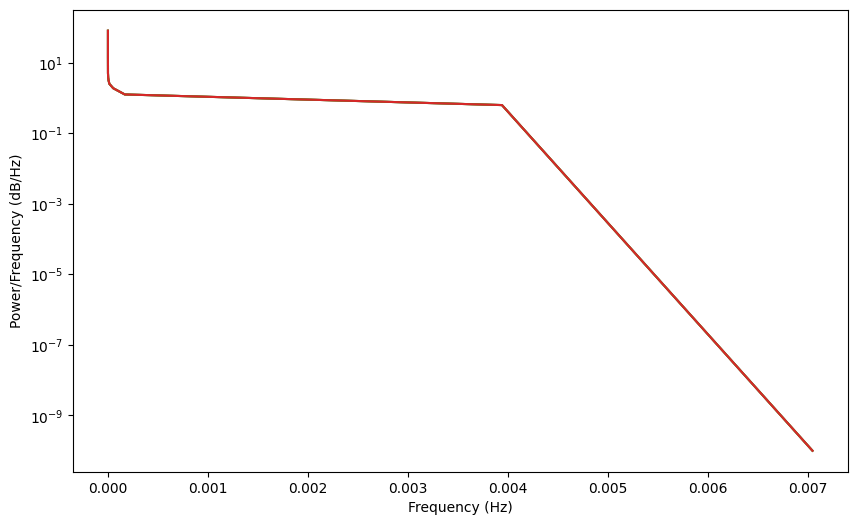

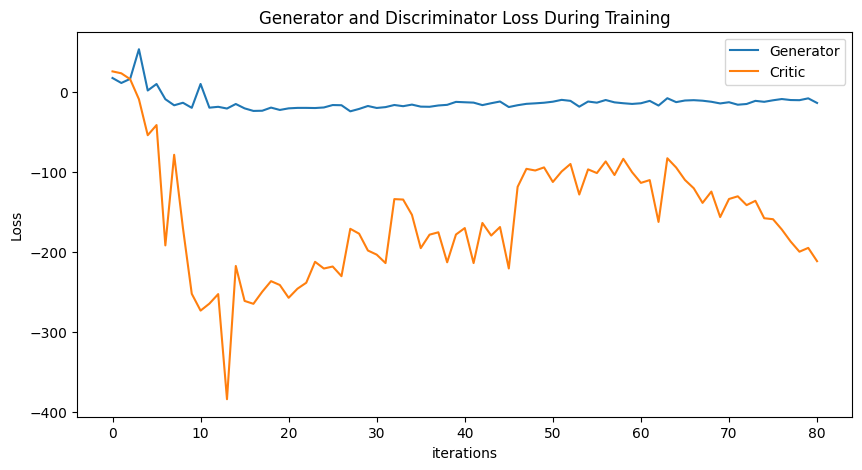

Epoch 90: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.0362612796758

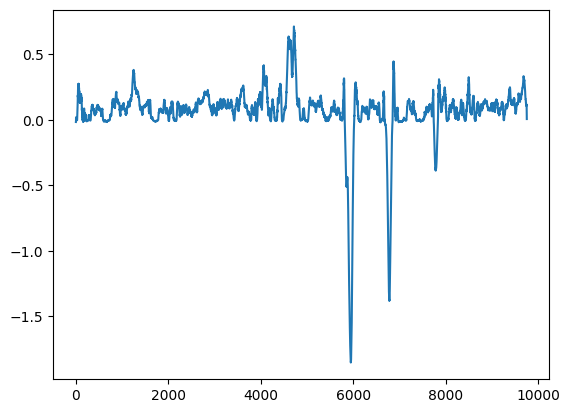

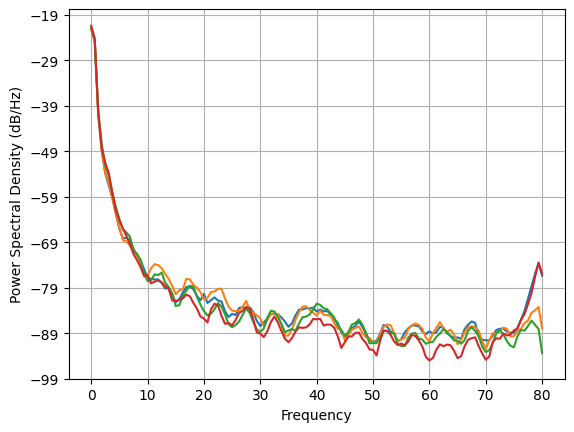

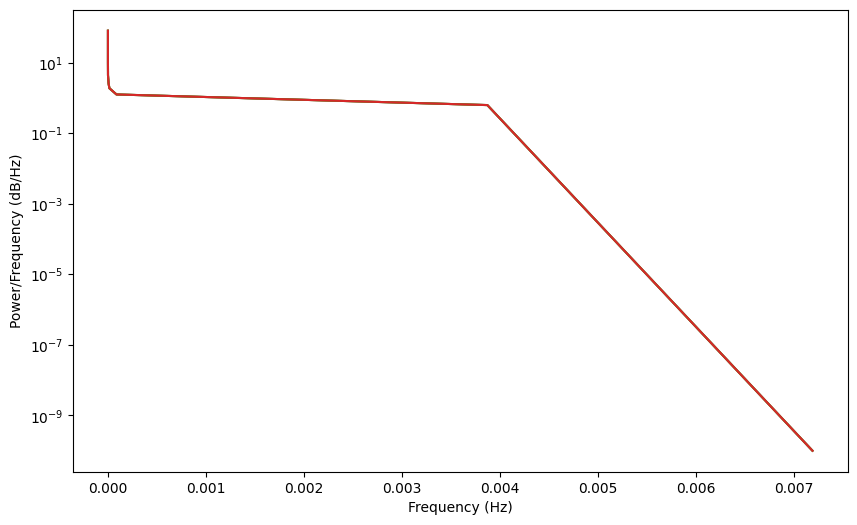

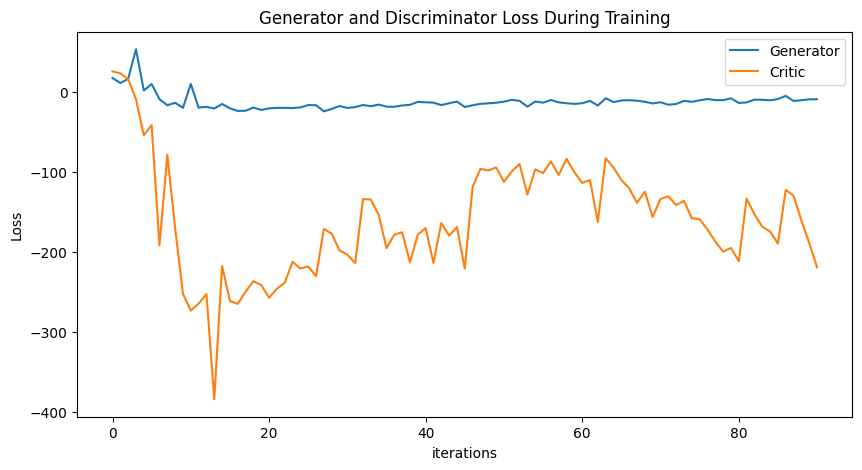

Epoch 100: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

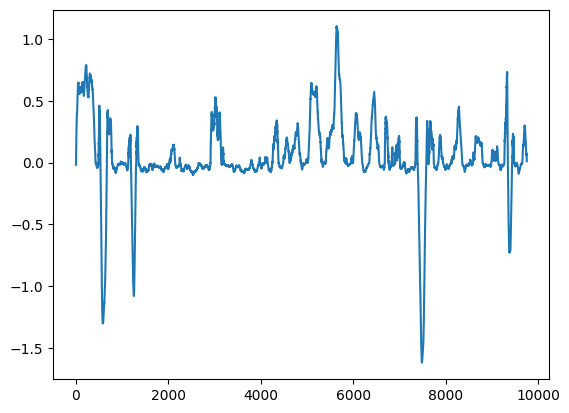

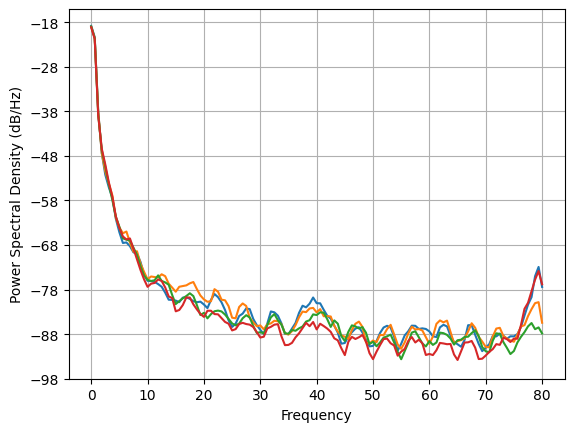

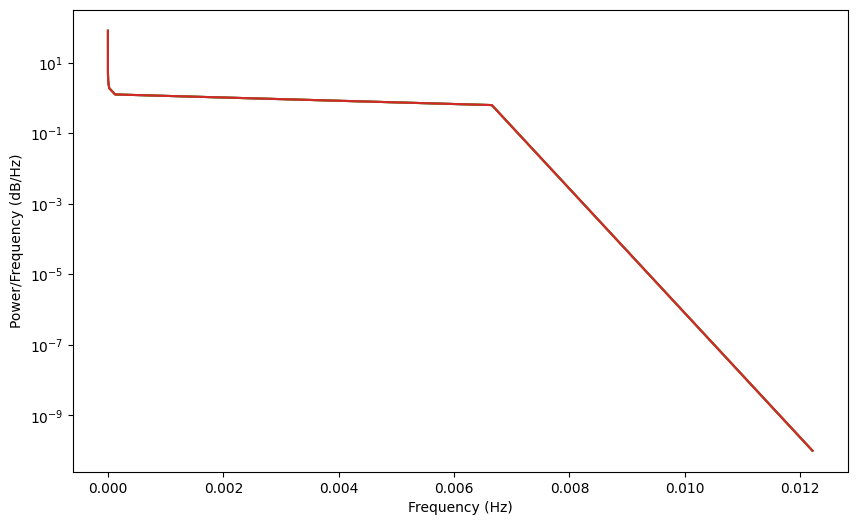

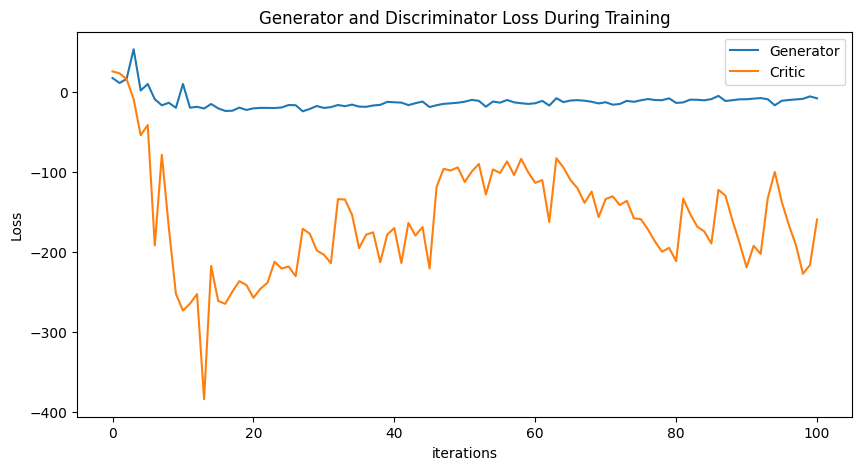

Epoch 110: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

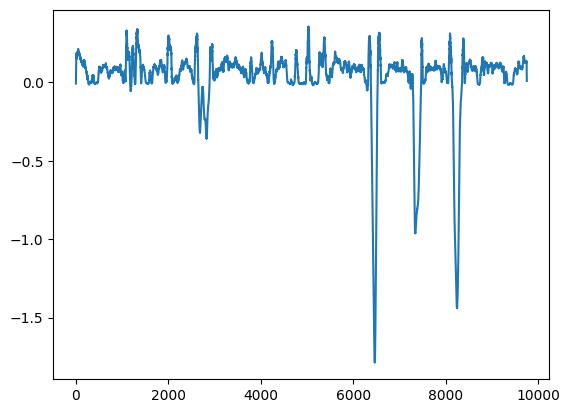

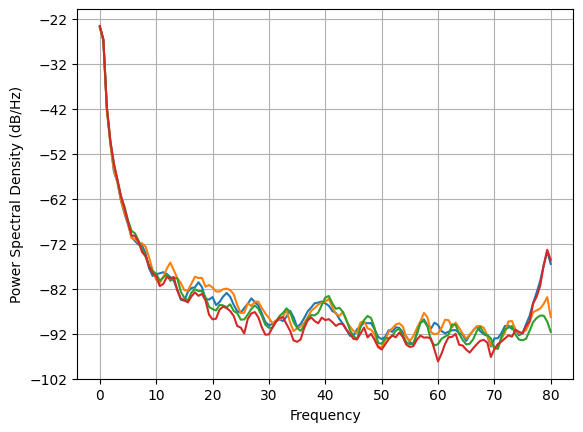

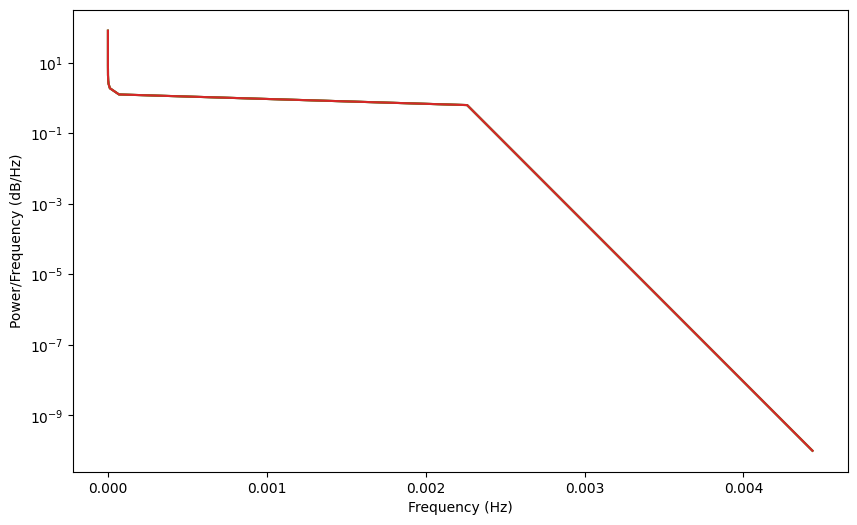

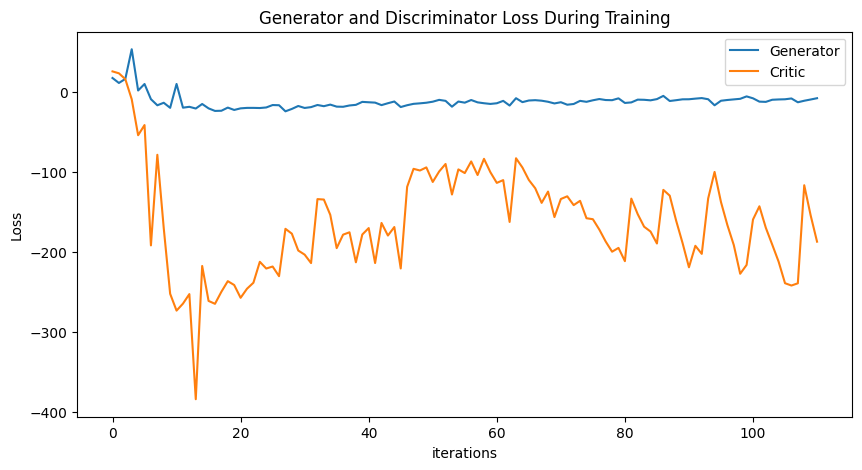

Epoch 120: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

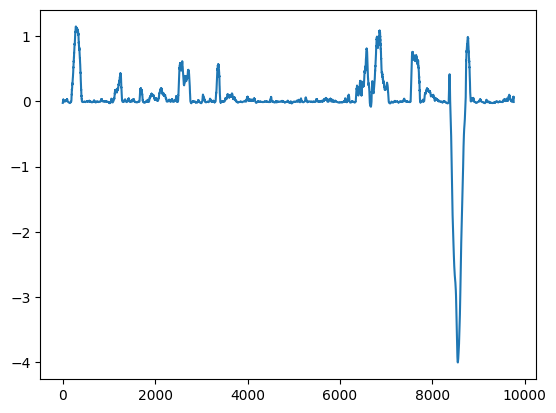

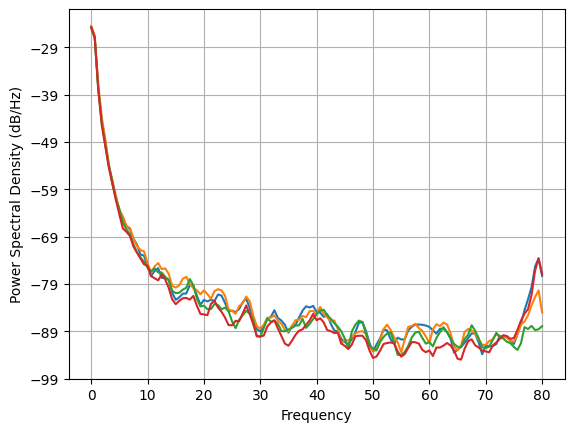

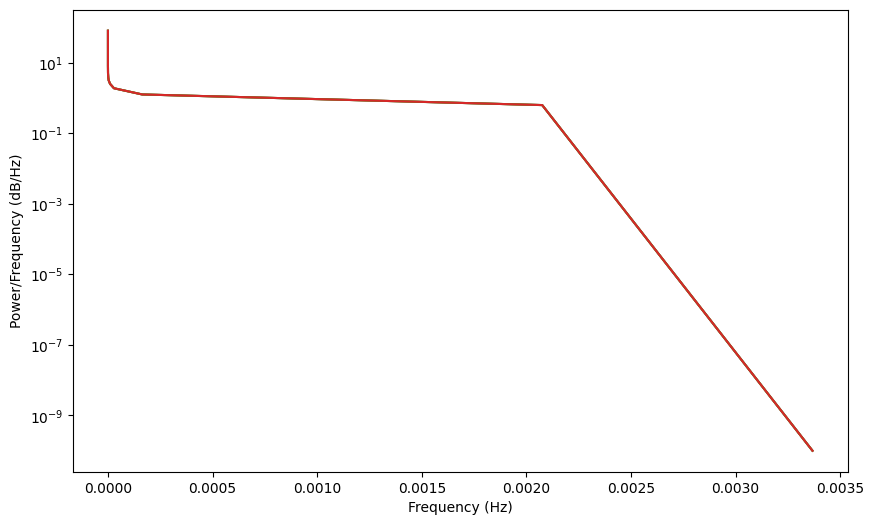

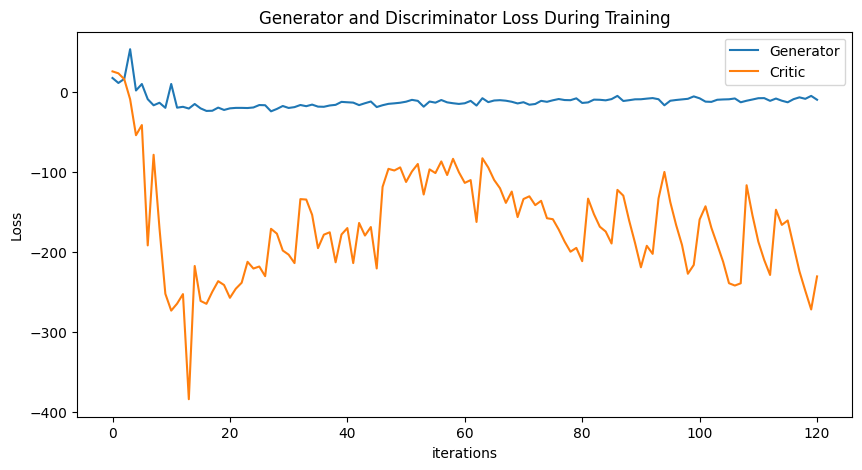

Epoch 130: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

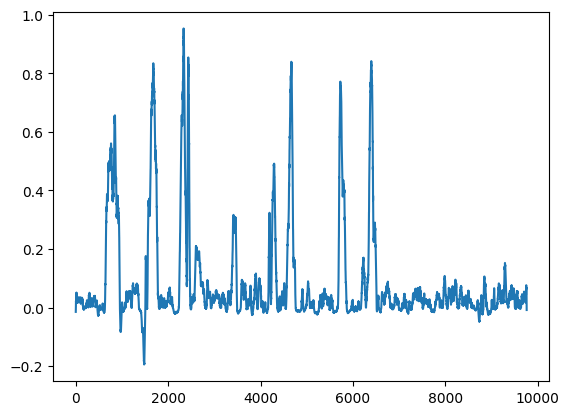

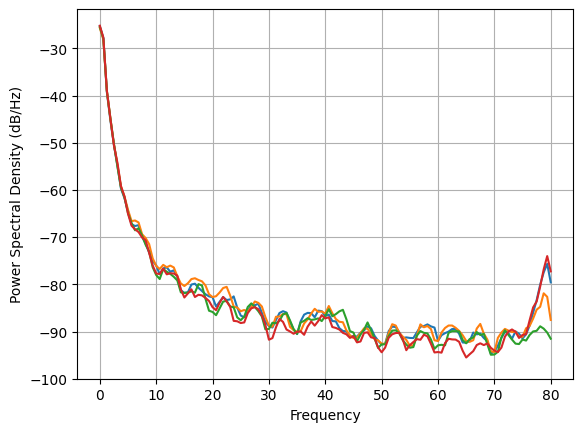

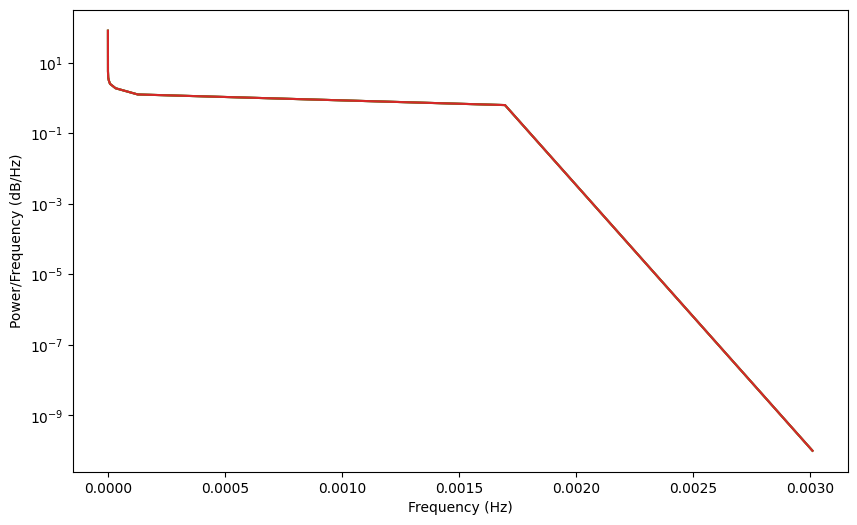

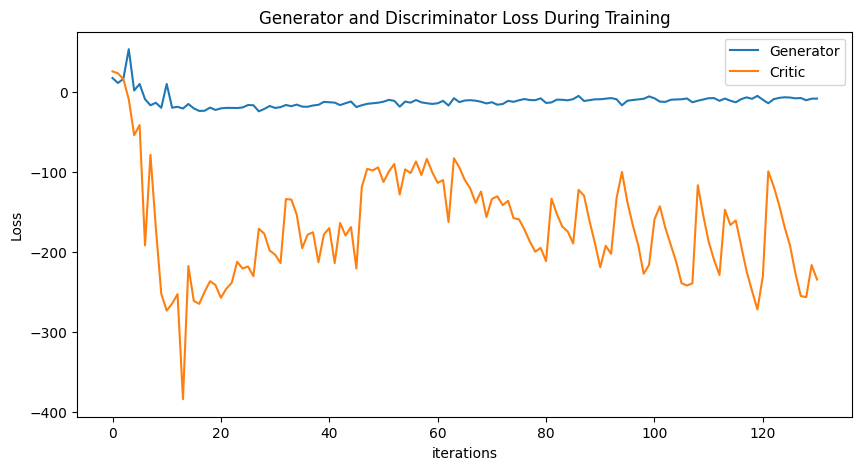

Epoch 140: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

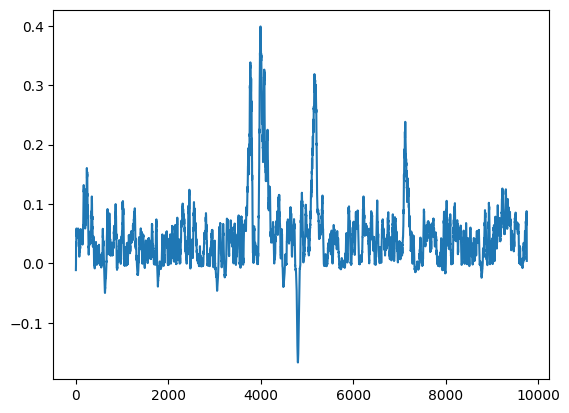

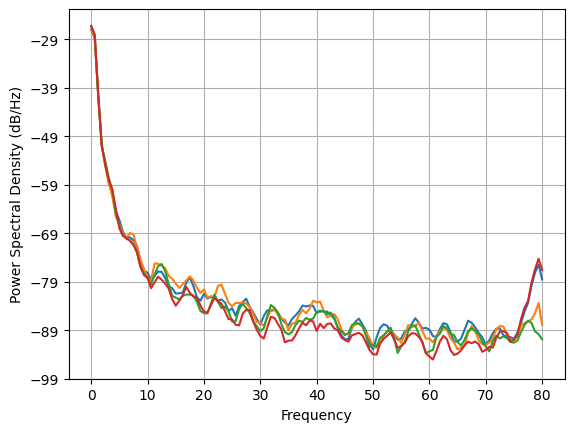

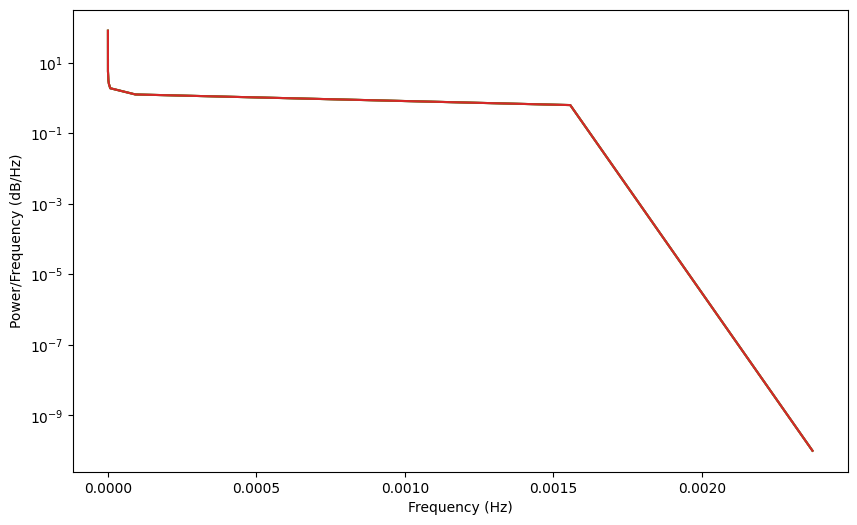

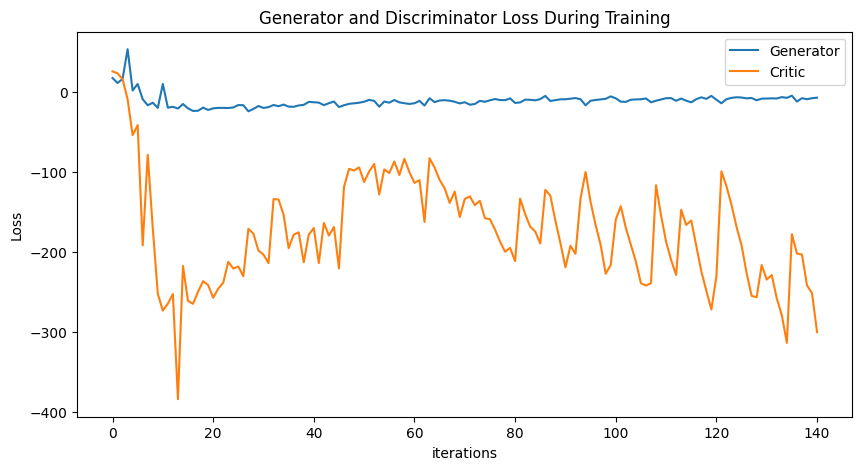

Epoch 150: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

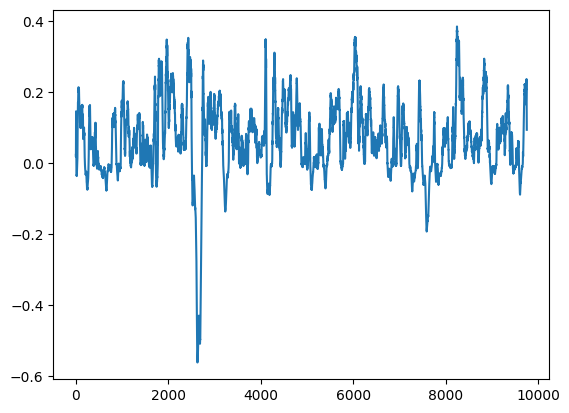

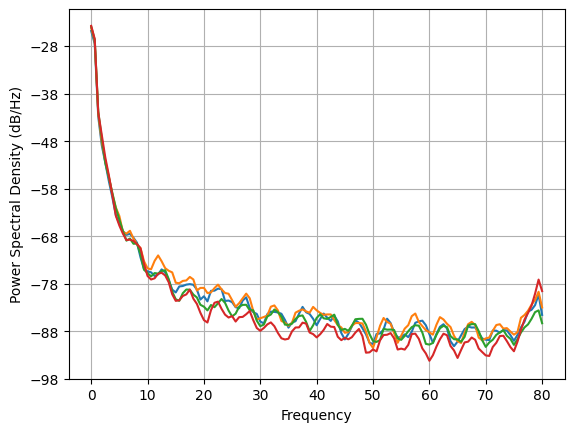

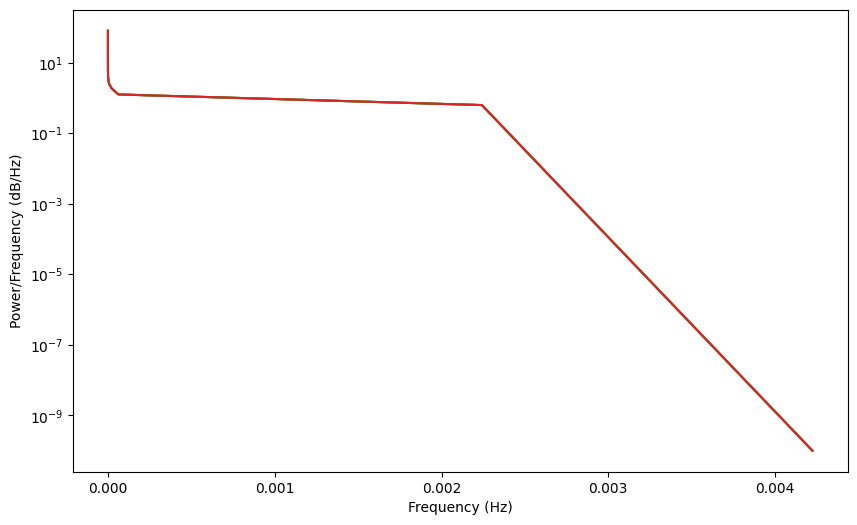

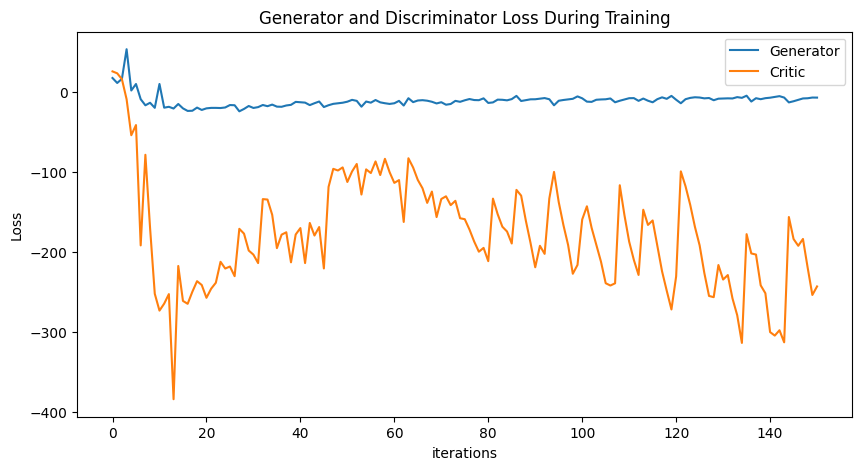

Epoch 160: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

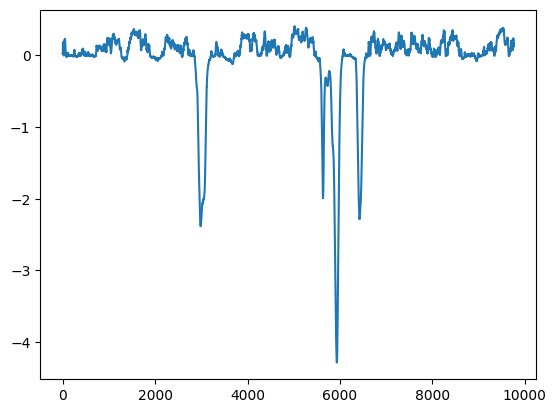

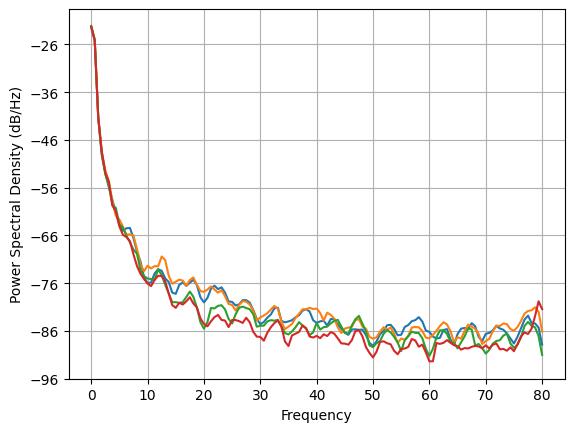

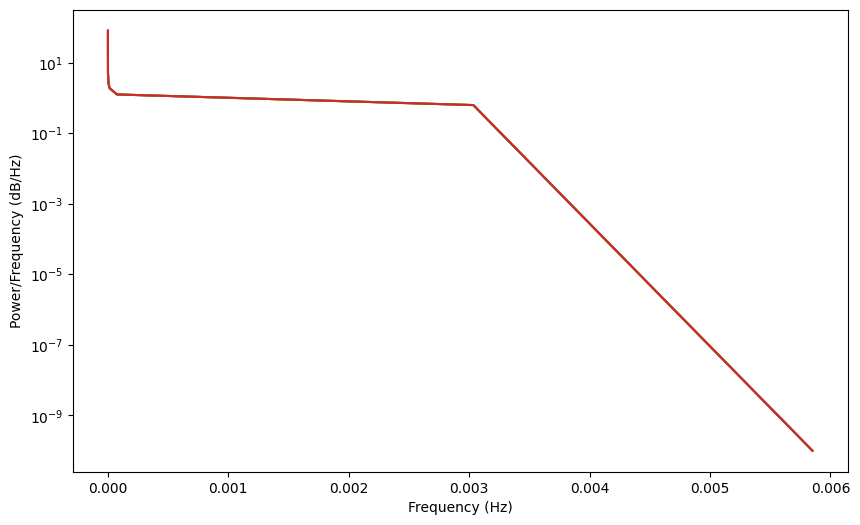

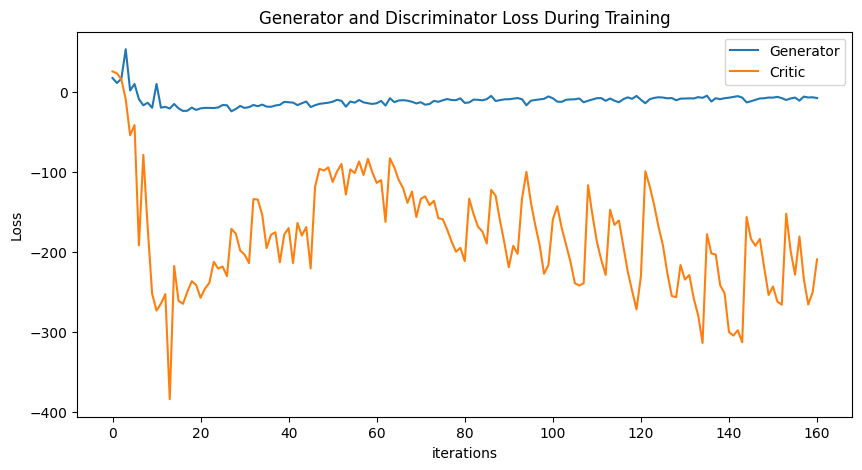

Epoch 170: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

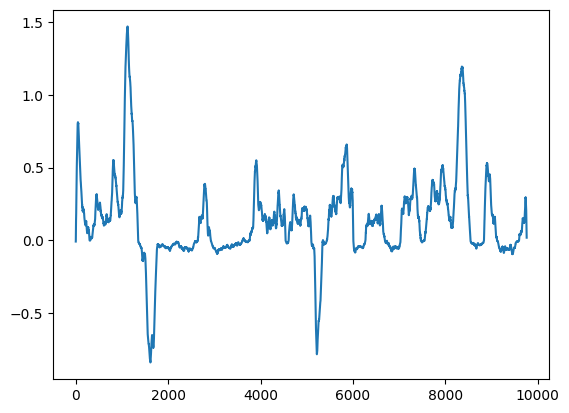

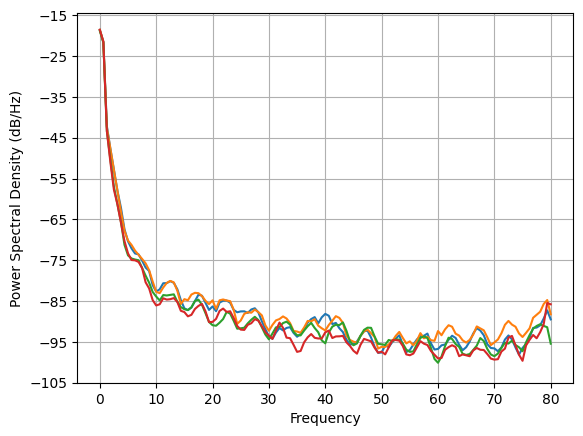

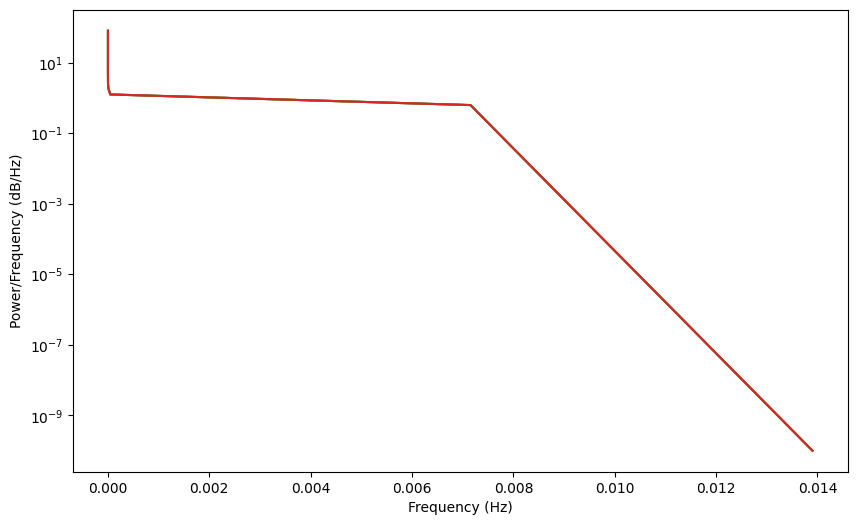

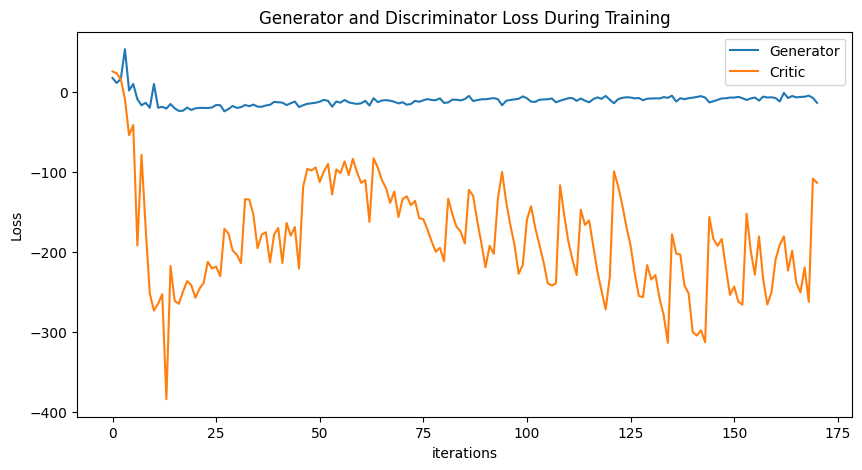

Epoch 180: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

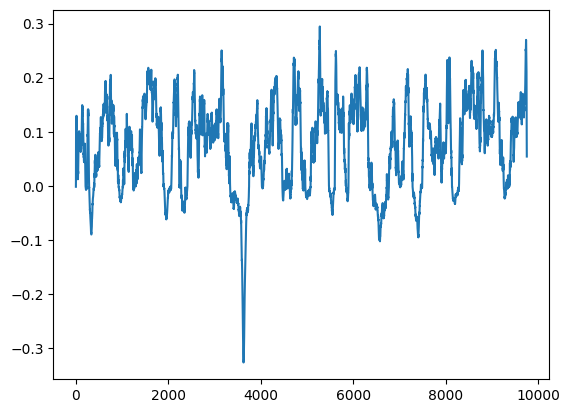

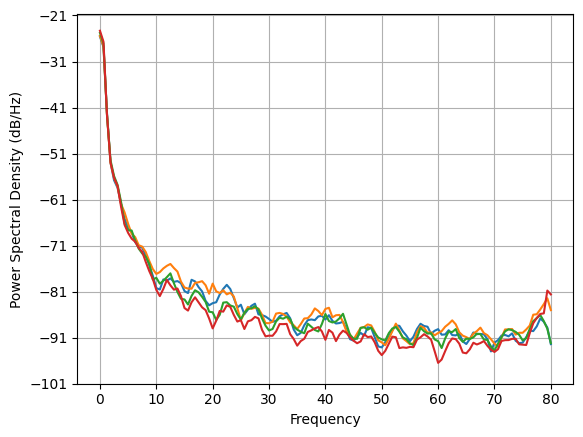

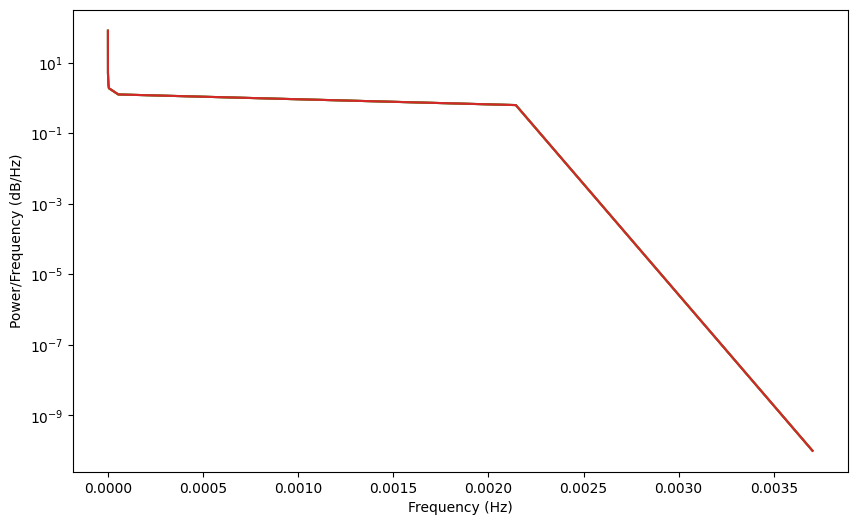

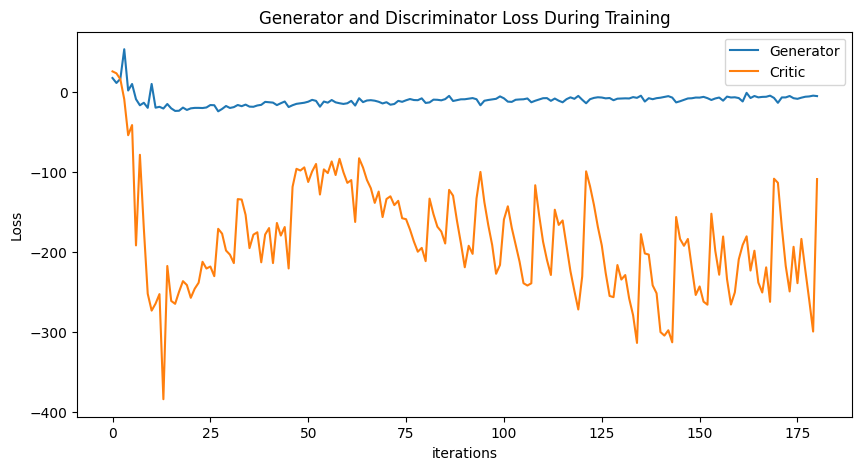

Epoch 190: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

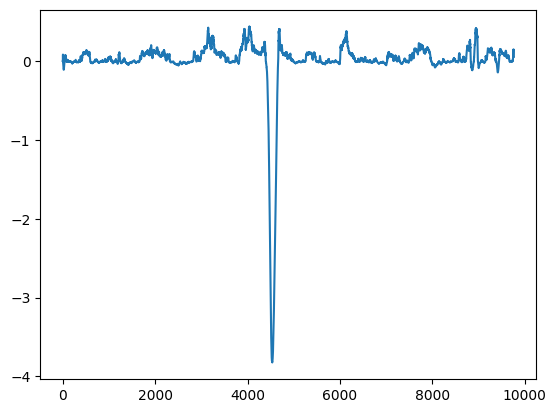

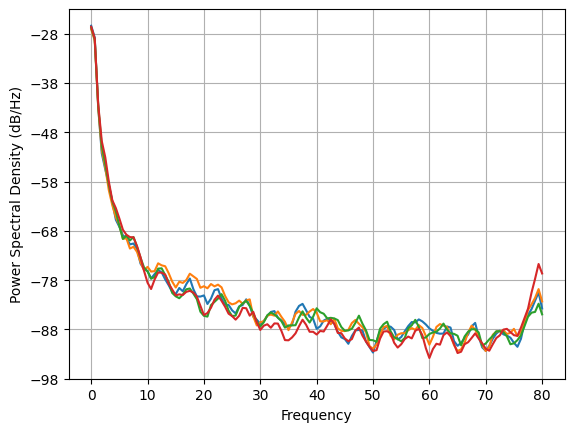

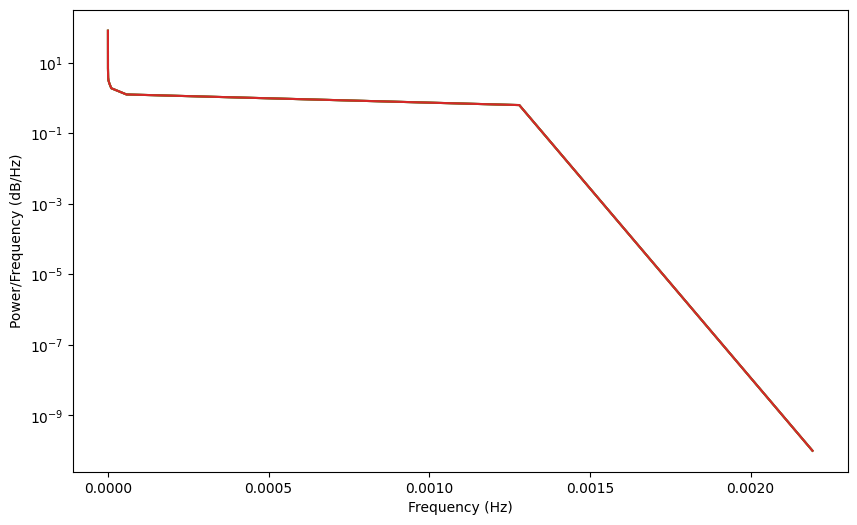

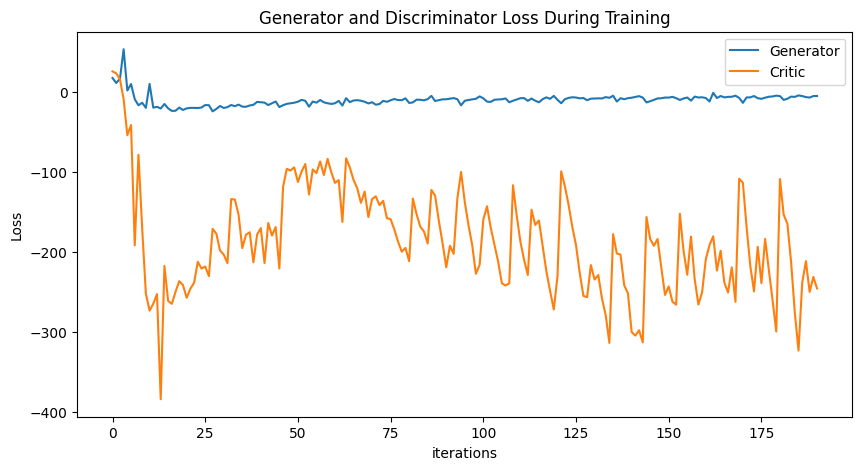

Epoch 200: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

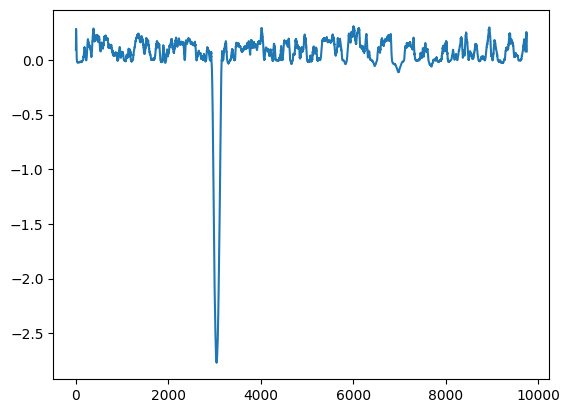

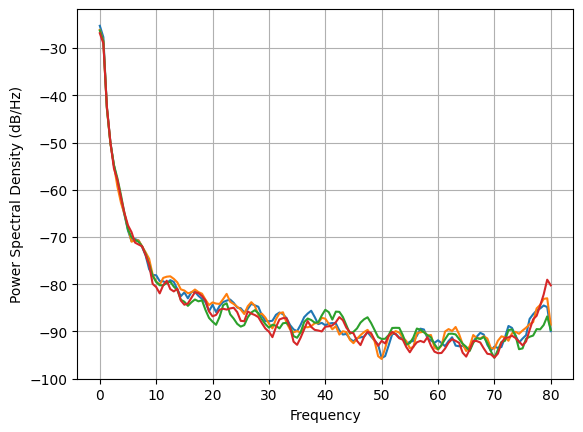

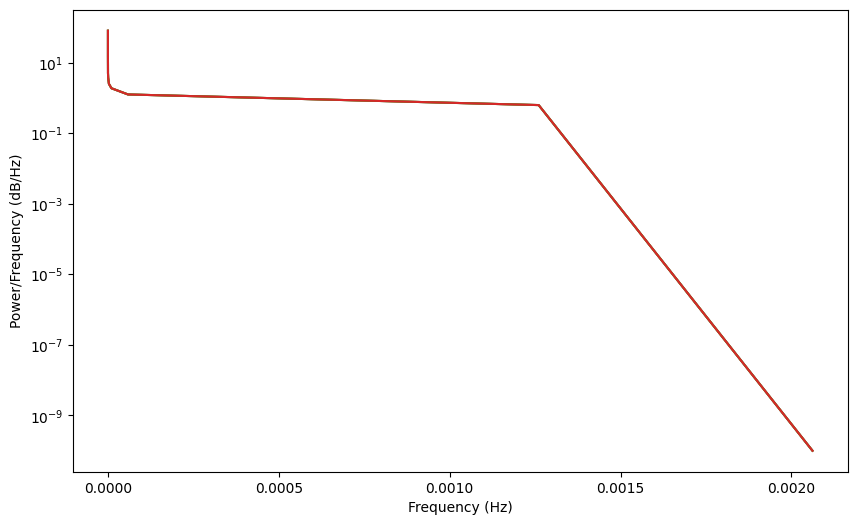

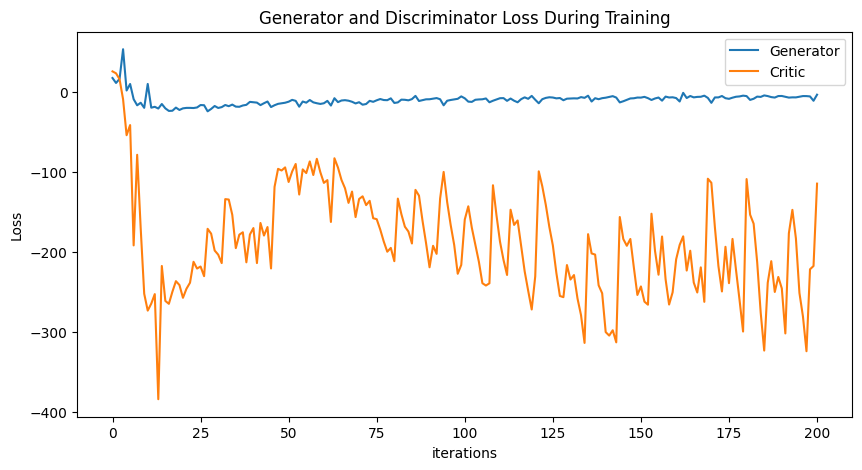

Epoch 210: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

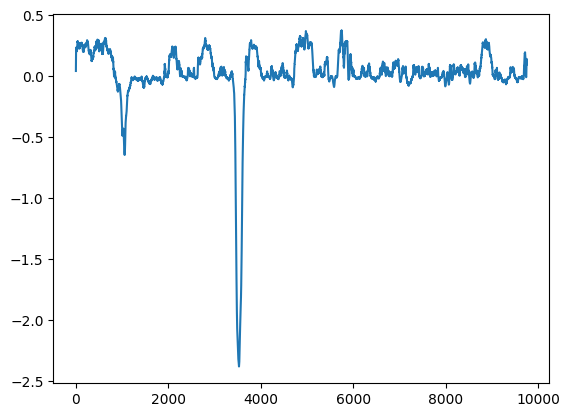

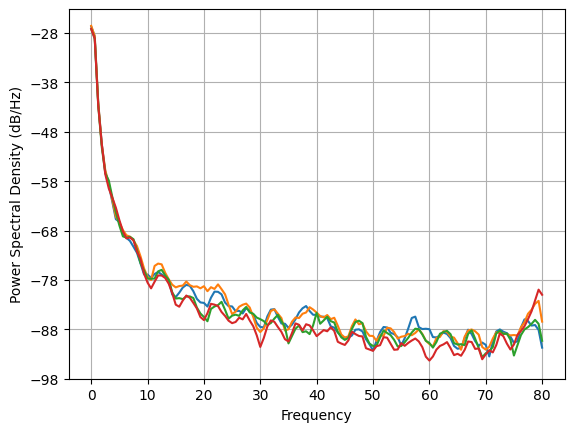

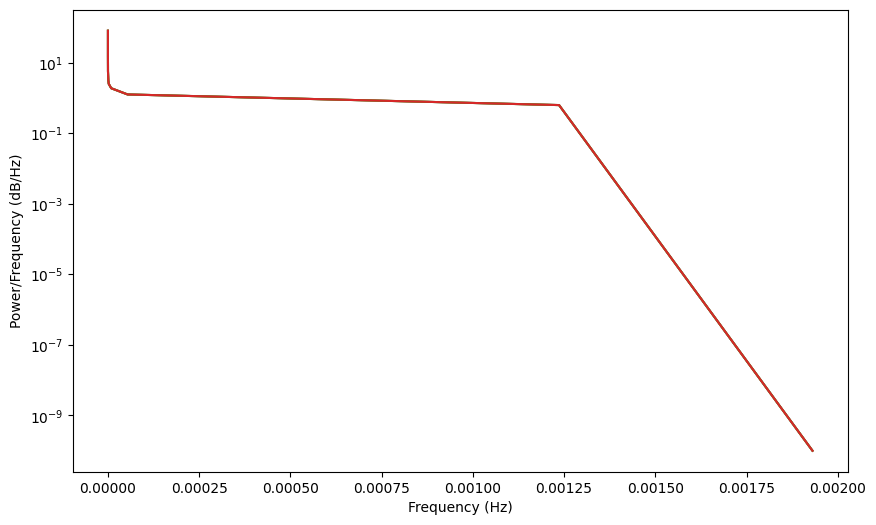

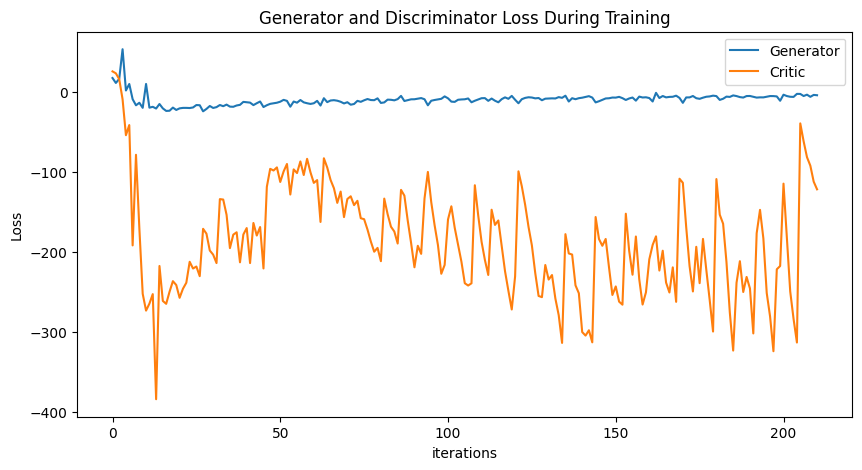

Epoch 220: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

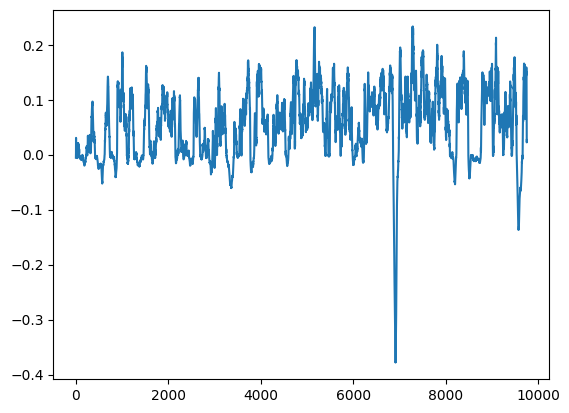

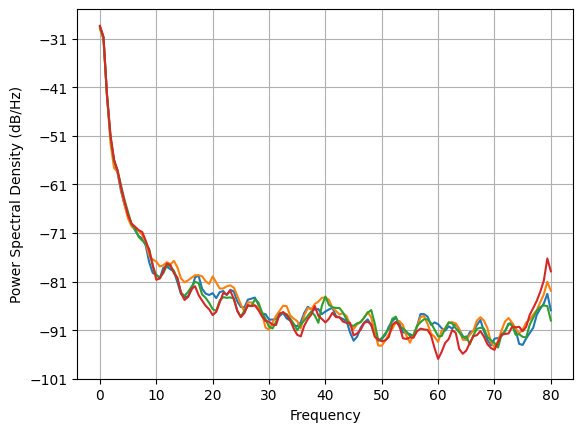

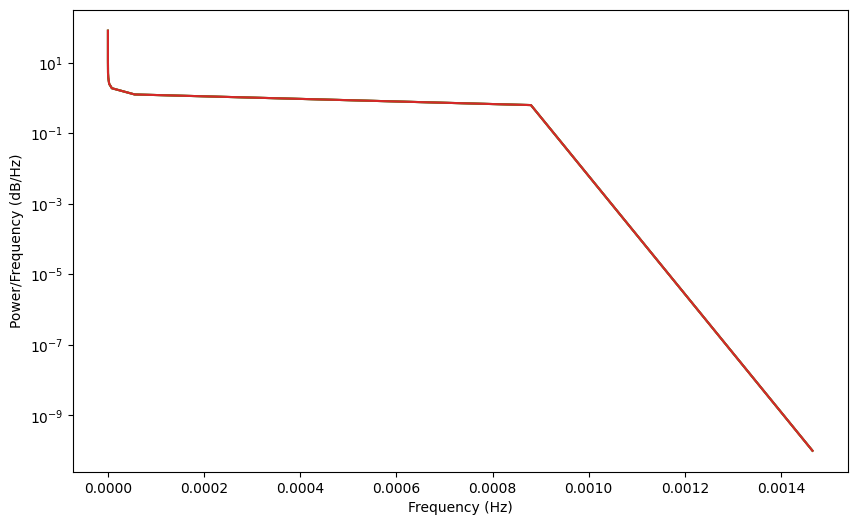

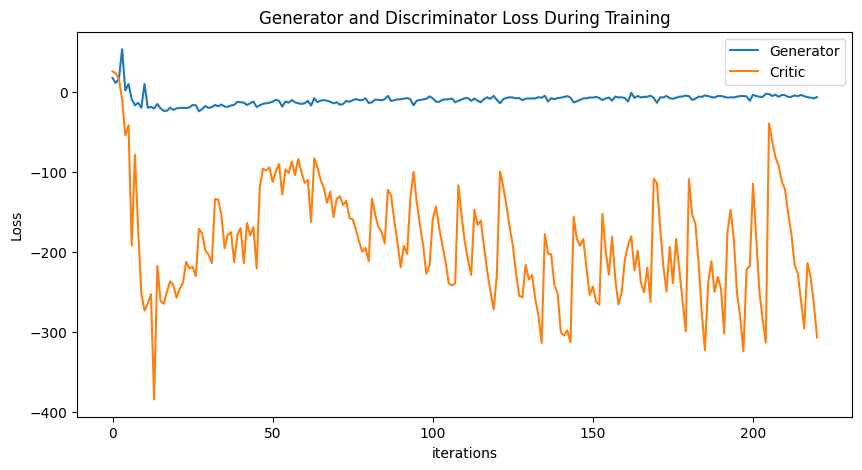

Epoch 230: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

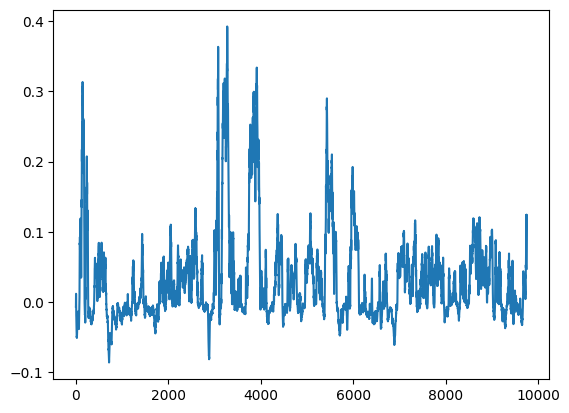

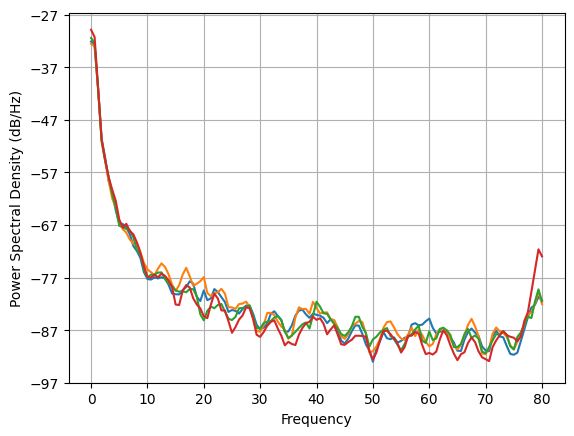

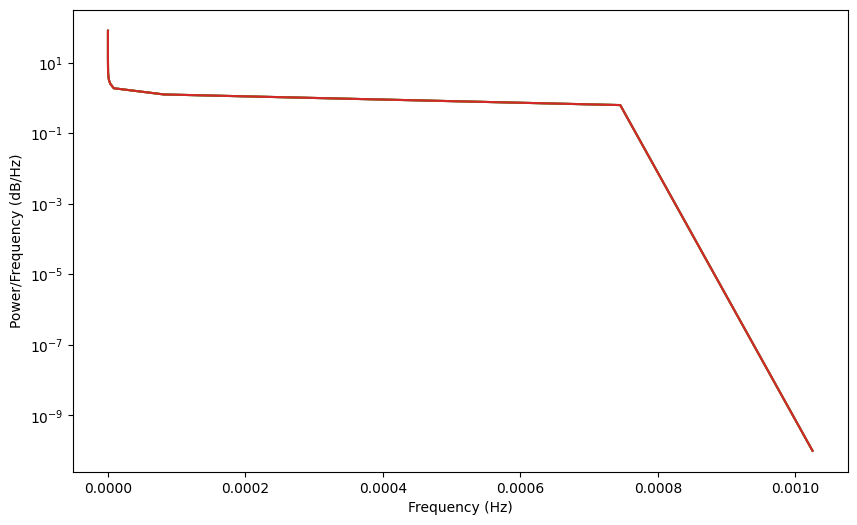

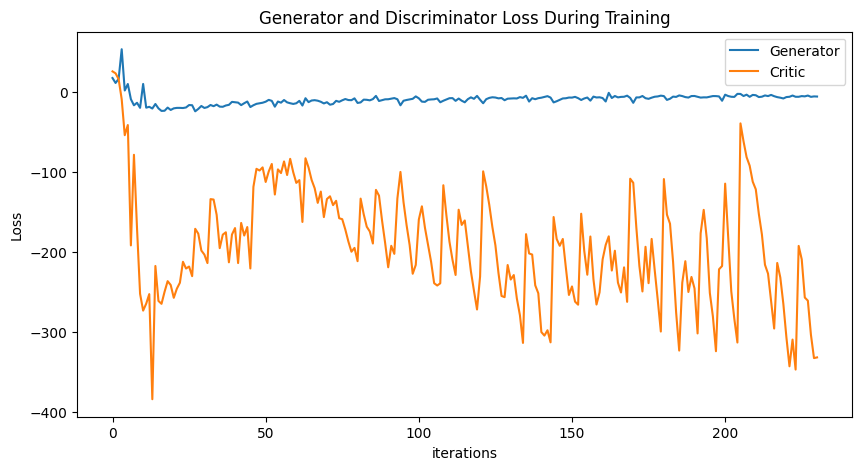

Epoch 240: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

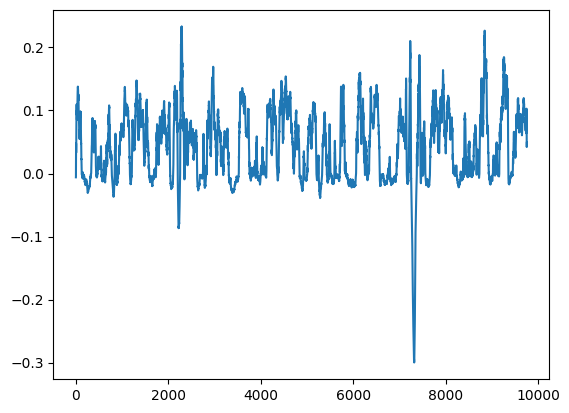

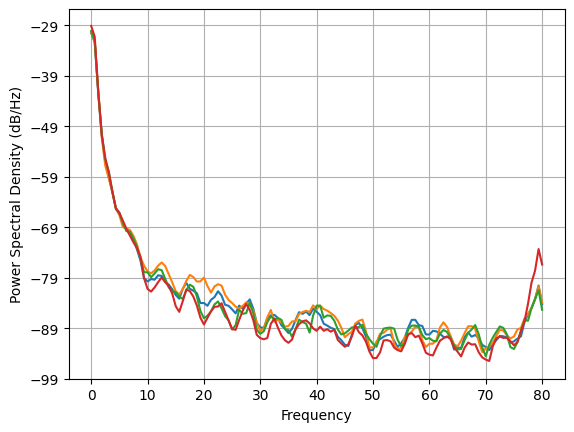

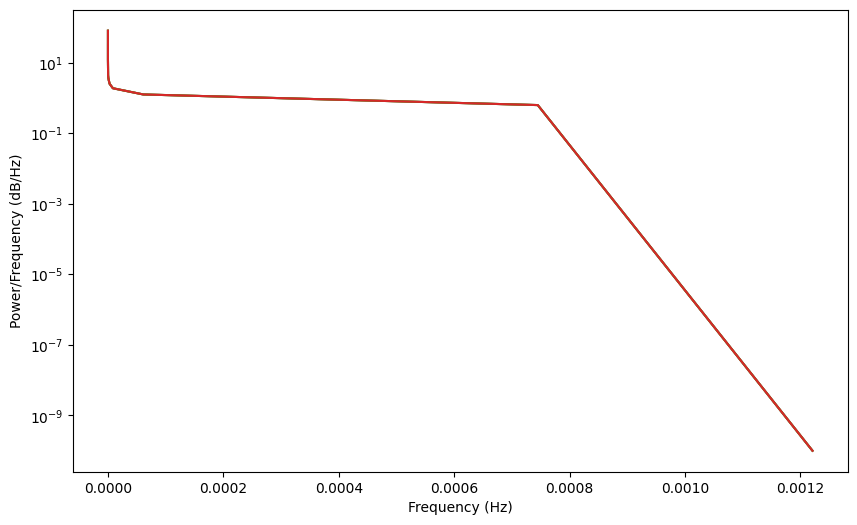

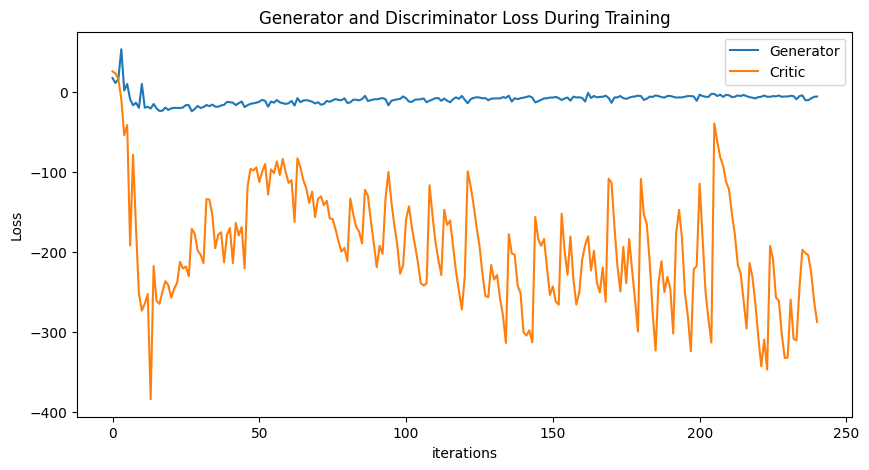

Epoch 250: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

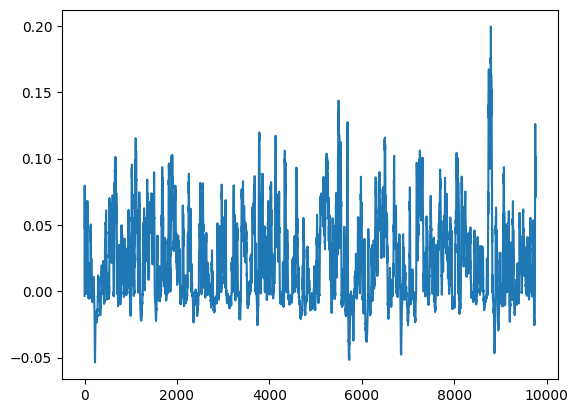

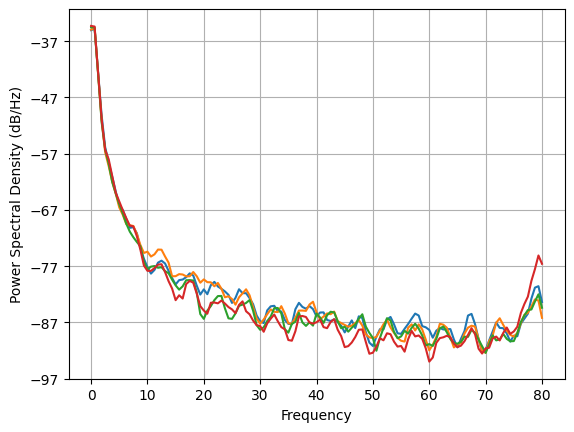

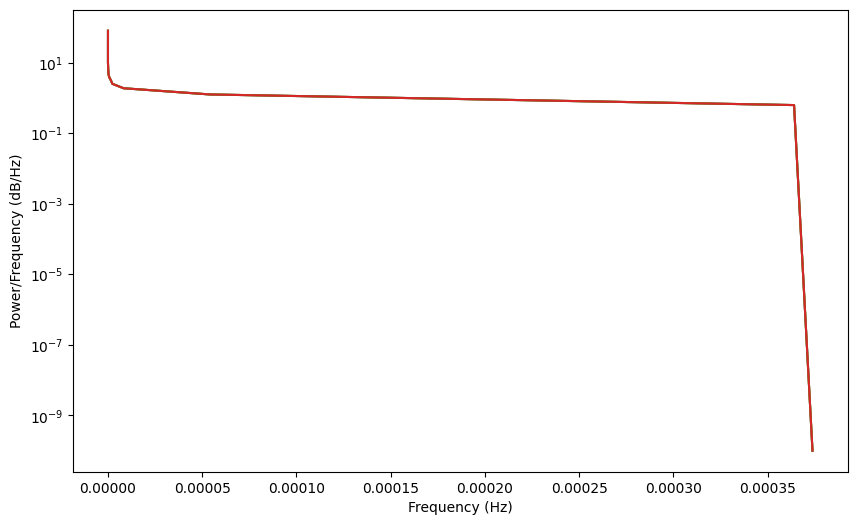

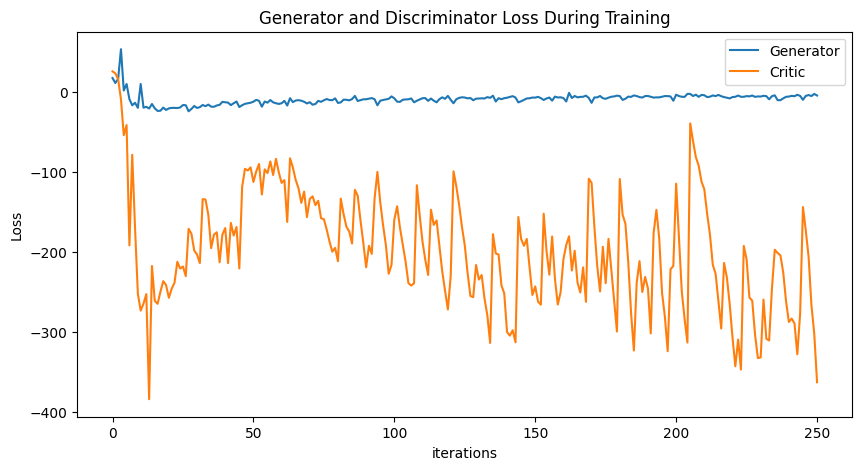

Epoch 260: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

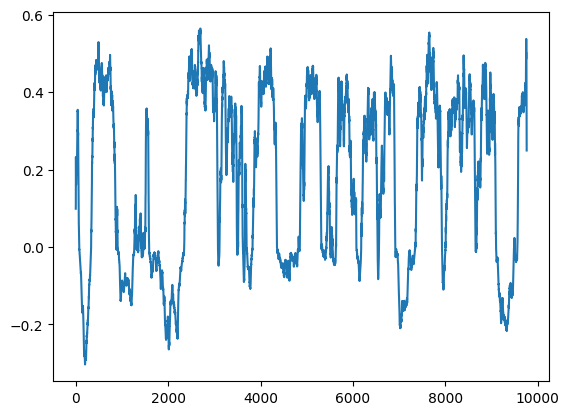

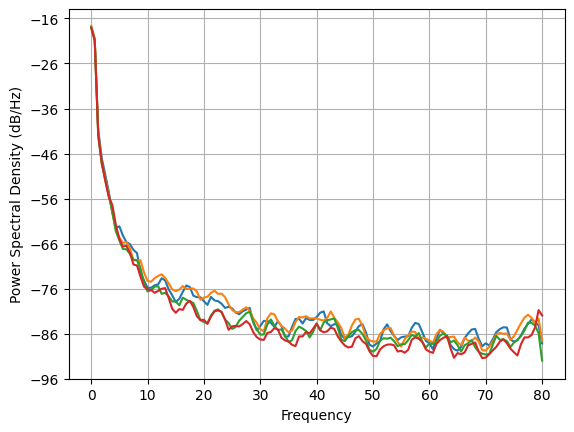

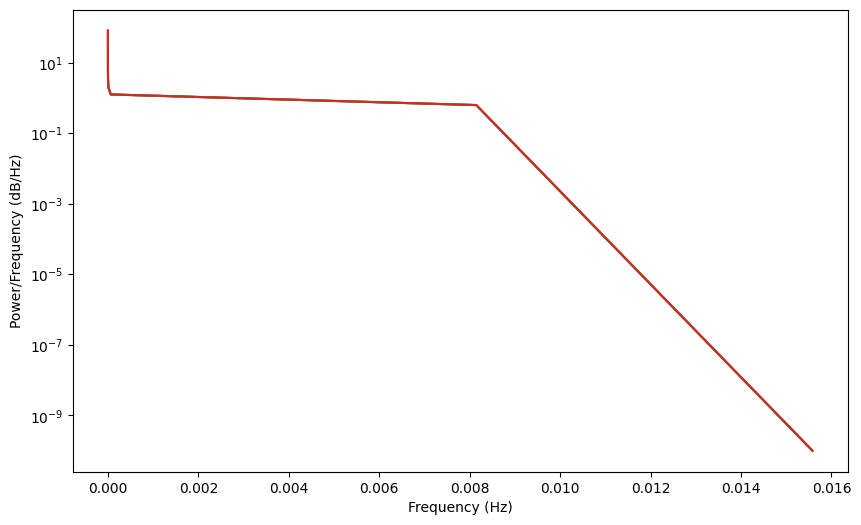

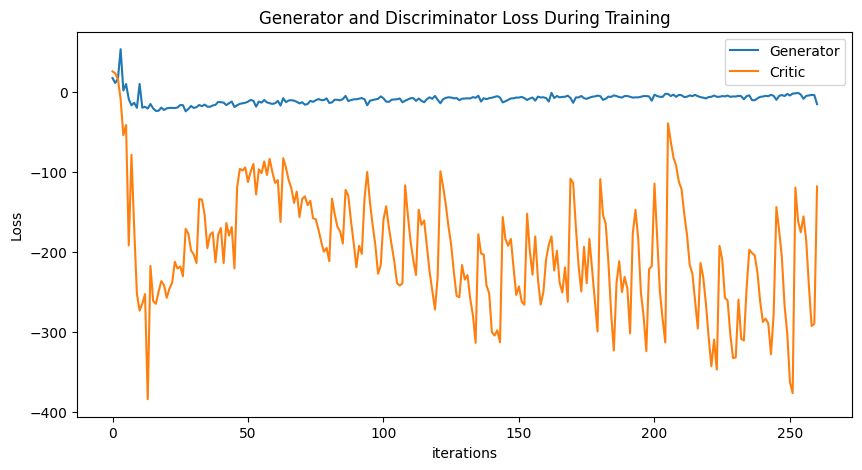

Epoch 270: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

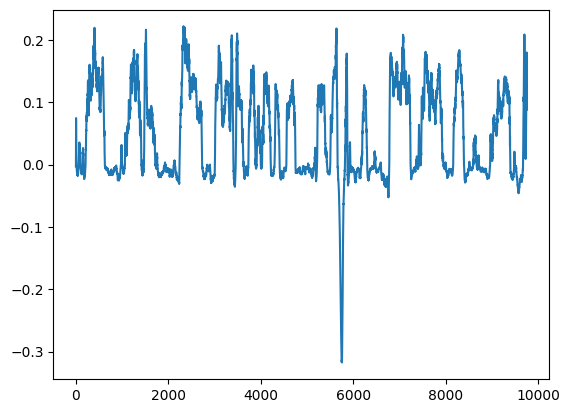

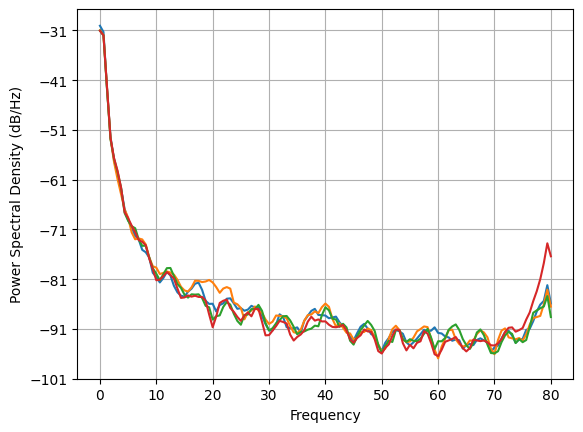

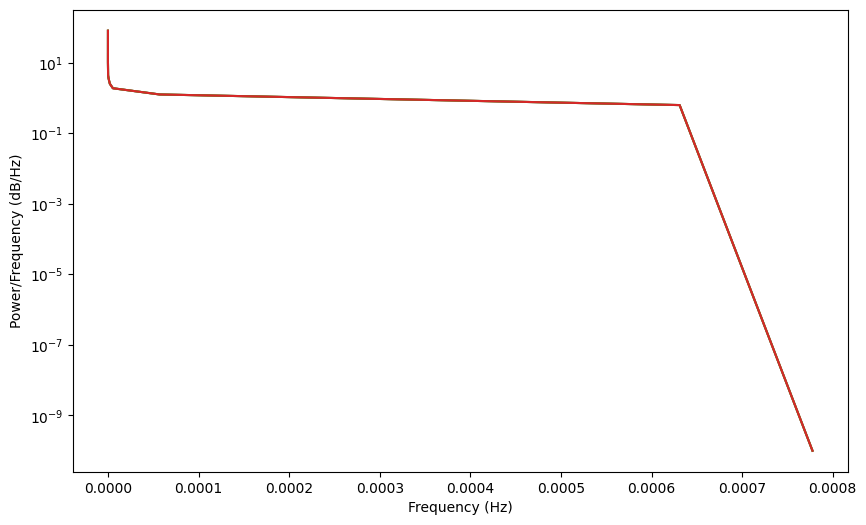

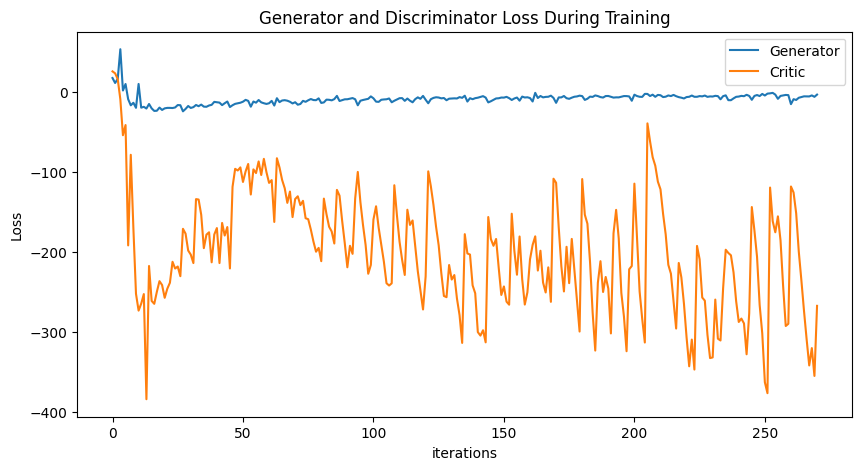

Epoch 280: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

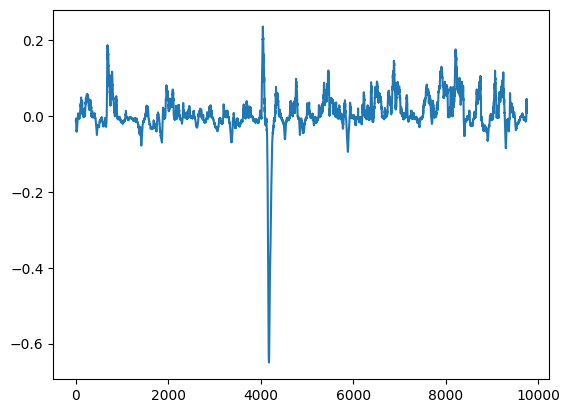

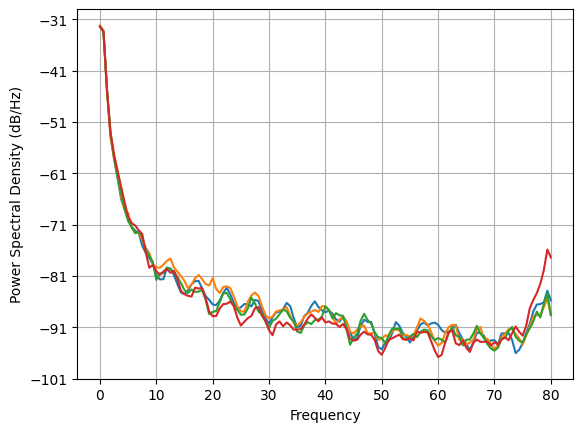

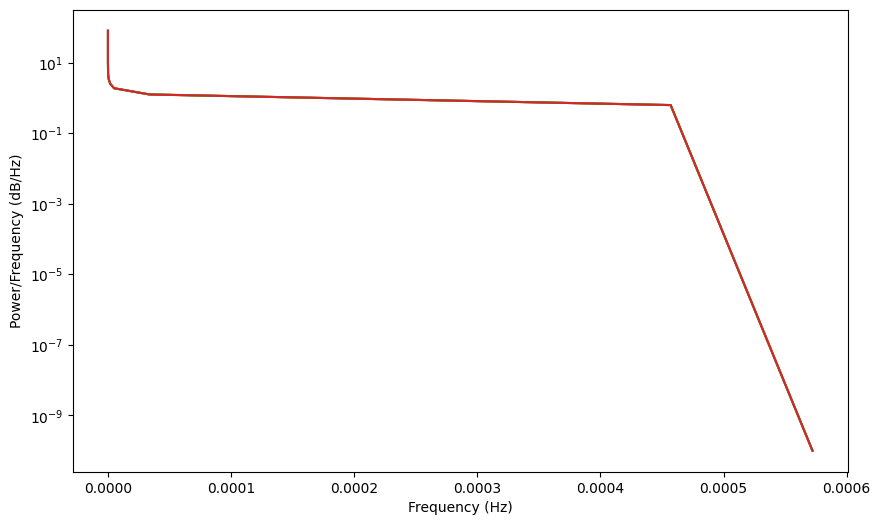

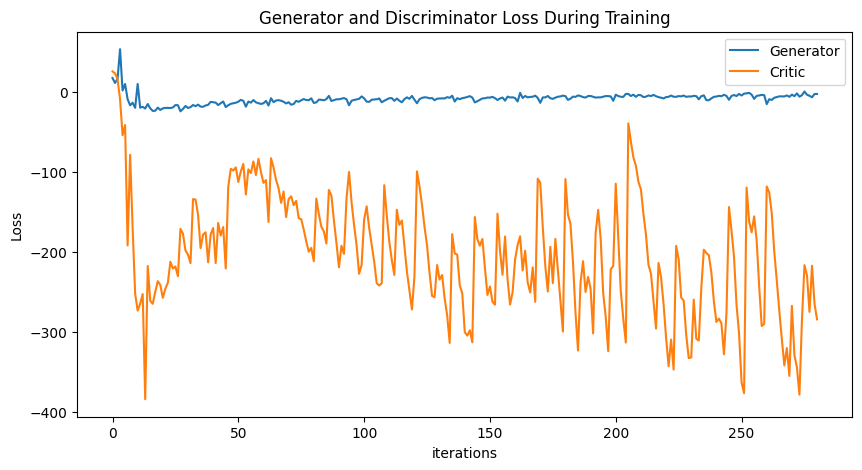

Epoch 290: Critic error ([17.24636473329793, 11.04117302008784, 16.114228561915848, 53.21745012889843, 1.6480934911199725, 9.762488821198808, -9.213170492061234, -16.84667897551436, -13.67778029701072, -20.016118546190942, 9.809972948575673, -19.820013526029175, -18.73661040988746, -20.885909859586253, -15.225183293980331, -20.692340675585143, -23.881867621791848, -23.658303060309873, -19.722579997972396, -22.662307660609898, -20.668252617316476, -20.09081174728891, -20.081425473121577, -20.26184531012306, -19.56479410511739, -16.537772893425174, -16.768467867705905, -24.378254116995556, -21.390631943696643, -17.71810636954661, -20.175935220245208, -19.12666068685048, -16.47288079068175, -17.96518310508757, -15.986823143498453, -18.513941726256924, -18.70729769139291, -17.07582910845888, -16.28061197371877, -12.58028934029311, -13.06393603329155, -13.504675187270713, -16.619357856974514, -14.258283093359765, -12.118725853366872, -19.03239752900119, -16.755477725145727, -15.036261279675

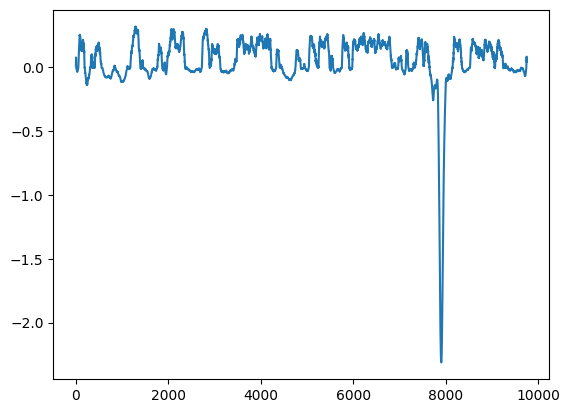

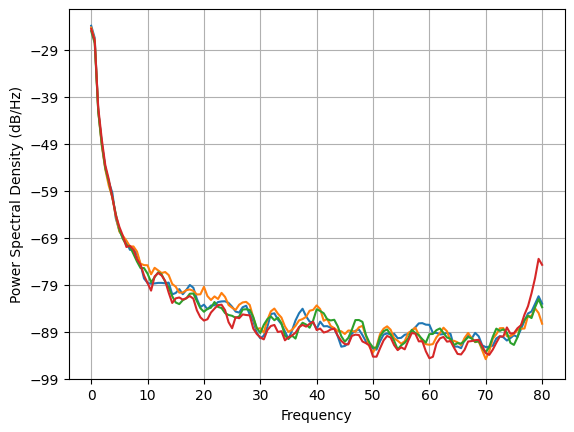

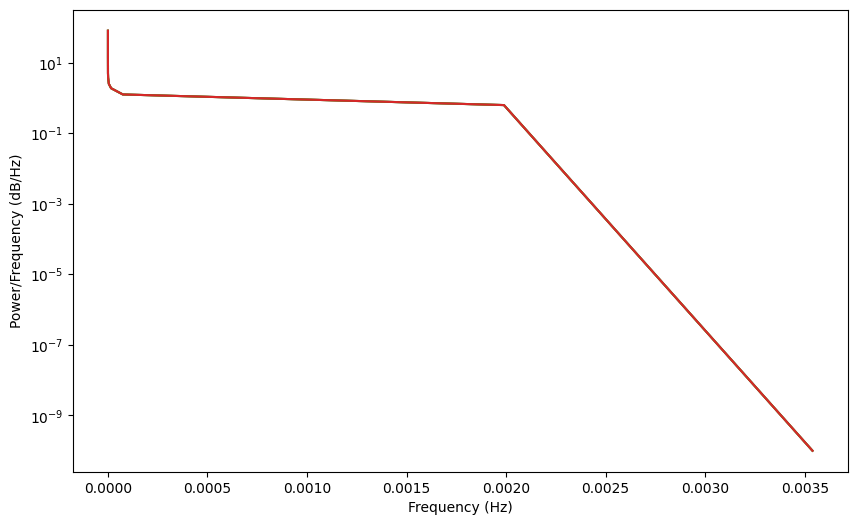

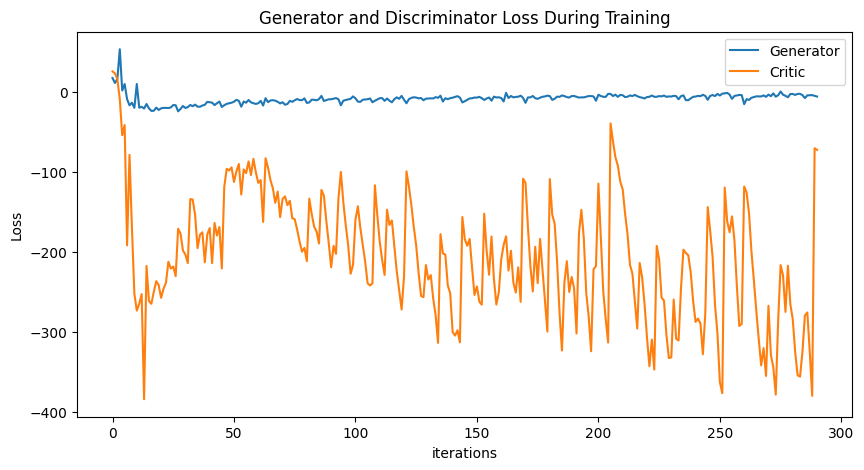

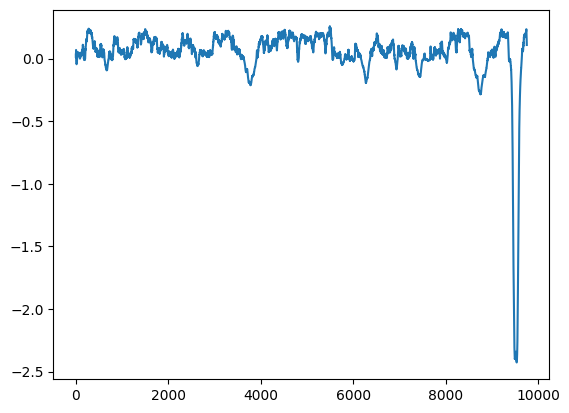

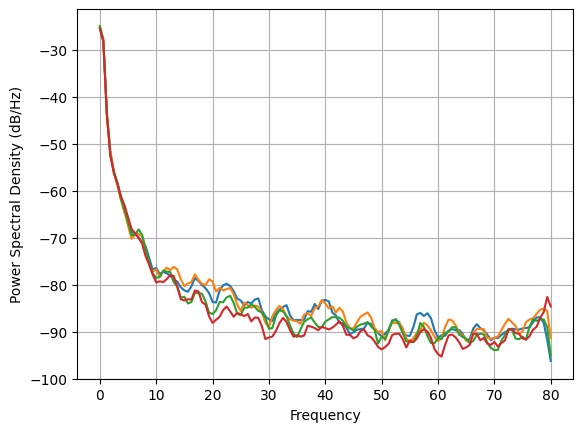

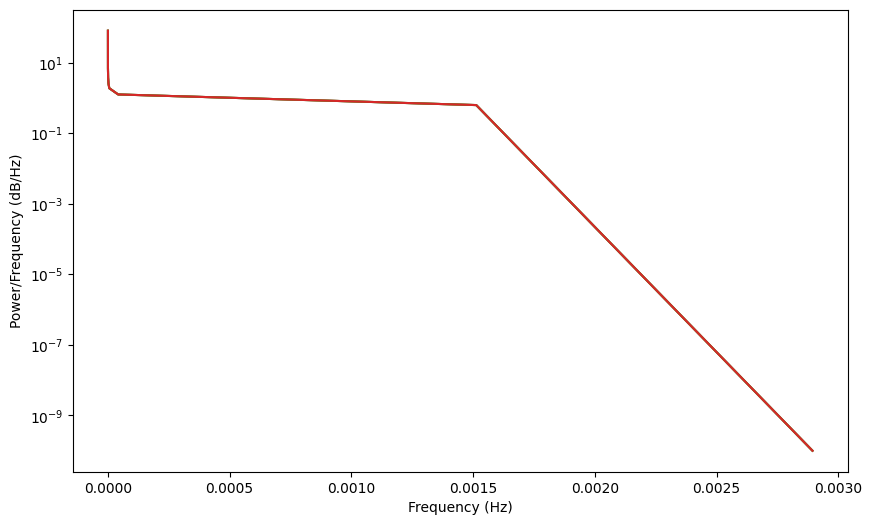

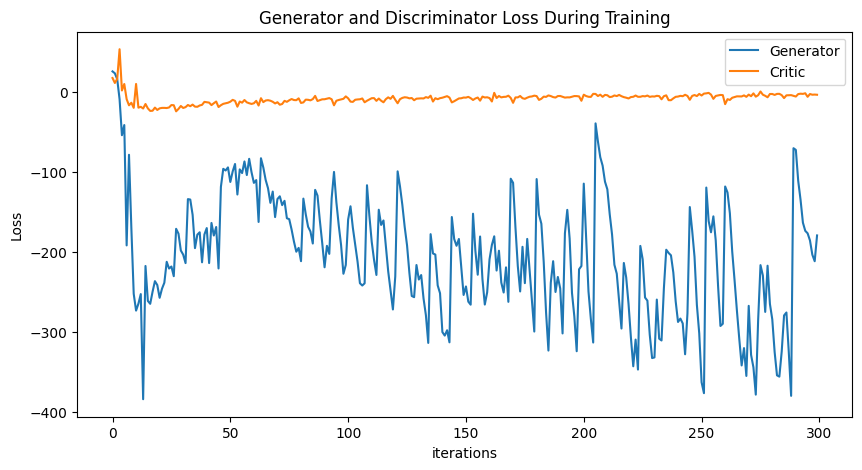

In [29]:
NUM_EPOCHS = 300
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(training_data_closed)[0]
train_loader = DataLoader(TensorDataset(torch.tensor(training_data_closed).detach()), batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, NUM_CHANNELS, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(NUM_CHANNELS, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(NUM_CHANNELS, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, NUM_CHANNELS, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def spectral_loss(real_data, fake_data):
    fft_real = torch.fft.fft(real_data)
    fft_fake = torch.fft.fft(fake_data)
    magnitude_real = torch.sqrt(fft_real.real**2 + fft_real.imag**2)
    magnitude_fake = torch.sqrt(fft_fake.real**2 + fft_fake.imag**2)
    return F.mse_loss(magnitude_real, magnitude_fake)

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            (real, ) = next(iter(train_loader))
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)
            noise = sample_normal_distribution(BATCH_SIZE, 200, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty(D, real, fake) * LAMBDA_GP
            D.zero_grad()
            # normal WGAN-GP loss
            loss_critic = loss_critic_real + loss_critic_fake + gp + (spectral_loss(real.data, fake.data) * 0.005)
            loss_critic.backward()
            critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 200, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake) + (spectral_loss(real.data, fake.data) * 0.005)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_data_closed, disc, gen = train()

torch.save(gen, '0generator-spectral.pt')
torch.save(disc, '0discriminator-spectral.pt')
np.save('04ch-spectral.npy', generated_data_closed.detach())
plot_everything(generated_data_closed, gen_err, critic_err)
generated_data_closed = None

# spectral loss with log scale

Epoch 0: Critic error ([400.4314341357343]) Generator err ([2.9249354497972355])


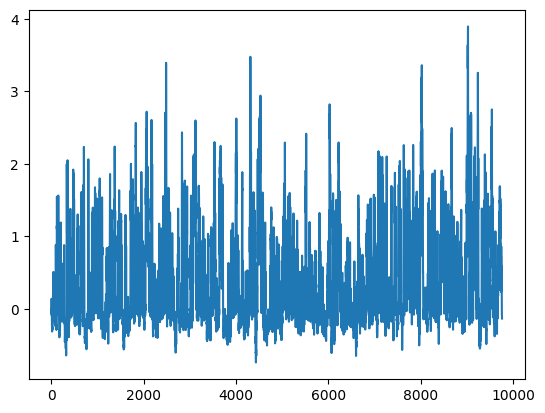

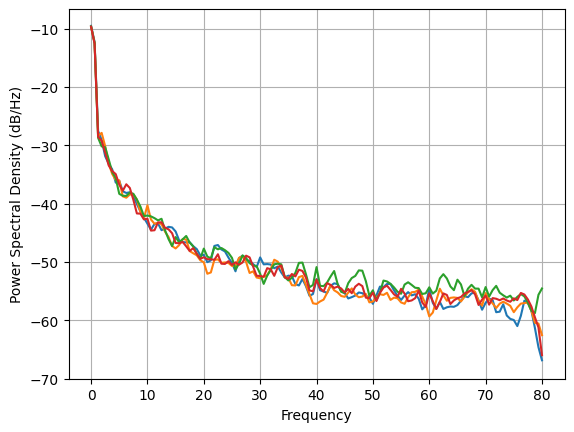

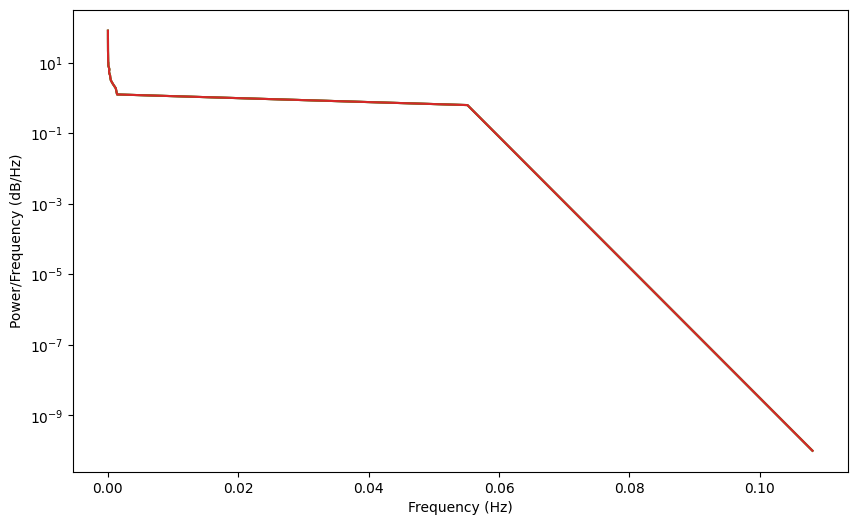

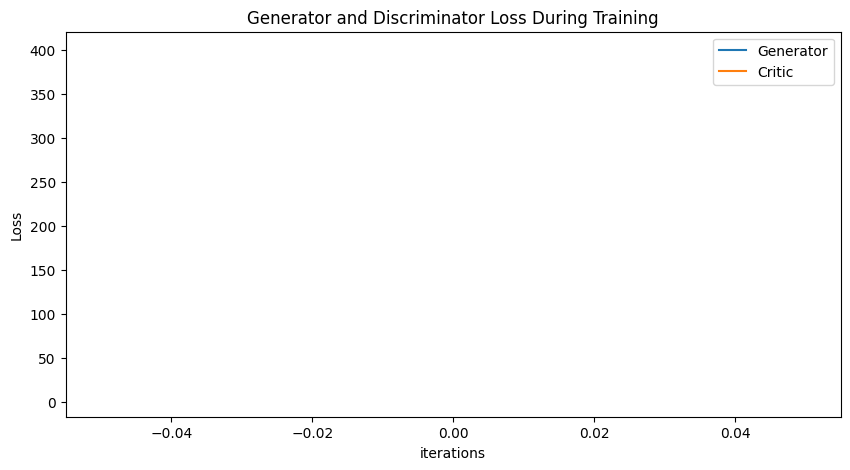

Epoch 10: Critic error ([400.4314341357343, -7.117554992114714, -19.267707554603025, inf, -27.701390392894986, -32.24666453771033, -26.288025863406617, -35.61215726466921, -28.075529503637423, -27.07670981102557, -27.538751208872004]) Generator err ([2.9249354497972355, 14.39391074601562, 33.96908693318293, 63.66521590090918, 47.50645373466727, 84.57587358273459, 51.75369376927732, 64.16887216502839, inf, 47.20192910221135, 48.417752644109534])


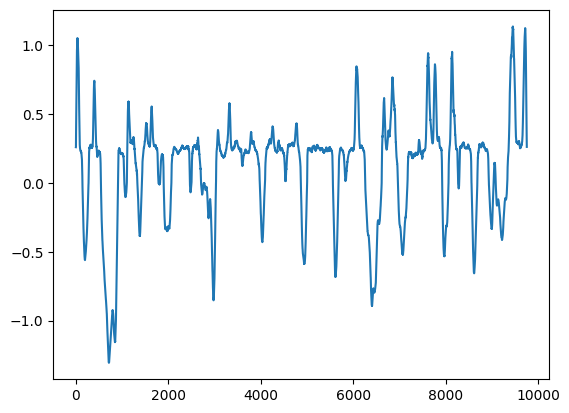

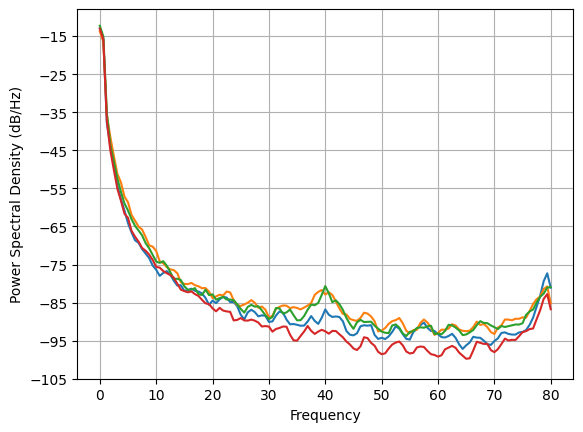

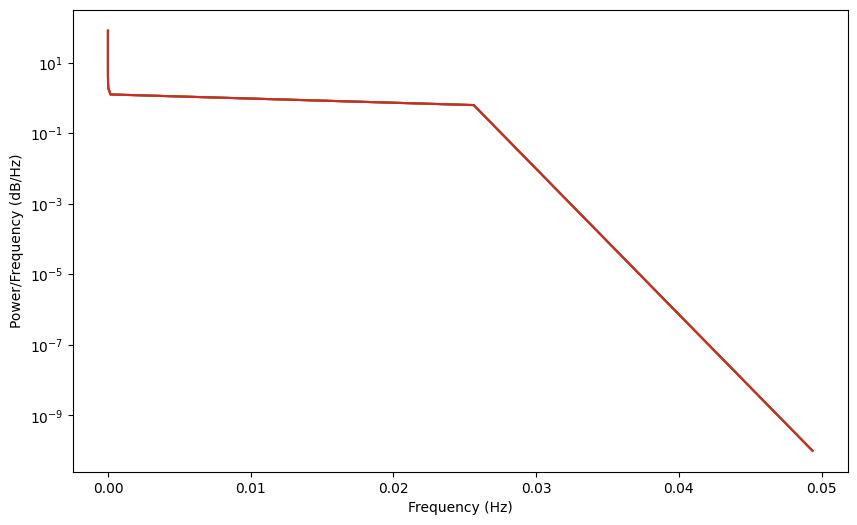

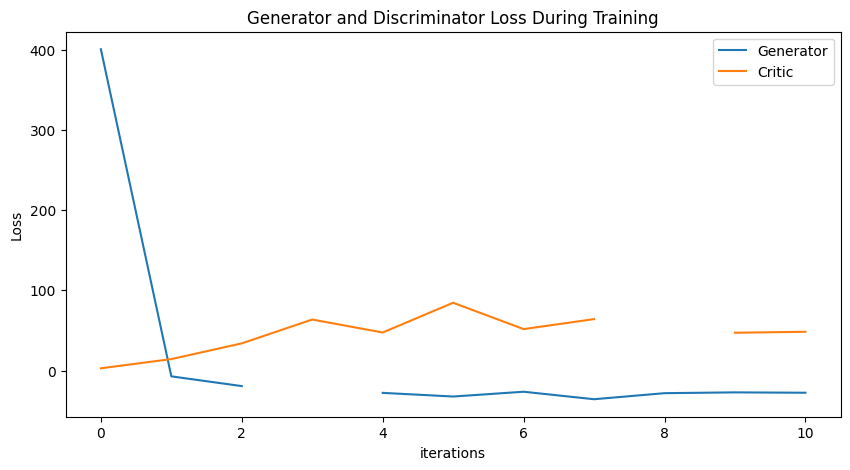

Epoch 20: Critic error ([400.4314341357343, -7.117554992114714, -19.267707554603025, inf, -27.701390392894986, -32.24666453771033, -26.288025863406617, -35.61215726466921, -28.075529503637423, -27.07670981102557, -27.538751208872004, -32.28478003380266, -33.02214595196396, inf, -28.178053715870377, -27.20821259834189, -39.751668530181654, inf, -26.180772332410974, -24.80801999221718, -26.278497386226306]) Generator err ([2.9249354497972355, 14.39391074601562, 33.96908693318293, 63.66521590090918, 47.50645373466727, 84.57587358273459, 51.75369376927732, 64.16887216502839, inf, 47.20192910221135, 48.417752644109534, 61.40692543964082, 51.23578377413862, 47.34987618073264, 47.696809903752026, 50.90616397731654, 64.45836801240439, 56.5299313172038, 46.618576465658336, 43.70600114126086, 45.447390791003066])


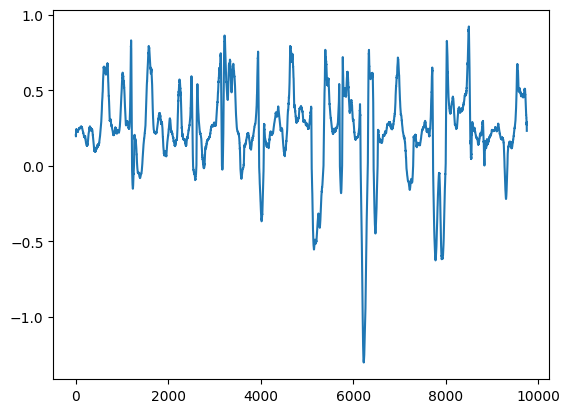

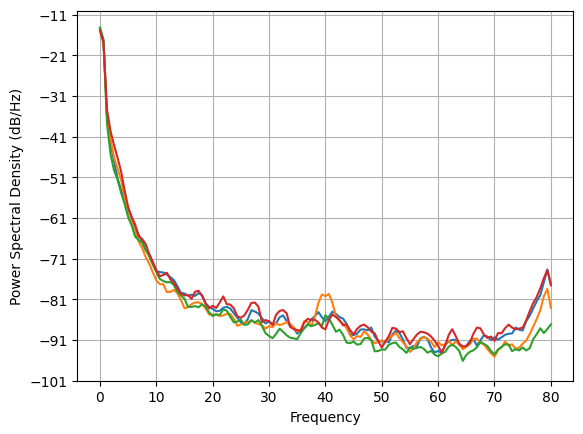

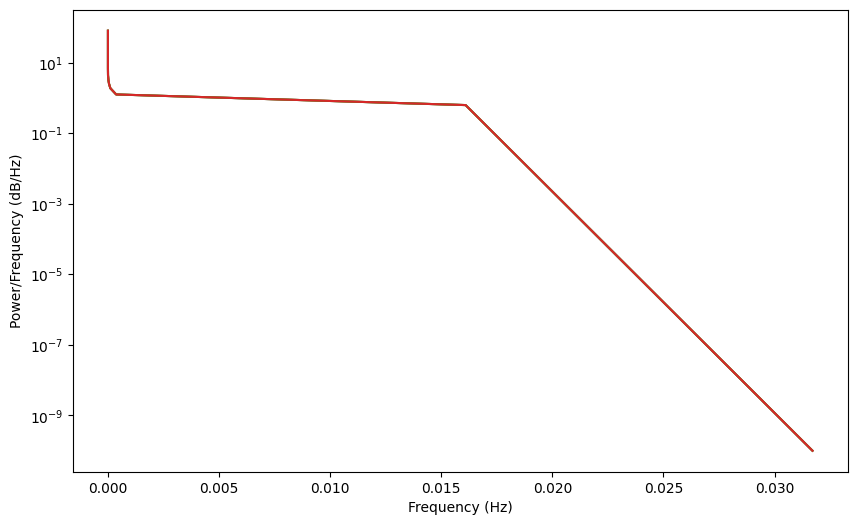

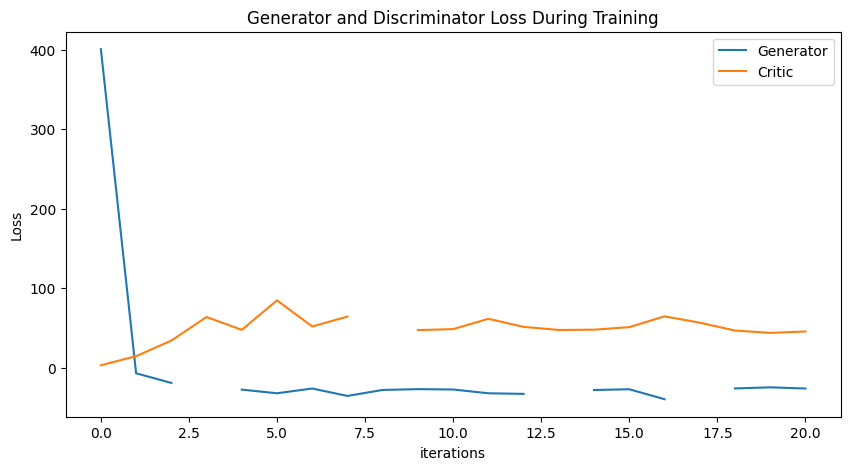

Epoch 30: Critic error ([400.4314341357343, -7.117554992114714, -19.267707554603025, inf, -27.701390392894986, -32.24666453771033, -26.288025863406617, -35.61215726466921, -28.075529503637423, -27.07670981102557, -27.538751208872004, -32.28478003380266, -33.02214595196396, inf, -28.178053715870377, -27.20821259834189, -39.751668530181654, inf, -26.180772332410974, -24.80801999221718, -26.278497386226306, -26.60372304075332, -24.7021268952015, -23.456622417805622, -32.81206274175466, -23.714859435164605, -23.73226830856376, -25.477298598706867, -22.742300397094322, -21.39332974817774, -24.98723722480397]) Generator err ([2.9249354497972355, 14.39391074601562, 33.96908693318293, 63.66521590090918, 47.50645373466727, 84.57587358273459, 51.75369376927732, 64.16887216502839, inf, 47.20192910221135, 48.417752644109534, 61.40692543964082, 51.23578377413862, 47.34987618073264, 47.696809903752026, 50.90616397731654, 64.45836801240439, 56.5299313172038, 46.618576465658336, 43.70600114126086, 45.

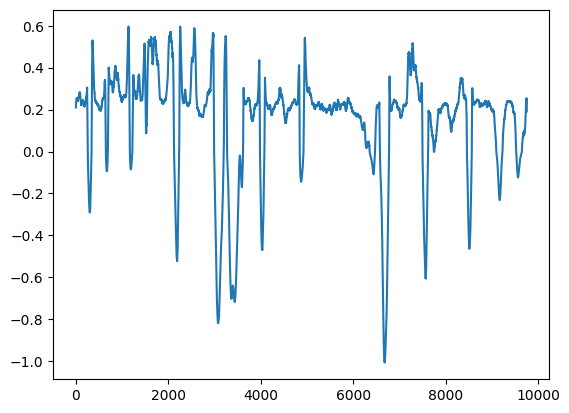

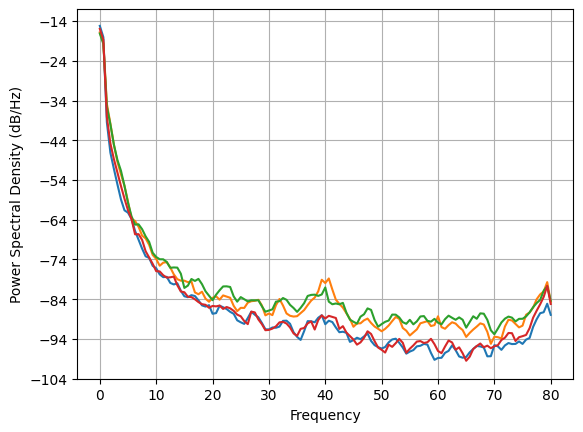

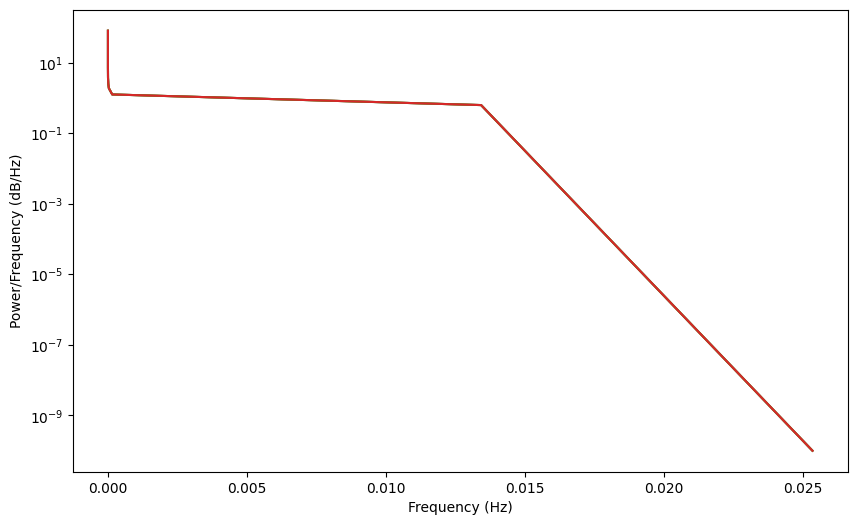

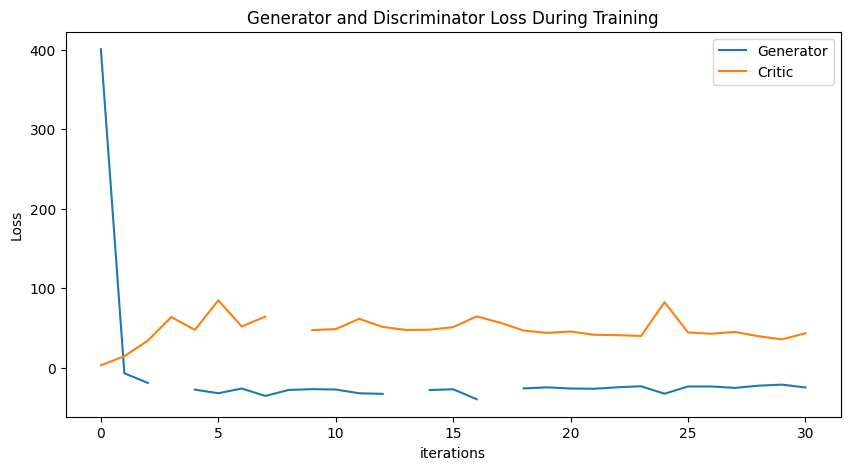

KeyboardInterrupt: 

In [30]:
NUM_EPOCHS = 300
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(training_data_closed)[0]
train_loader = DataLoader(TensorDataset(torch.tensor(training_data_closed).detach()), batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, NUM_CHANNELS, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(NUM_CHANNELS, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(NUM_CHANNELS, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, NUM_CHANNELS, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def spectral_loss(real_data, fake_data):
    fft_real = torch.fft.fft(real_data)
    fft_fake = torch.fft.fft(fake_data)
    magnitude_real = torch.log(torch.sqrt(fft_real.real**2 + fft_real.imag**2))
    magnitude_fake = torch.log(torch.sqrt(fft_fake.real**2 + fft_fake.imag**2))
    return F.mse_loss(magnitude_real, magnitude_fake)

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            (real, ) = next(iter(train_loader))
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)
            noise = sample_normal_distribution(BATCH_SIZE, 200, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty(D, real, fake) * LAMBDA_GP
            D.zero_grad()
            # normal WGAN-GP loss
            loss_critic = loss_critic_real + loss_critic_fake + gp + (spectral_loss(real.data, fake.data) * 0.005)
            loss_critic.backward()
            critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 200, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake) + (spectral_loss(real.data, fake.data) * 0.005)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_data_closed, disc, gen = train()

torch.save(gen, '1generator-spectral.pt')
torch.save(disc, '1discriminator-spectral.pt')
np.save('1_4ch-spectral.npy', generated_data_closed.detach())
plot_everything(generated_data_closed, gen_err, critic_err)
generated_data_closed = None

# same as above, different amplicator

In [ ]:
NUM_EPOCHS = 300
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(training_data_closed)[0]
train_loader = DataLoader(TensorDataset(torch.tensor(training_data_closed).detach()), batch_size=BATCH_SIZE, shuffle=True)

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, NUM_CHANNELS, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(NUM_CHANNELS, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(NUM_CHANNELS, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, NUM_CHANNELS, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def spectral_loss(real_data, fake_data):
    fft_real = torch.fft.fft(real_data)
    fft_fake = torch.fft.fft(fake_data)
    magnitude_real = torch.sqrt(fft_real.real**2 + fft_real.imag**2)
    magnitude_fake = torch.sqrt(fft_fake.real**2 + fft_fake.imag**2)
    return F.mse_loss(magnitude_real, magnitude_fake)

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            (real, ) = next(iter(train_loader))
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)
            noise = sample_normal_distribution(BATCH_SIZE, 200, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty(D, real, fake) * LAMBDA_GP
            D.zero_grad()
            # normal WGAN-GP loss
            loss_critic = loss_critic_real + loss_critic_fake + gp + (spectral_loss(real.data, fake.data) * 0.005)
            loss_critic.backward()
            critic_optimizer.step()  

        noise = sample_normal_distribution(BATCH_SIZE, 200, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake) + (spectral_loss(real.data, fake.data) * 0.01)
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_data_closed, disc, gen = train()

torch.save(gen, '2generator-spectral.pt')
torch.save(disc, '2discriminator-spectral.pt')
np.save('04ch-spectral2.npy', generated_data_closed.detach())
plot_everything(generated_data_closed, gen_err, critic_err)
generated_data_closed = None

# Selective Frequency Peaking Penalty

tldr; spectral penalty function computes the relative power in the bands centered around 10 and 60. It then subtracts 0.1 from each (forcing these bands to comprise at least 10% of the total power, adjust as per requirement), takes the positive part (clamp(min=0)), and then averages over all data samples

freq penalty:
computes the Fourier transform of the generated data and extracts the magnitudes of the frequencies present. Then the function calculates the relative power of the bands centred around the frequencies 10 and 60 (set by the conditions ten_band and sixty_band). Here, relative power is computed as the ratio of the sum of spectral components within the band to the total power across all frequencies. Subtracting 0.1 from each individual frequency band power (ten_magnitude and sixty_magnitude) makes it so that the model is penalized unless at least 10% of the total power is within this band. This essentially means we want the model to generate signals such that at least 10% of the spectral power of those signals falls within the frequency bands of interest, that are centre around 10 and 60.

The clamp operation enforces a lower limit, so that any negative values after the subtraction become 0. This means that if the power in the band exceeds 10%, there is no penalty, otherwise, the penalty is proportional to the shortfall. Averaging the results over all the data samples provides a single scalar value that we can add to the loss function of our training loop.

Epoch 0: Critic error ([2.5734890658274168]) Generator err ([0.0501750148832798])


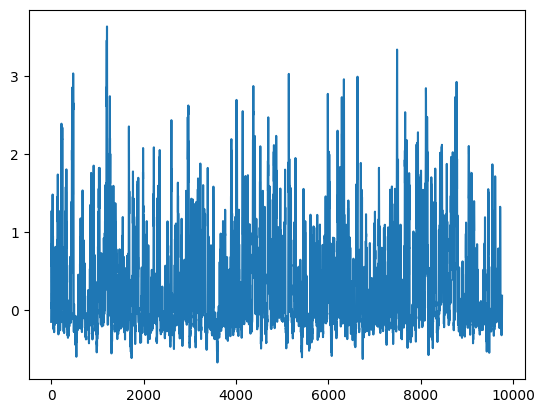

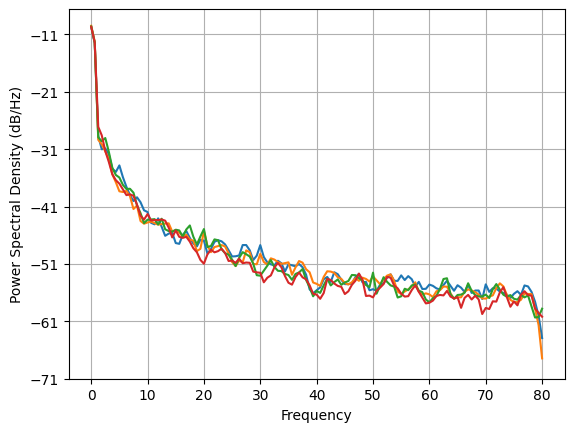

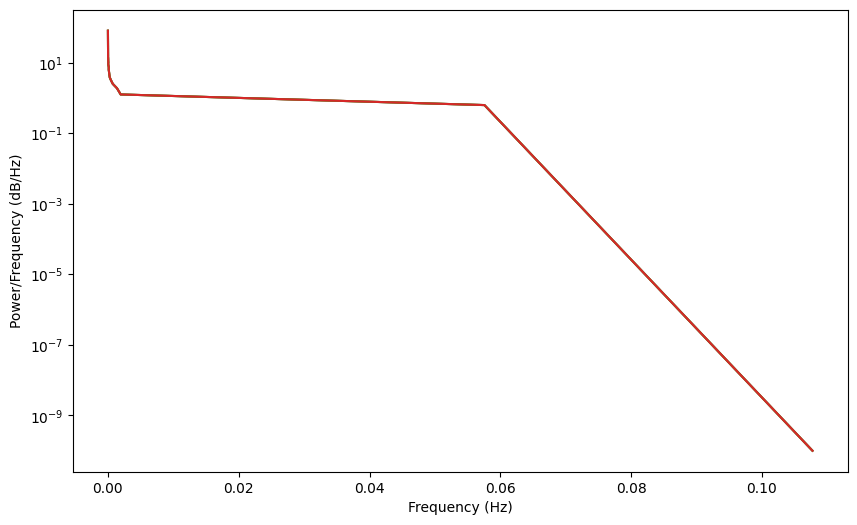

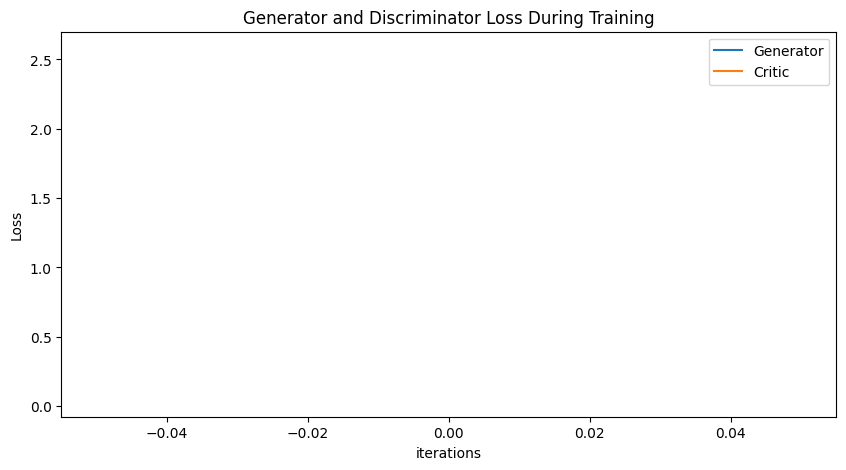

Epoch 10: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926]) Generator err ([0.0501750148832798, 0.6815546751022339, 6.944819450378418, 38.156307220458984, 57.8366813659668, 40.167755126953125, 47.3557243347168, 89.18759155273438, 55.64822006225586, 52.32522964477539, 58.281280517578125])


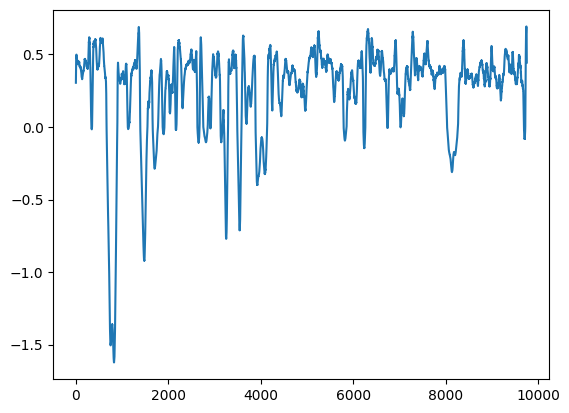

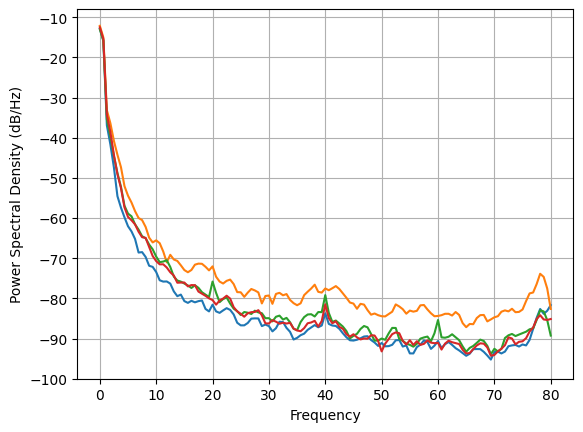

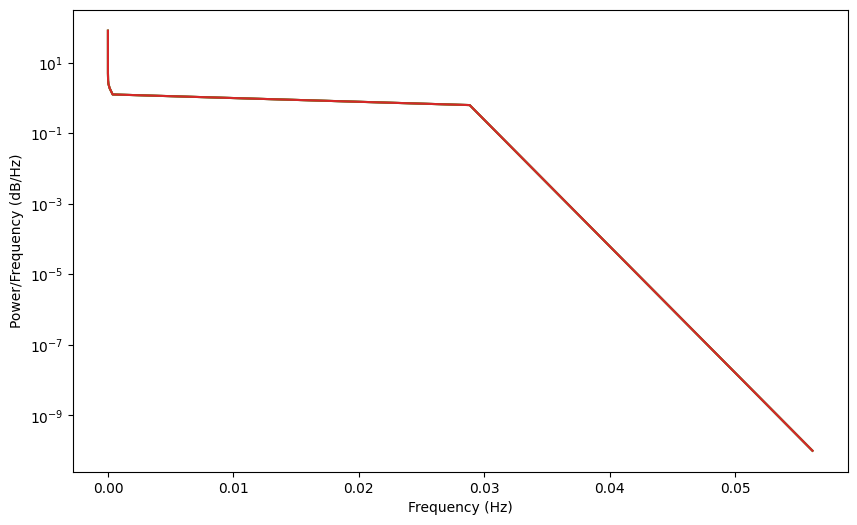

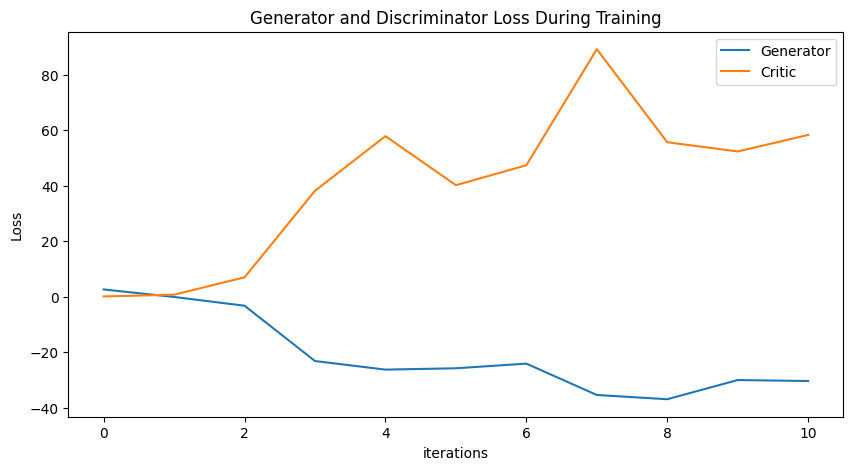

Epoch 20: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488]) Generator err ([0.0501750148832798, 0.6815546751022339, 6.944819450378418, 38.156307220458984, 57.8366813659668, 40.167755126953125, 47.3557243347168, 89.18759155273438, 55.64822006225586, 52.32522964477539, 58.281280517578125, 48.080413818359375, 41.37305450439453, 47.68950271606445, 37.872772216796875, 56.83803176879883, 43.9986686706543, 41.0562858581543, 42.850616455078125, 43.80634689331055, 39.74441146850586])


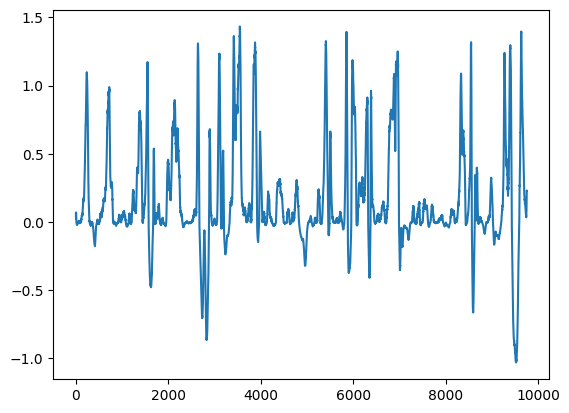

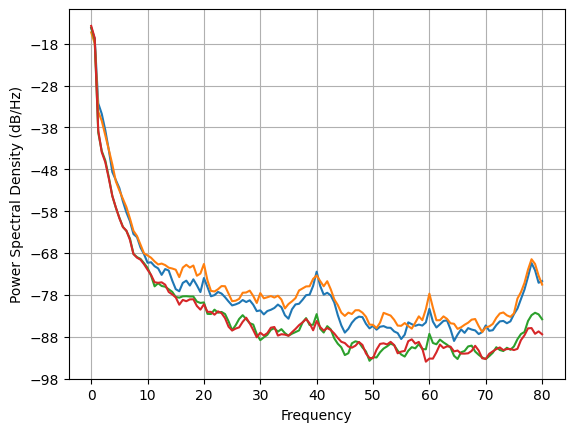

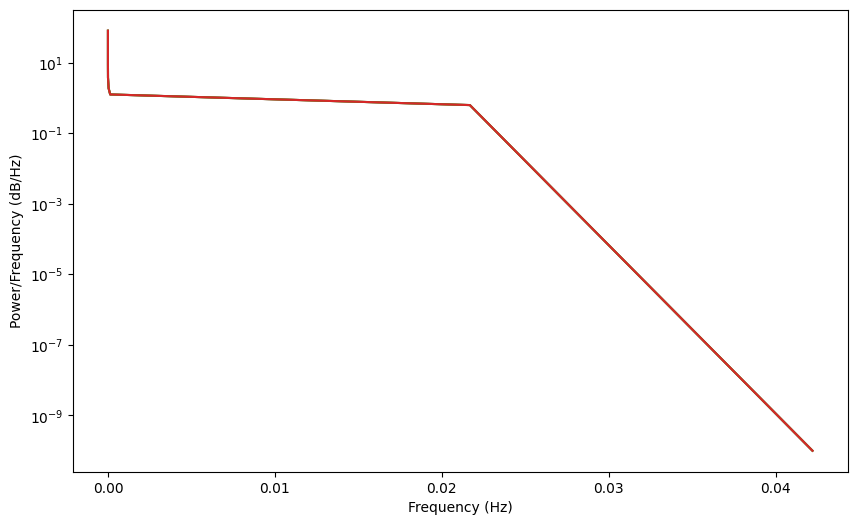

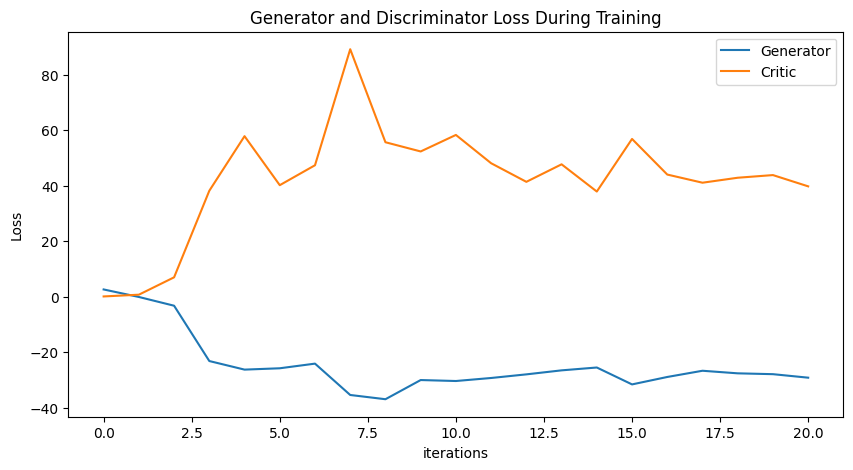

Epoch 30: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682]) Generator err ([0.0501750148832798, 0.6815546751022339, 6.944819450378418, 38.156307220458984, 57.8366813659668, 40.167755126953125, 47.3557243347168, 89.18759155273438, 55.64822006225586, 52.32522964477539, 58.281280517578125, 48.080413818359375, 41.37305450439453, 47.68950271606445, 37.872772216796875, 56.83803176879883, 43.9986686

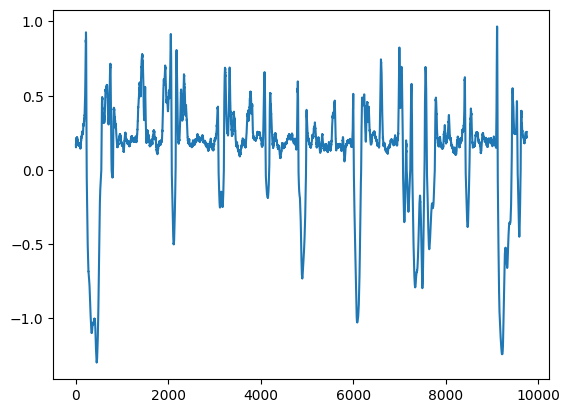

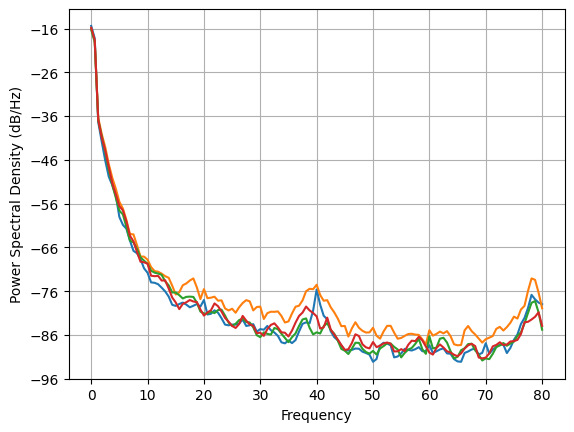

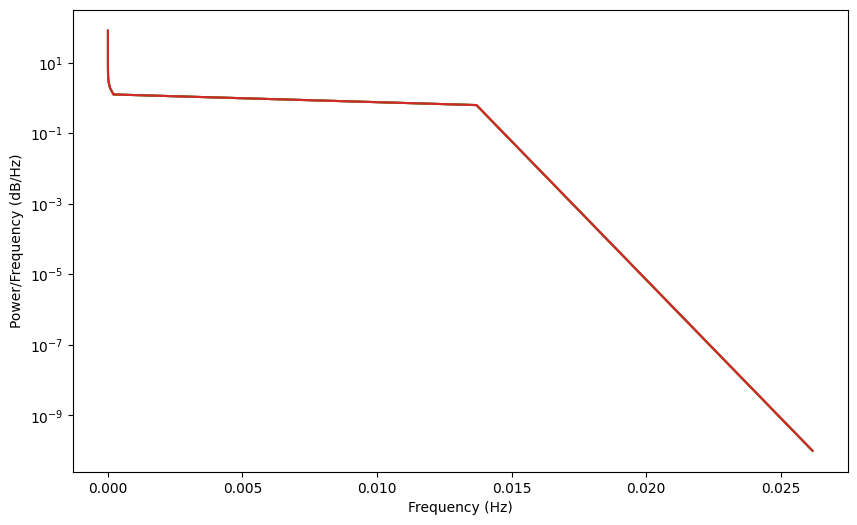

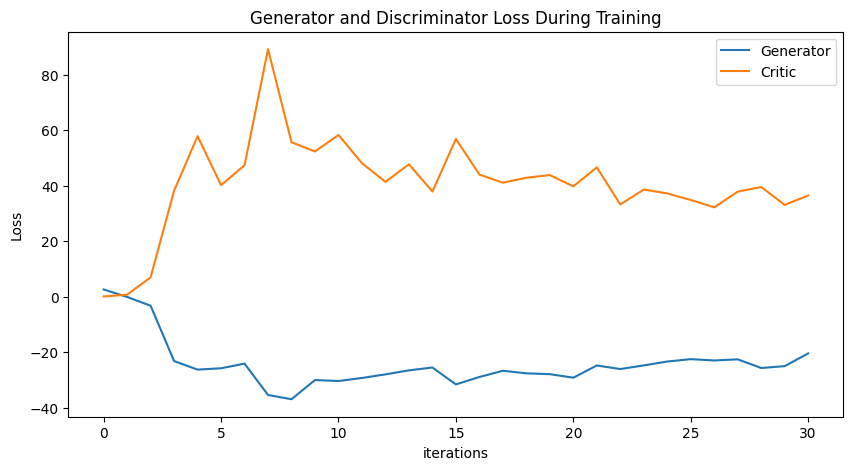

Epoch 40: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan]) Generator err ([0.0501750148832798, 0.6815546751022339, 6.944819450378418, 38.156307220458984, 57.8366813659668, 40.167755126953125, 47.3557243347168, 89.18759155273438, 55.64822006225586, 52

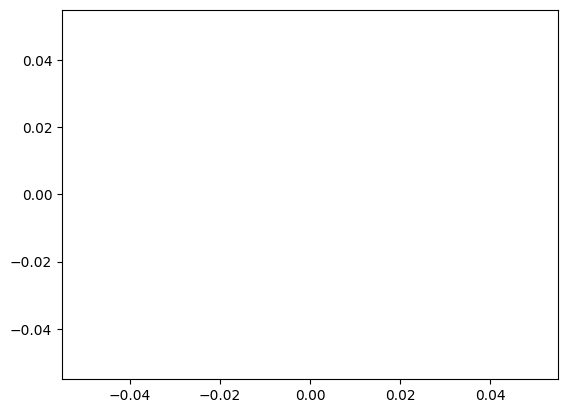

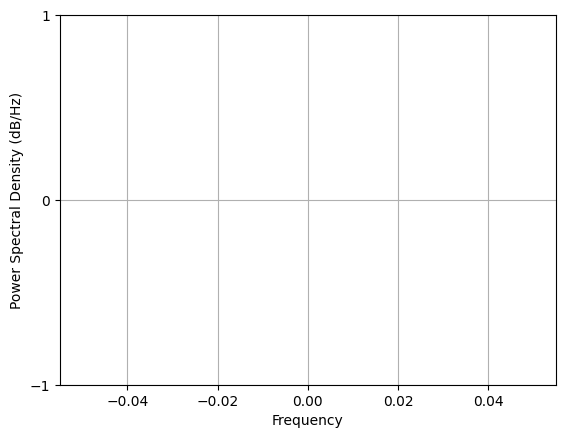

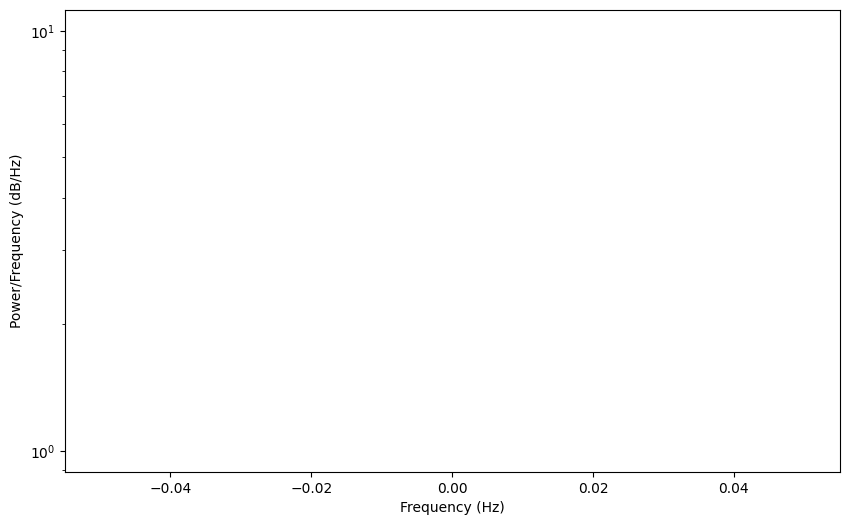

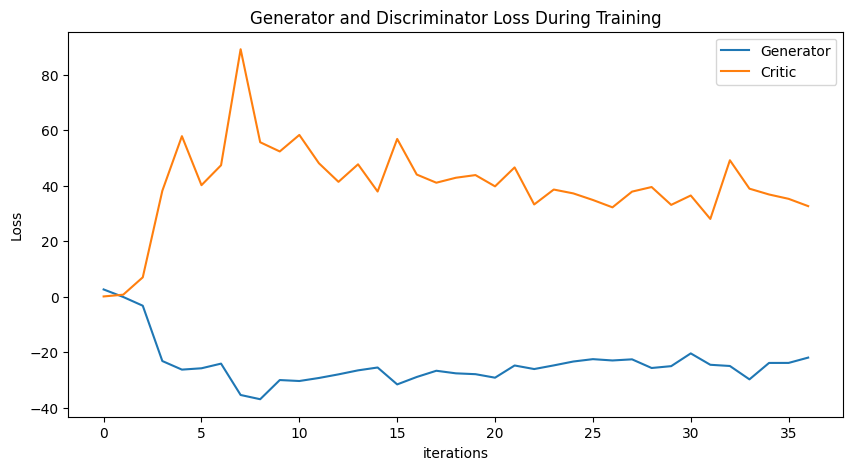

Epoch 50: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]) Generator err ([0.0501750148832798, 0.6815546751022339, 6.944819450378418, 38.156307220458984, 57.8366813659668, 40.167755126953125, 47.35572

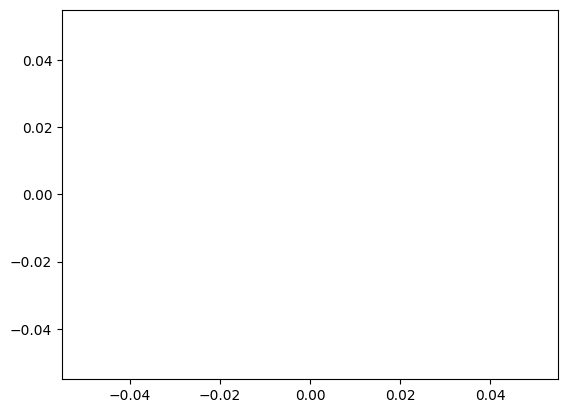

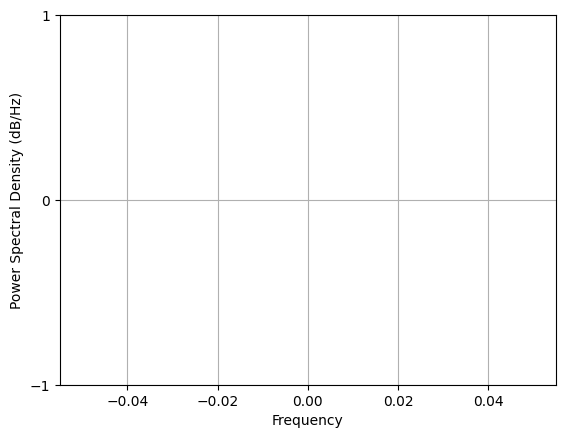

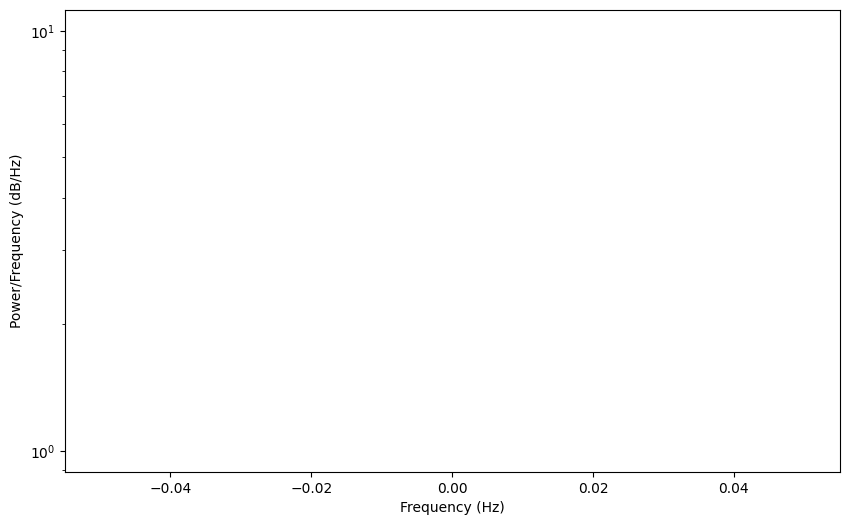

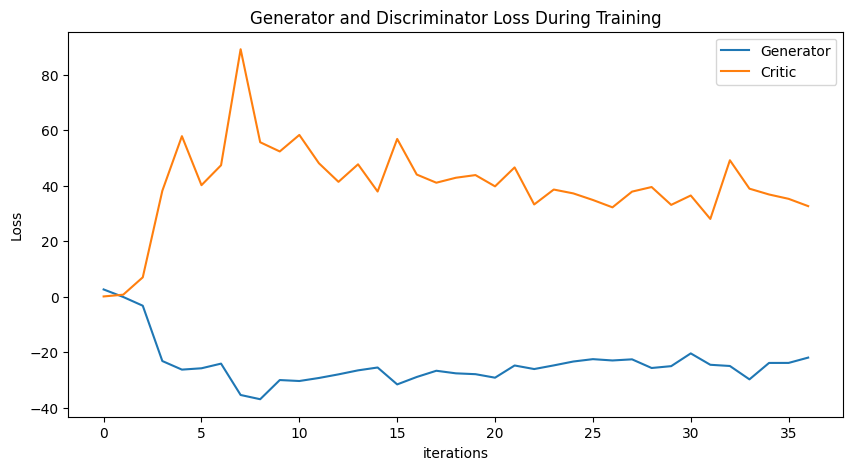

Epoch 60: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]) Generator err ([0.0501750148832798, 0.6815546751022339, 6.944819450378418, 38.1563072204589

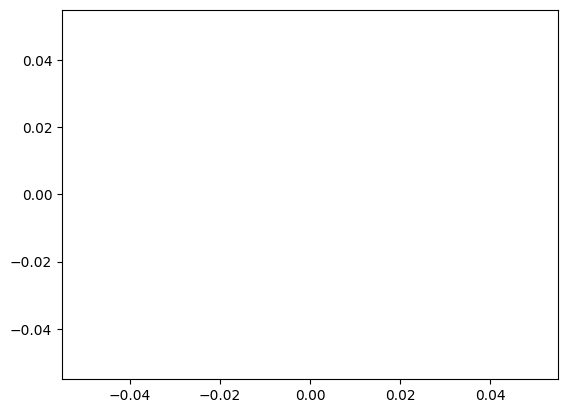

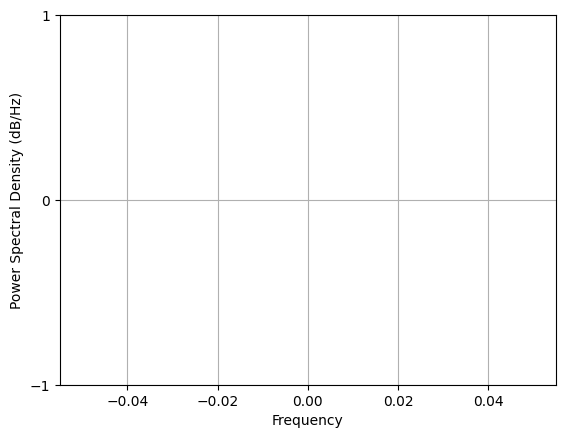

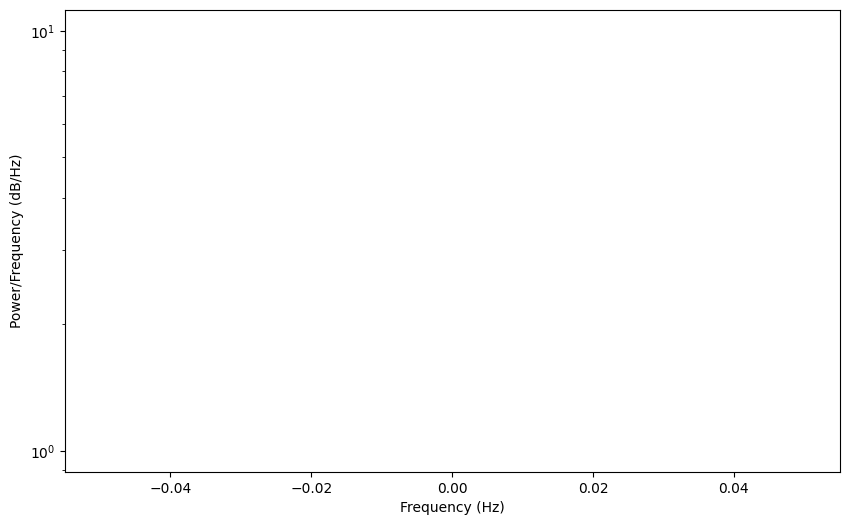

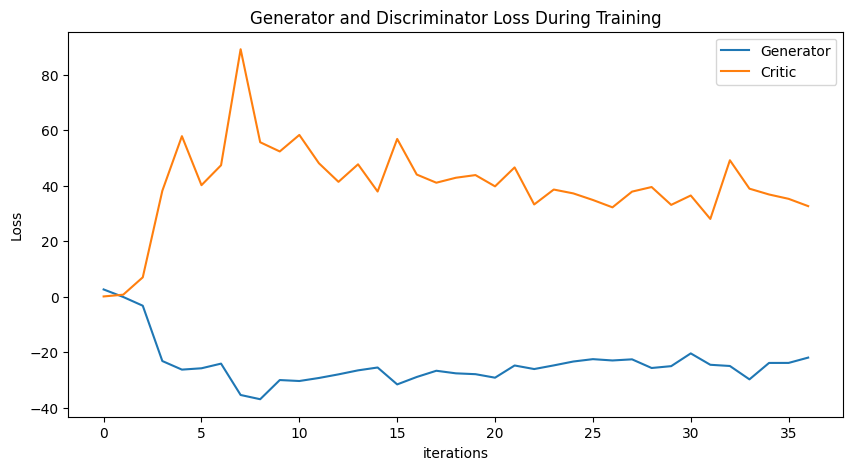

Epoch 70: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan]) Generator err ([0.0501750148832798, 0.681

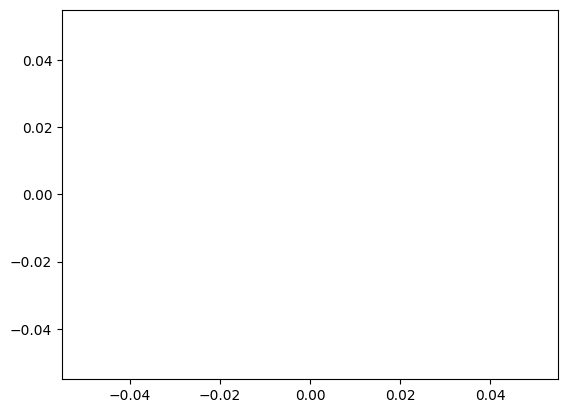

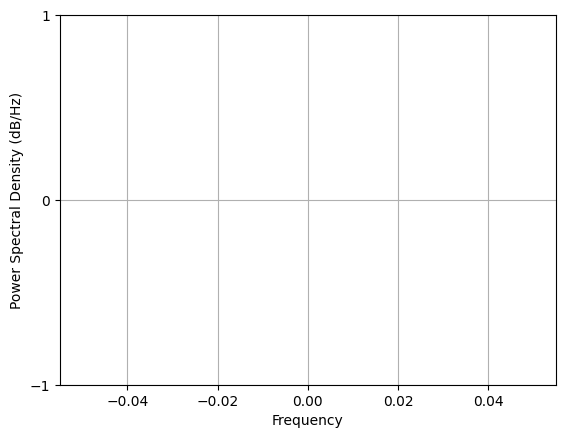

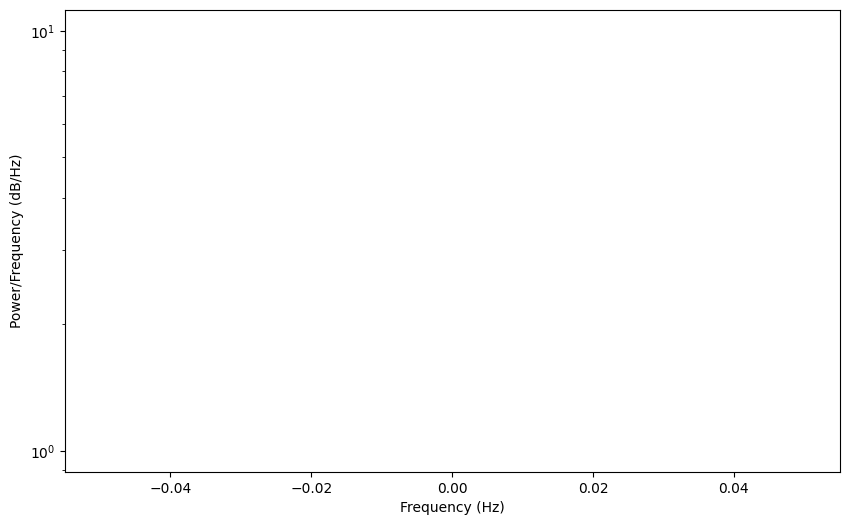

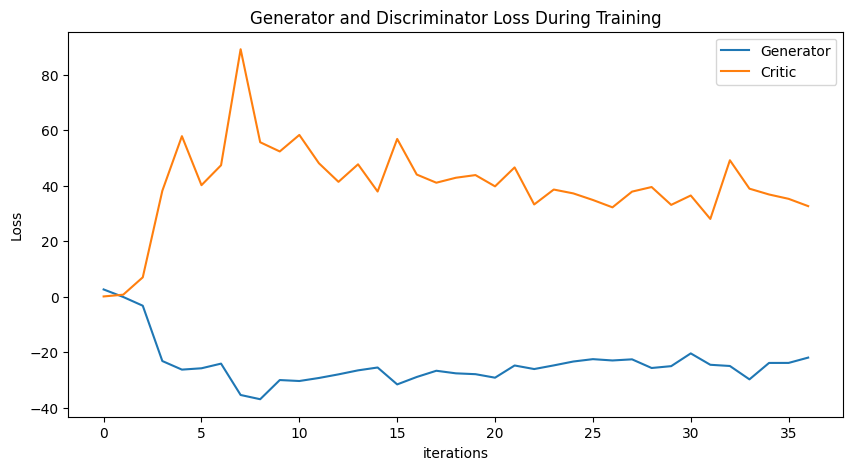

Epoch 80: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, na

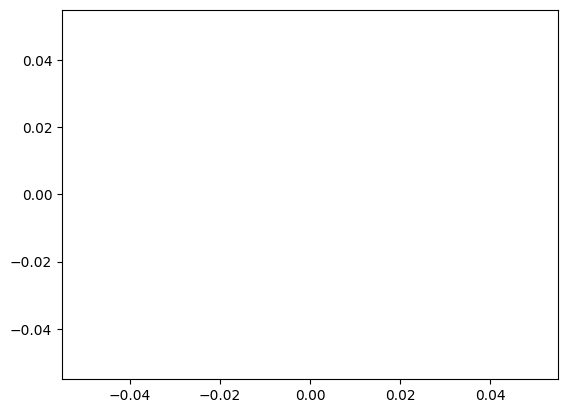

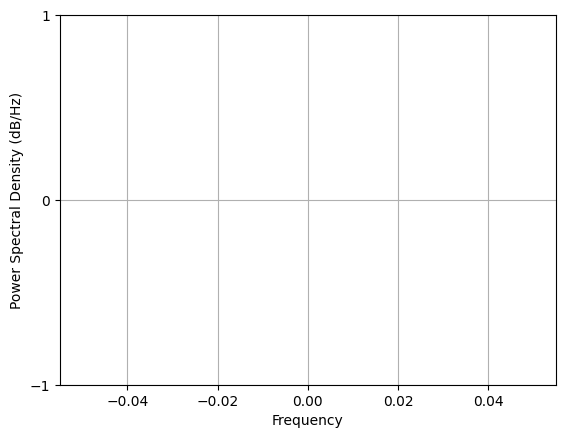

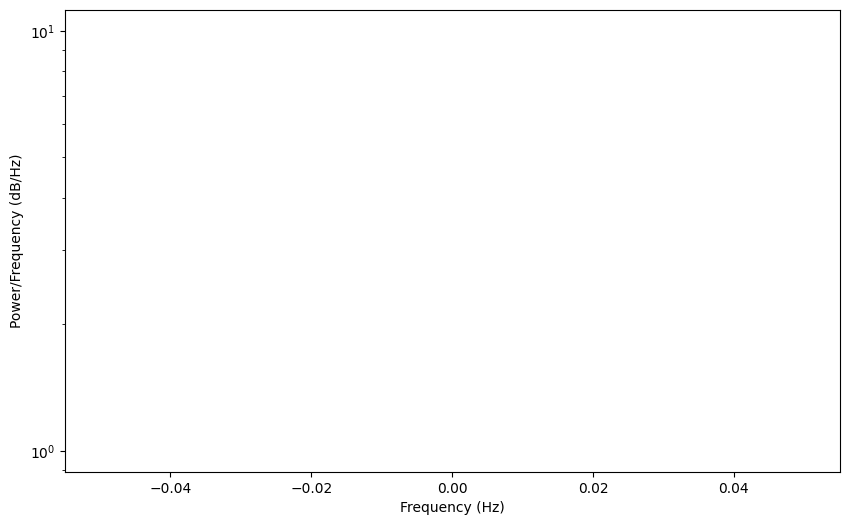

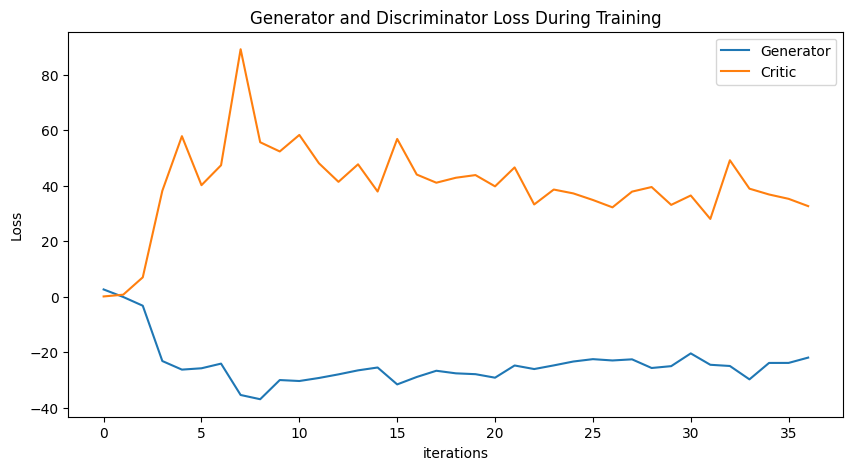

Epoch 90: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, na

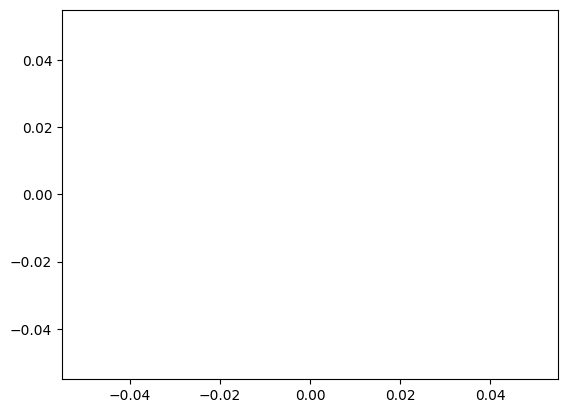

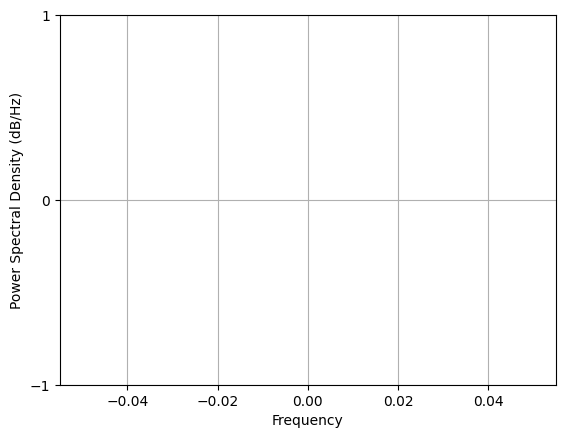

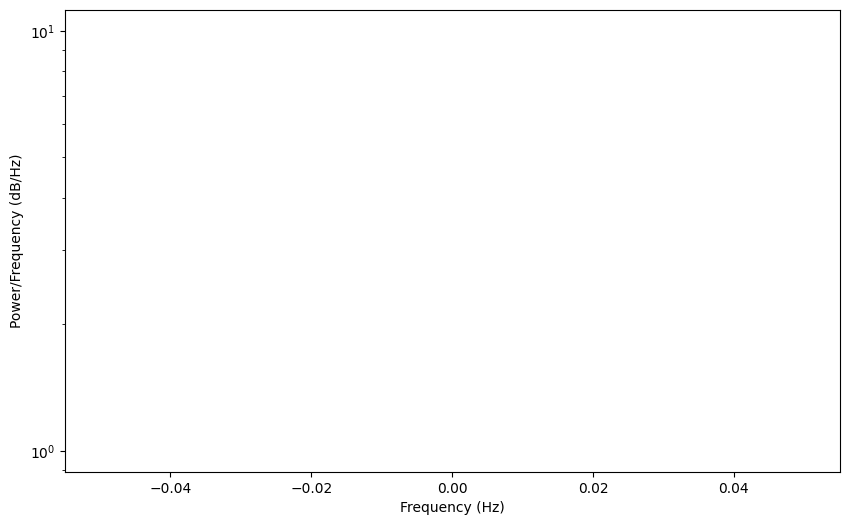

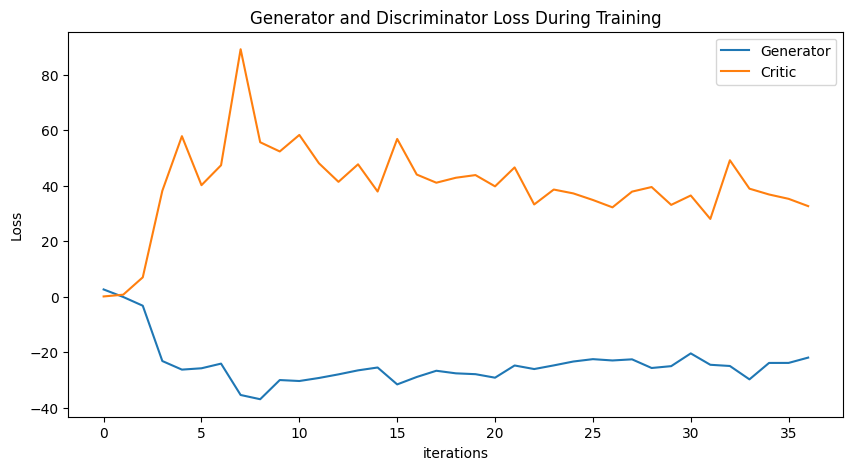

Epoch 100: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

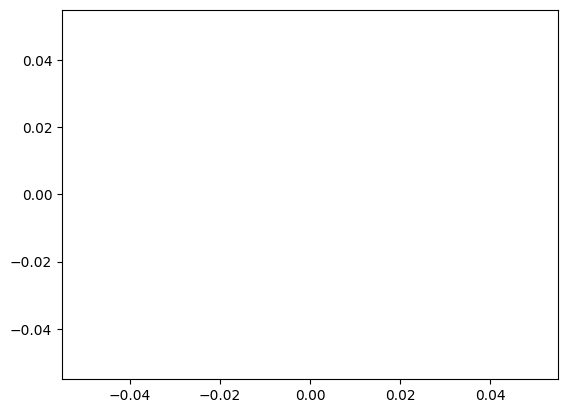

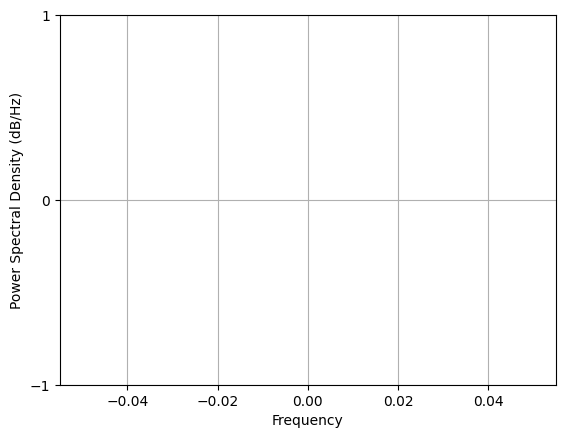

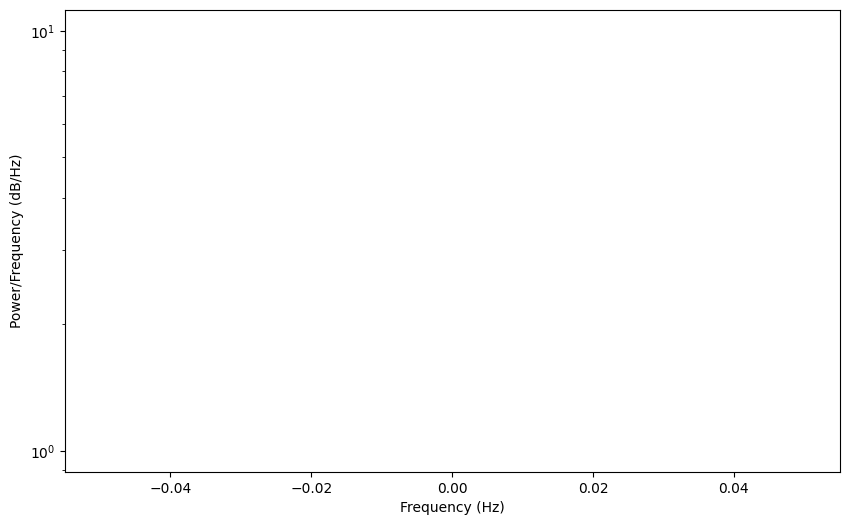

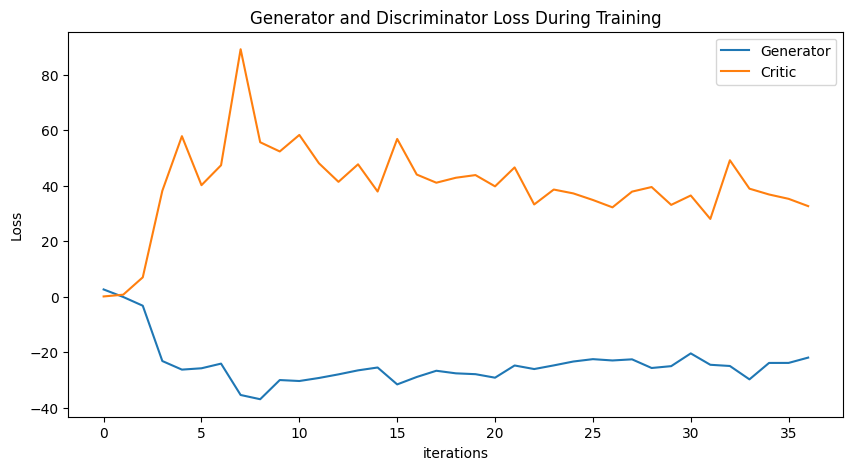

Epoch 110: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

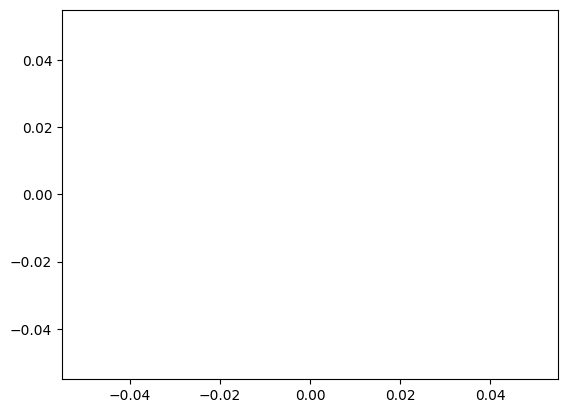

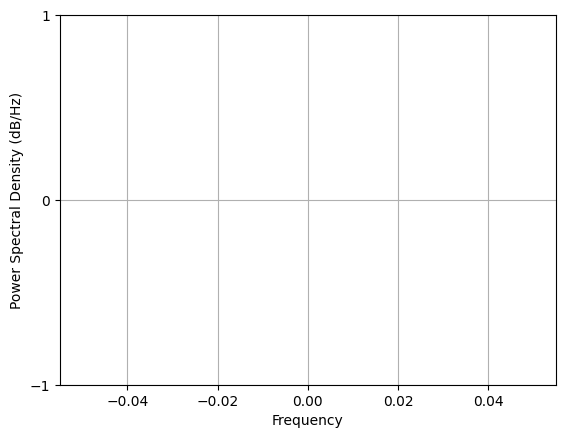

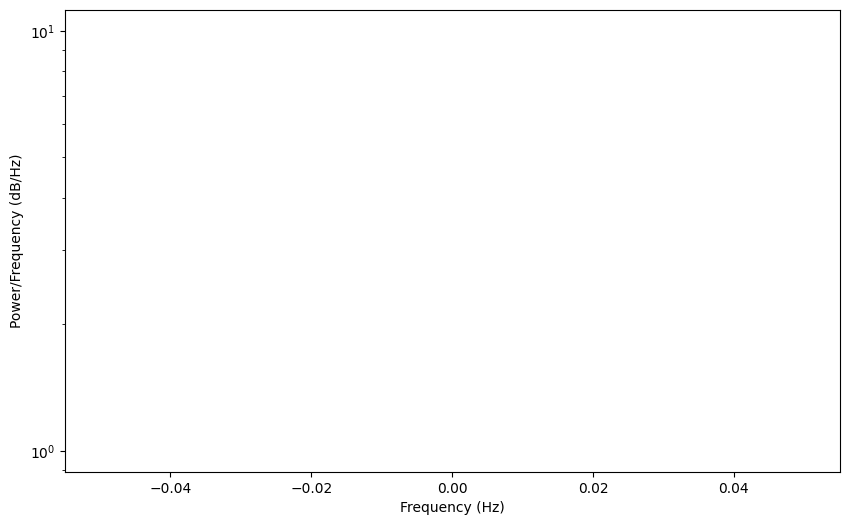

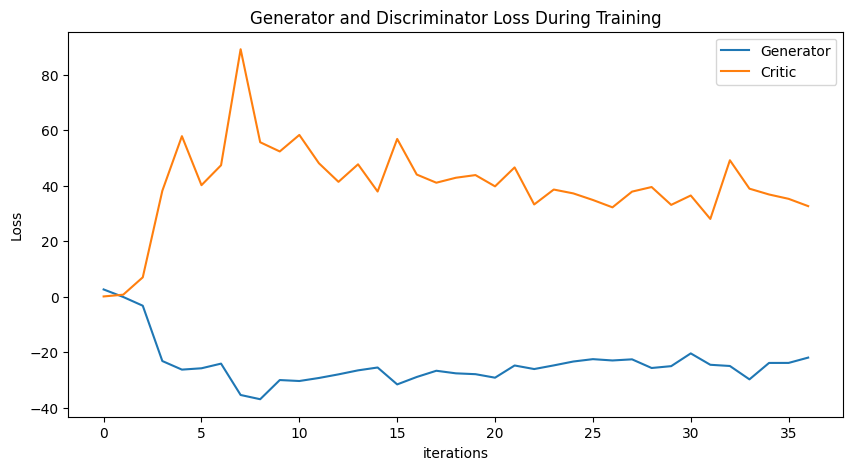

Epoch 120: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

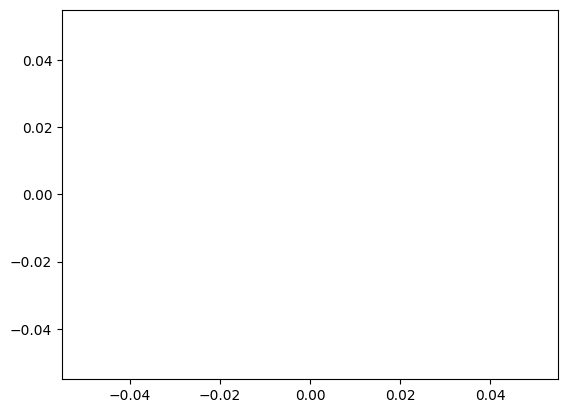

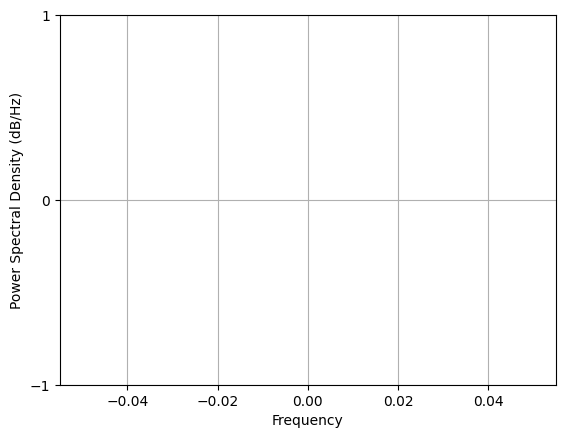

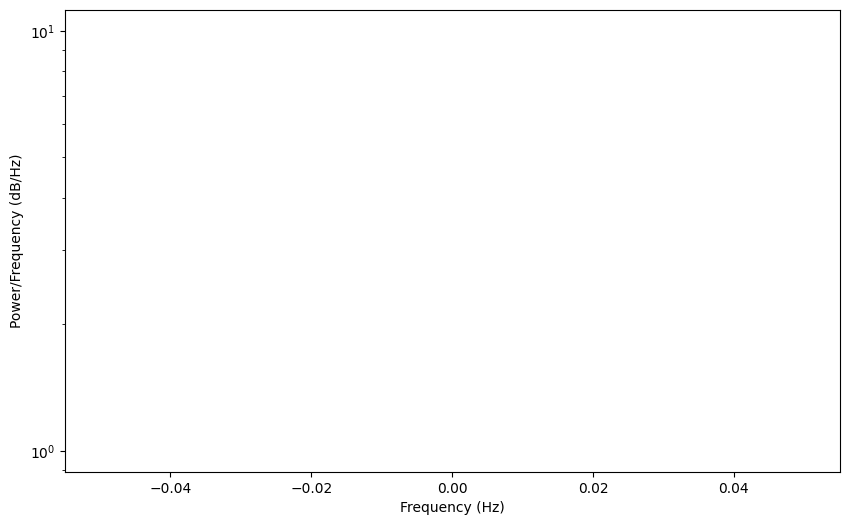

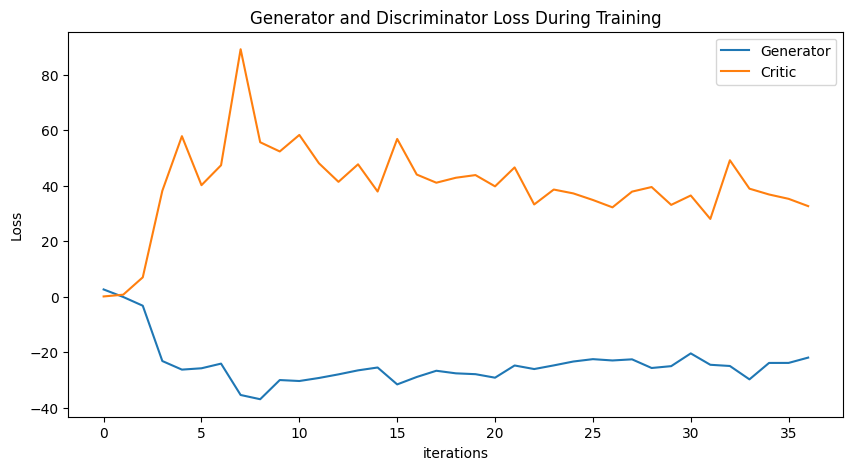

Epoch 130: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

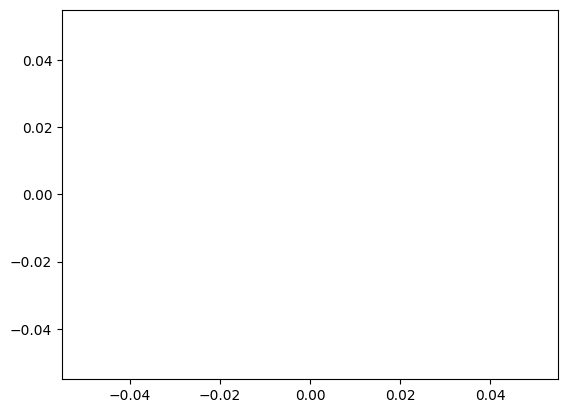

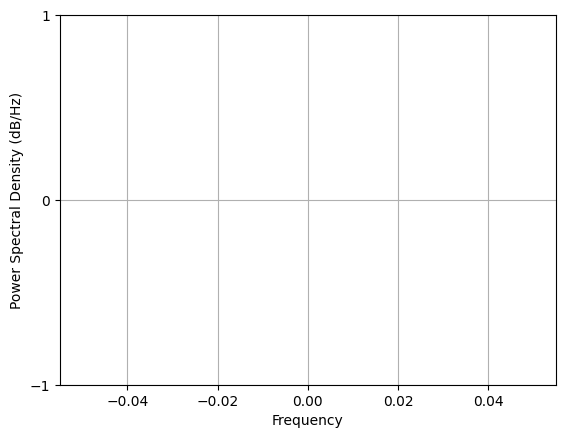

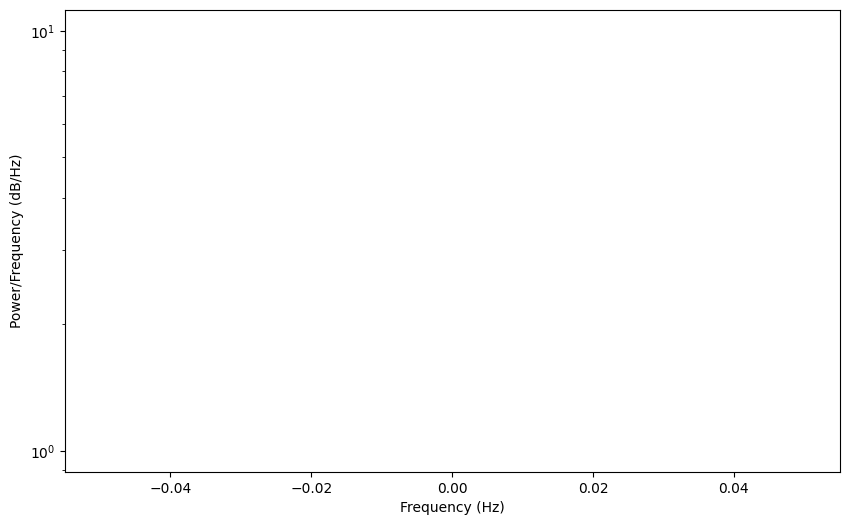

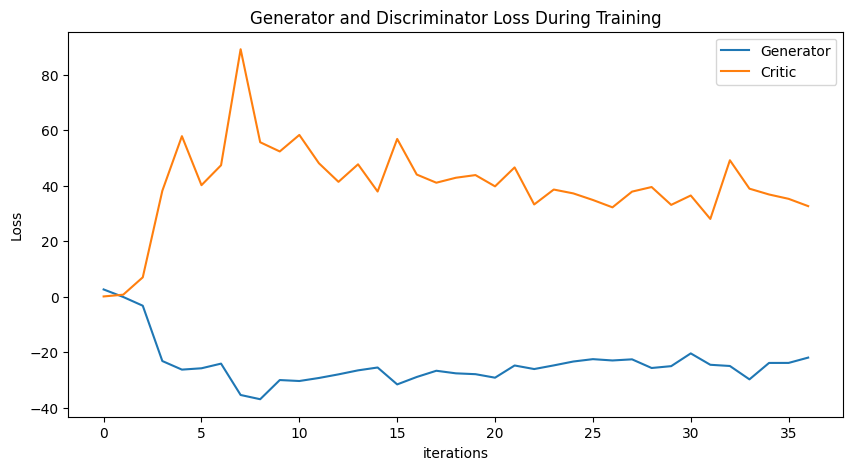

Epoch 140: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

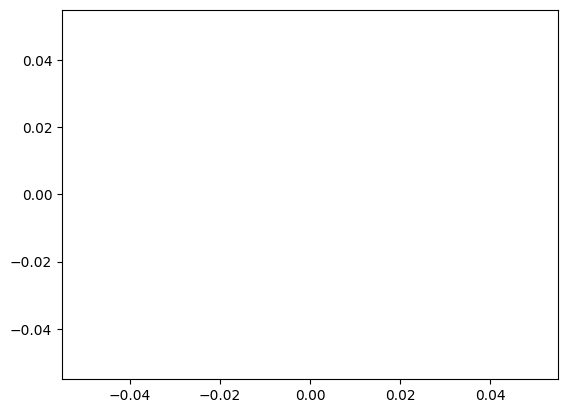

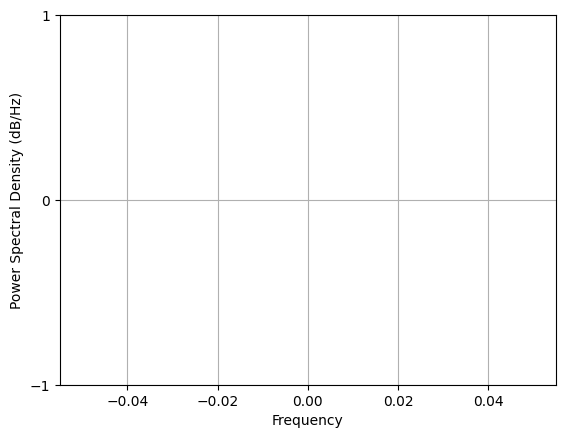

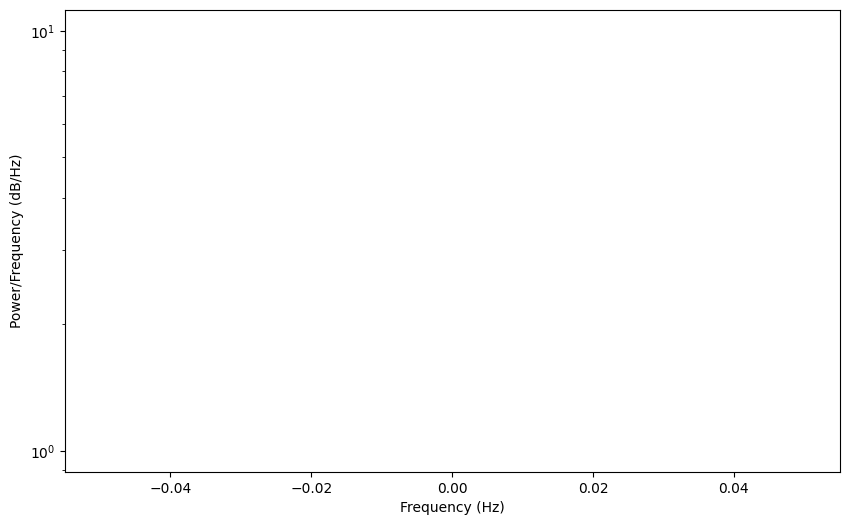

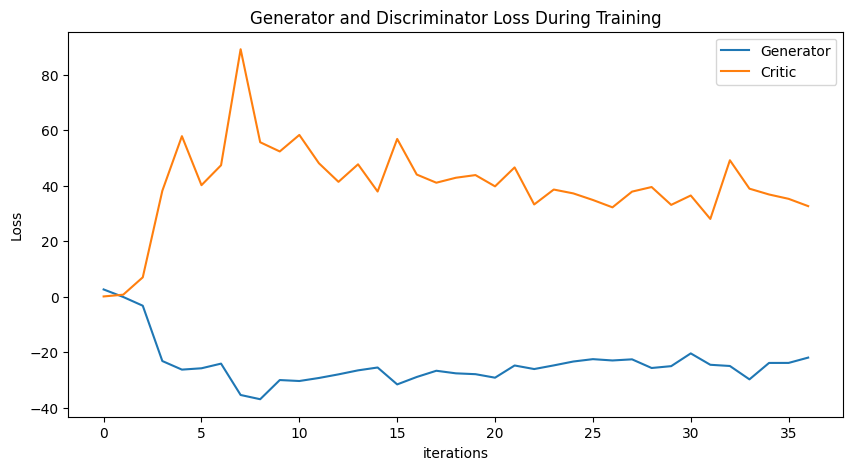

Epoch 150: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

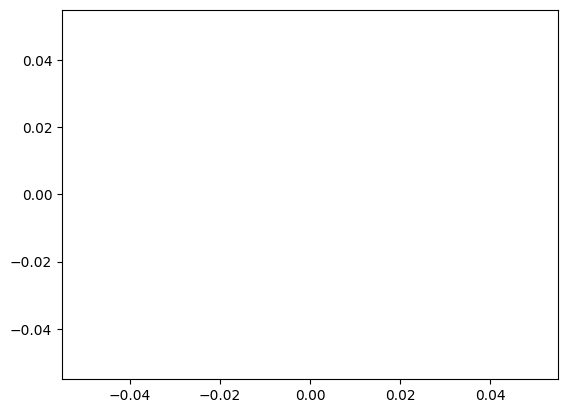

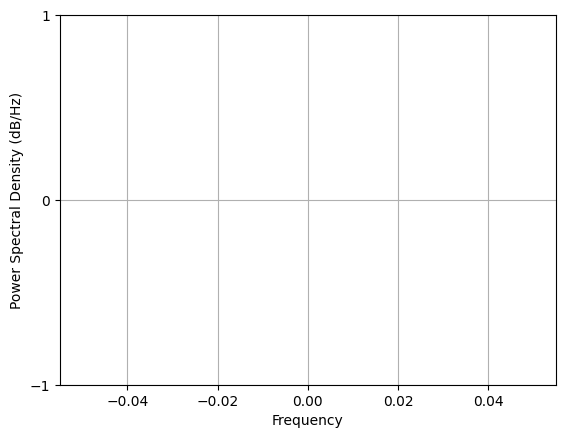

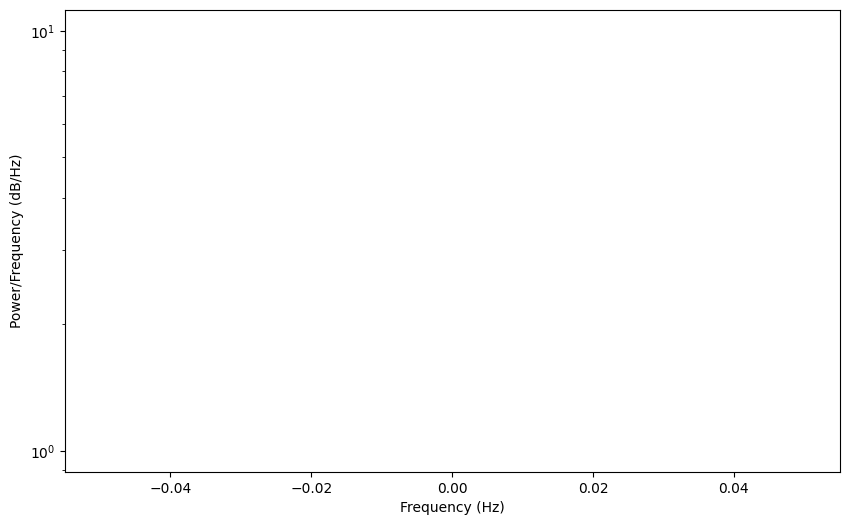

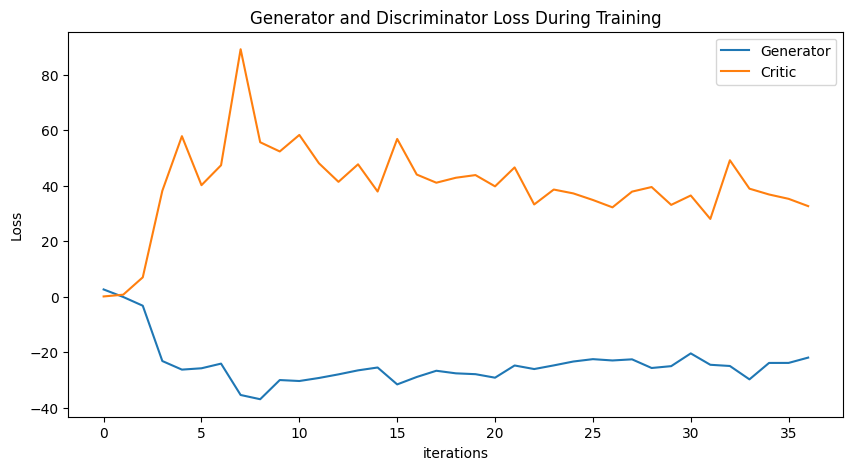

Epoch 160: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

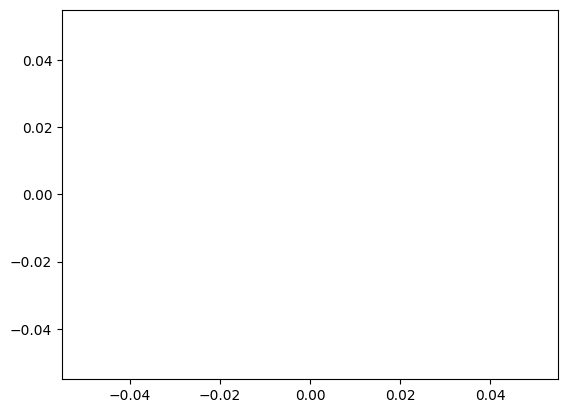

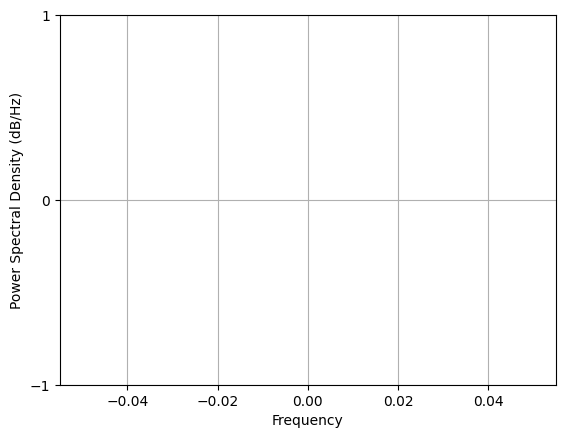

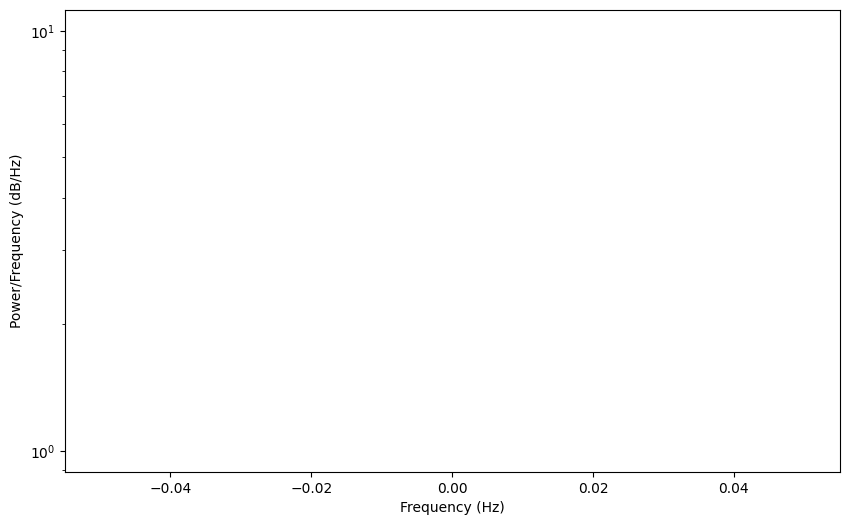

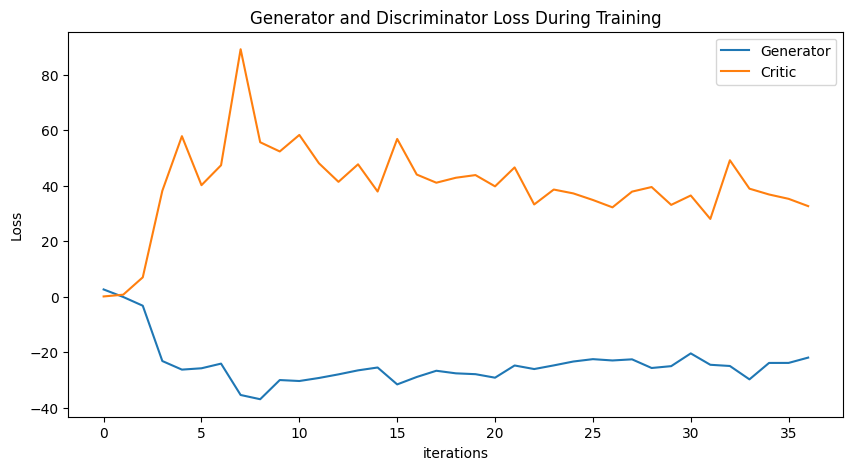

Epoch 170: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

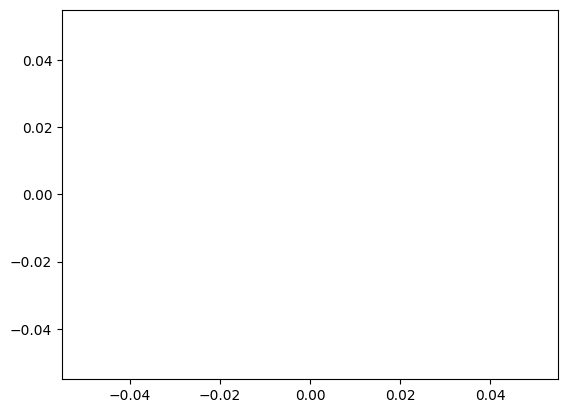

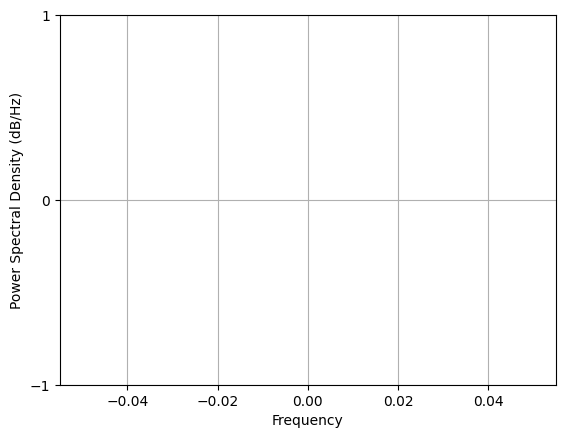

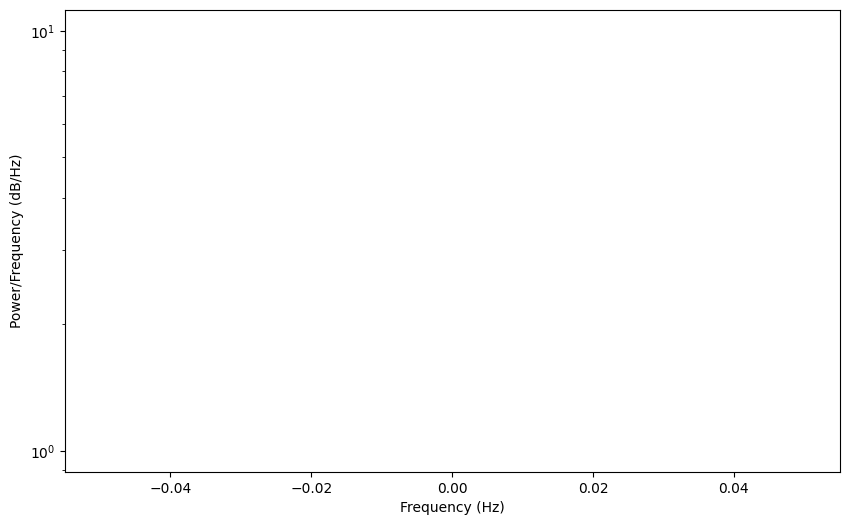

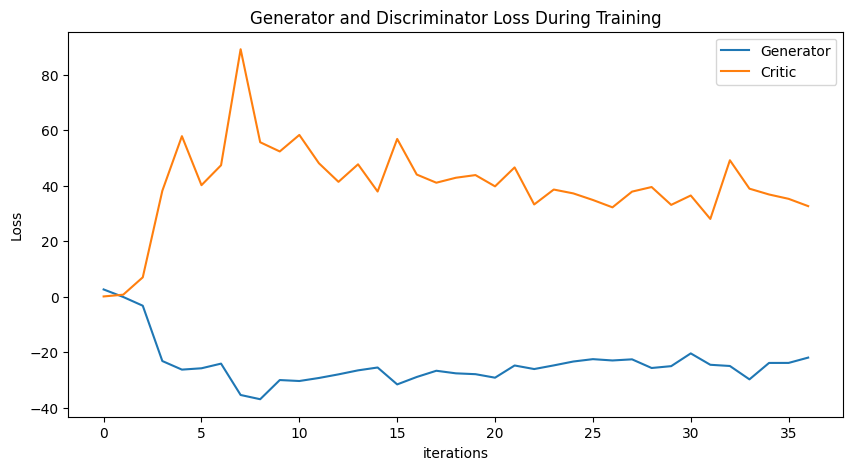

Epoch 180: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

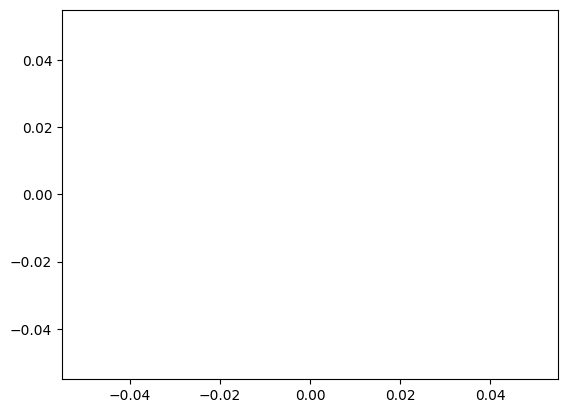

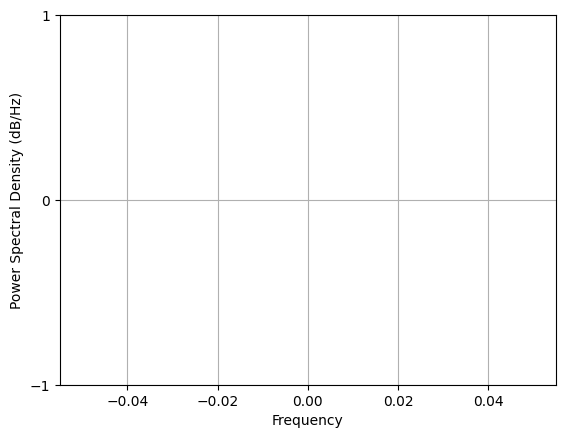

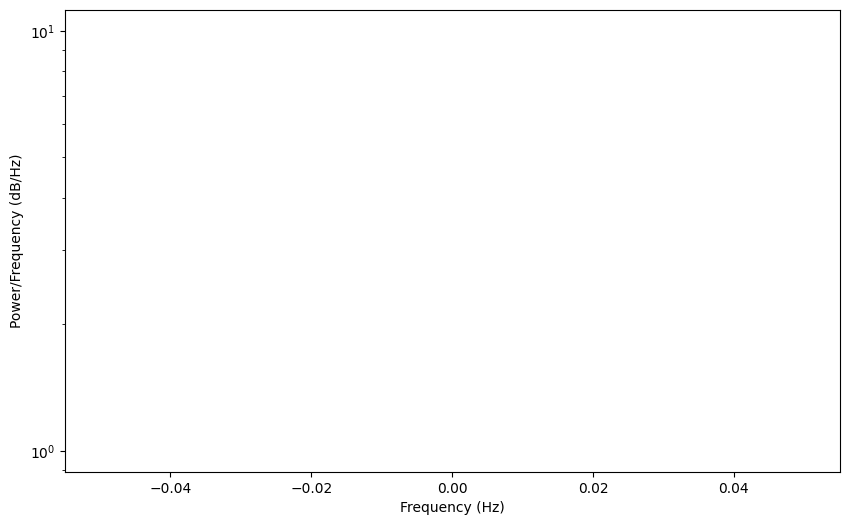

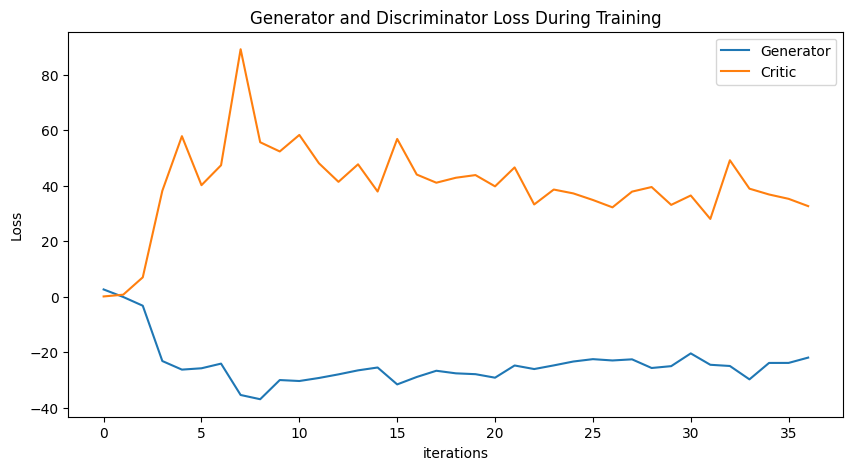

Epoch 190: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

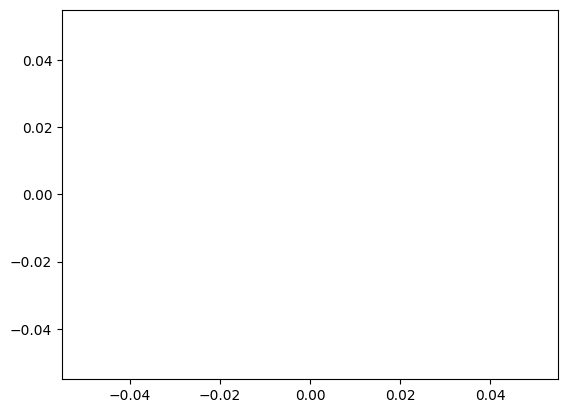

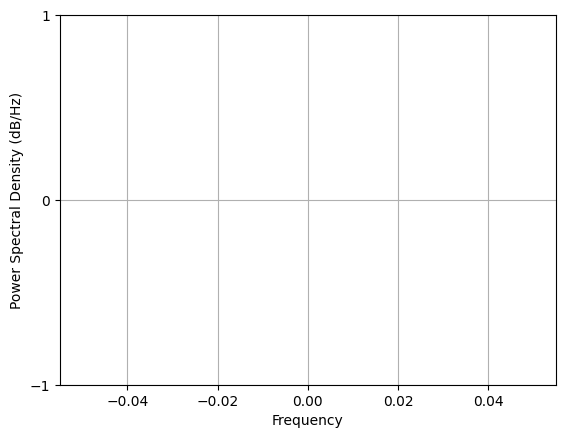

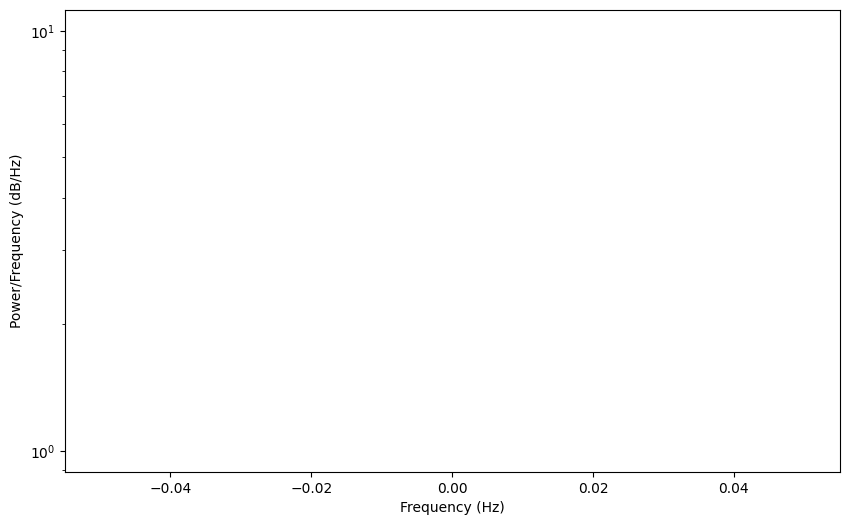

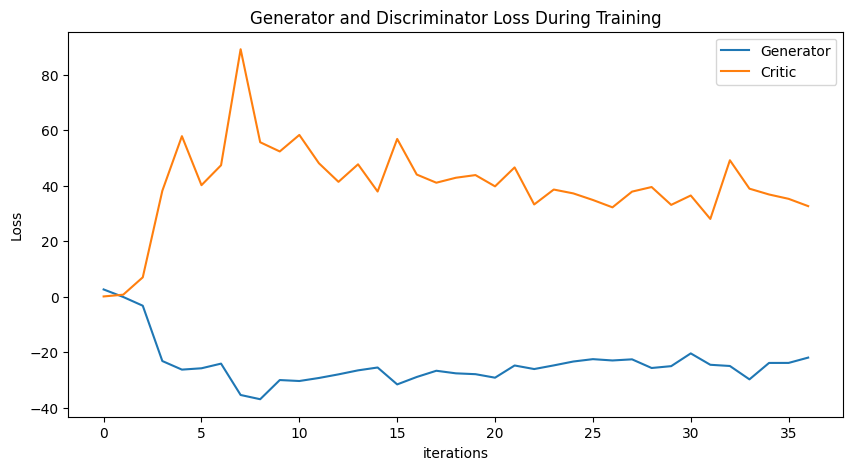

Epoch 200: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

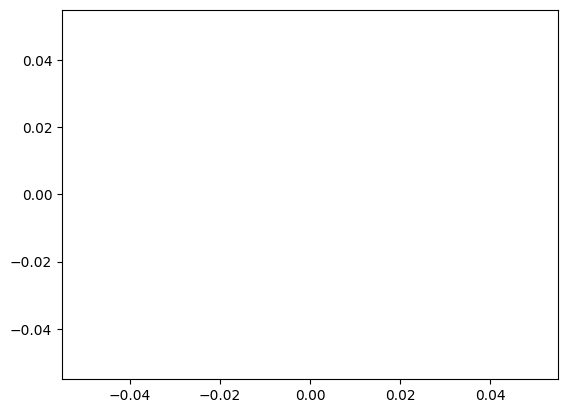

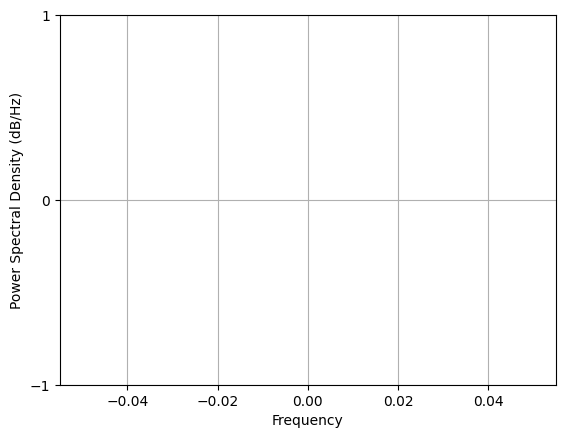

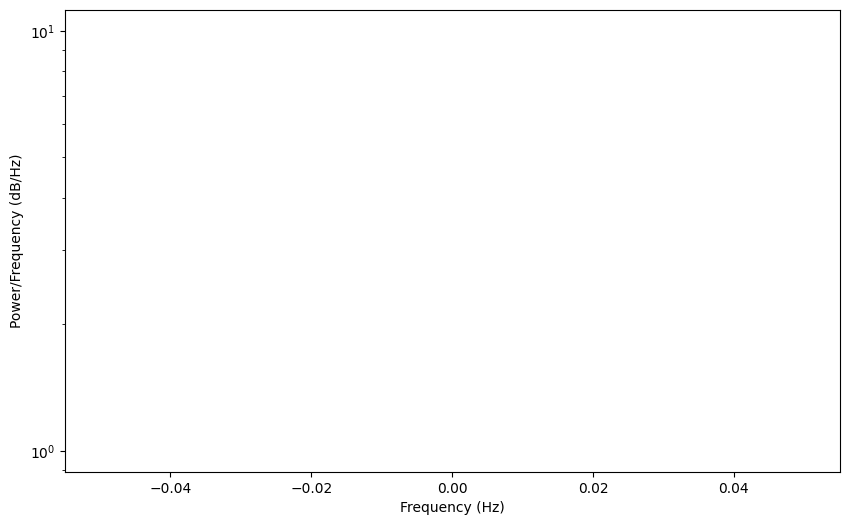

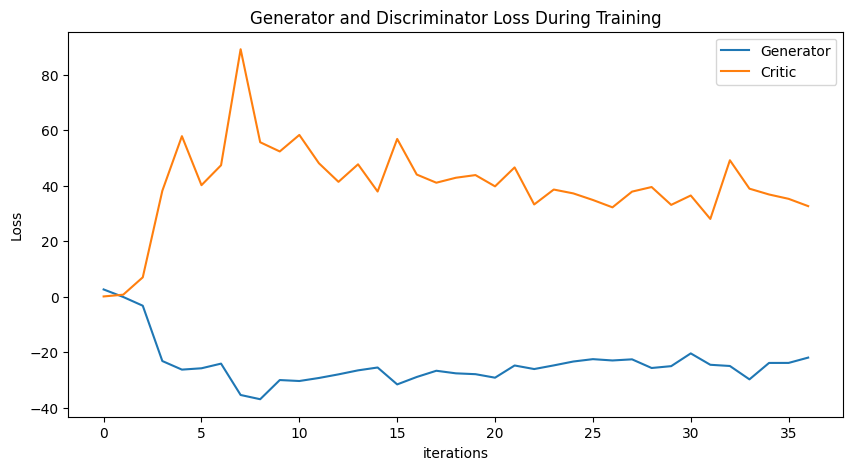

Epoch 210: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

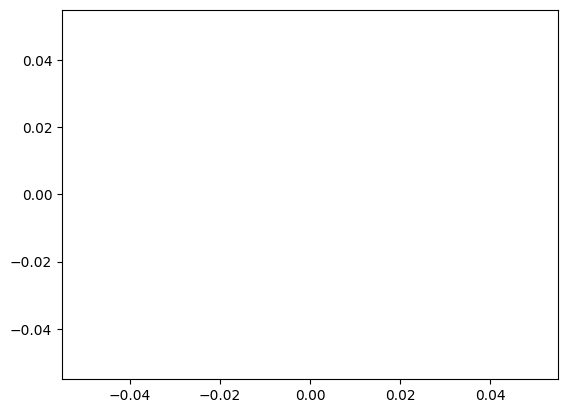

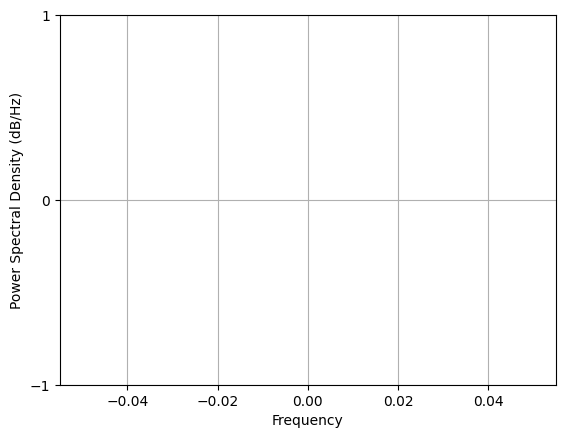

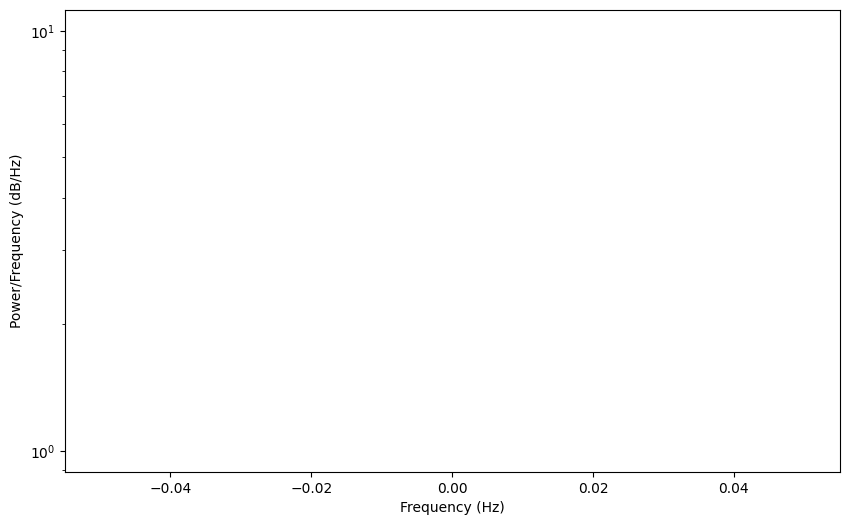

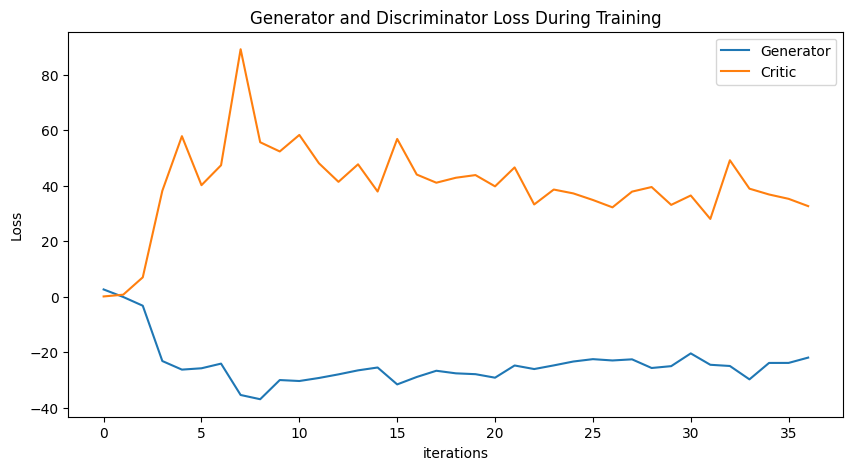

Epoch 220: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

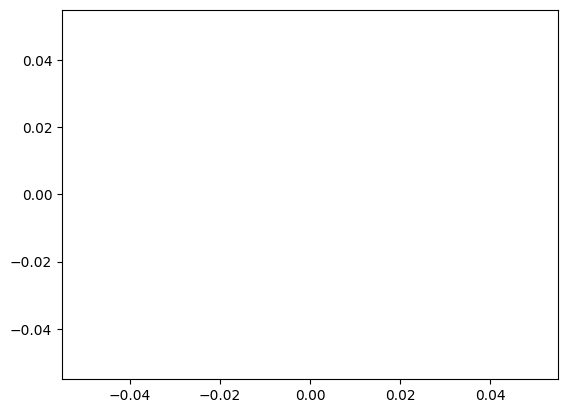

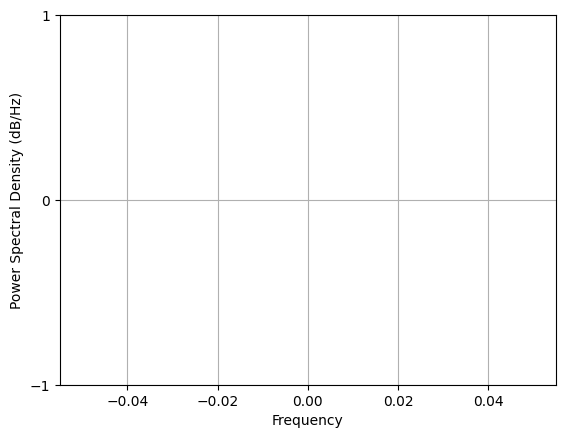

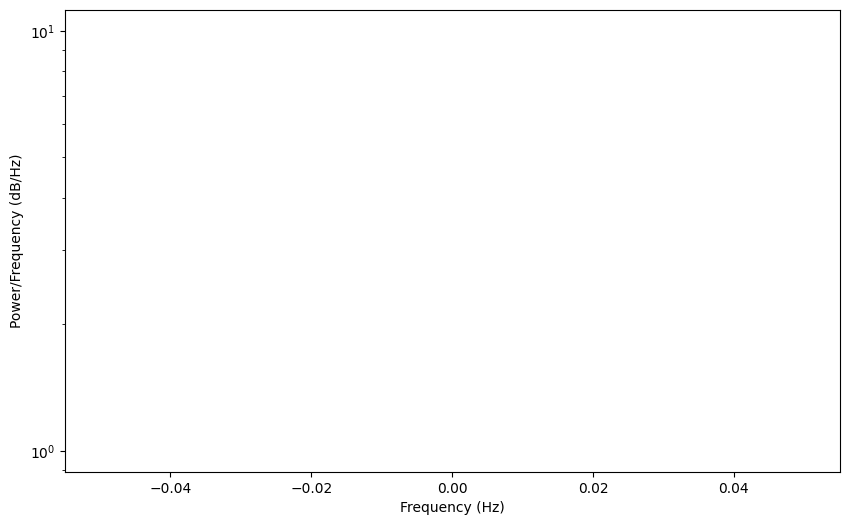

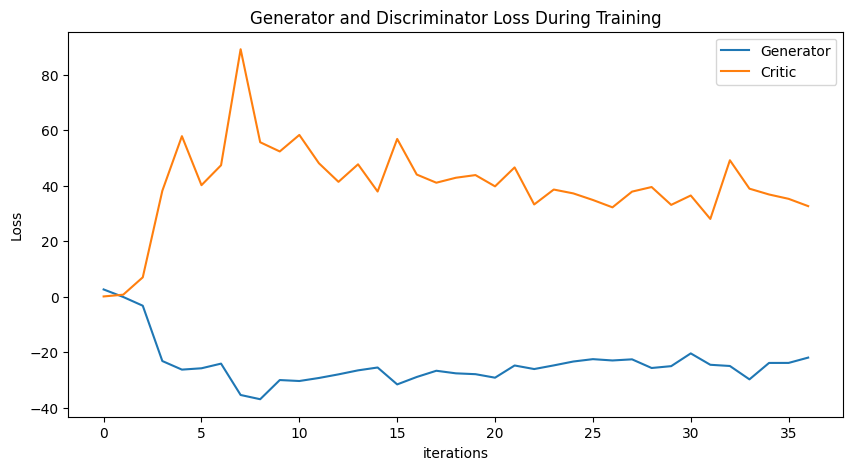

Epoch 230: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

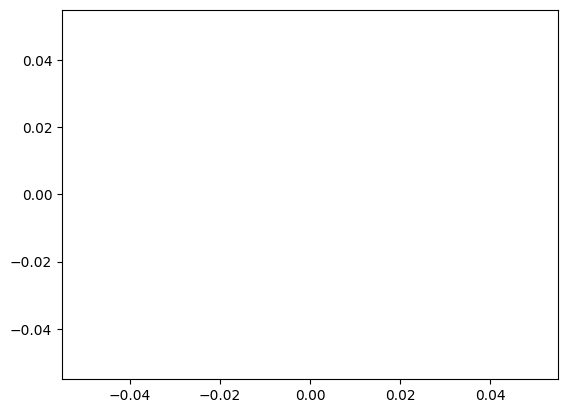

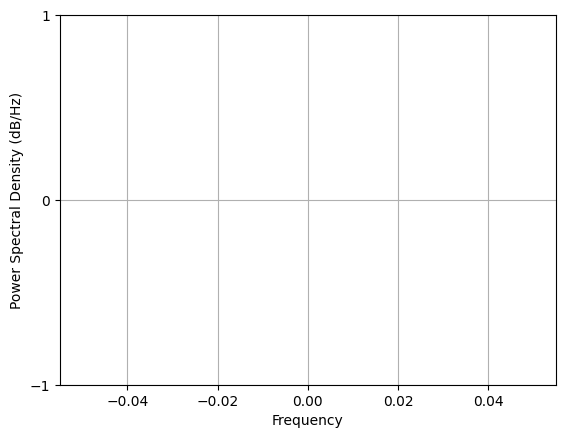

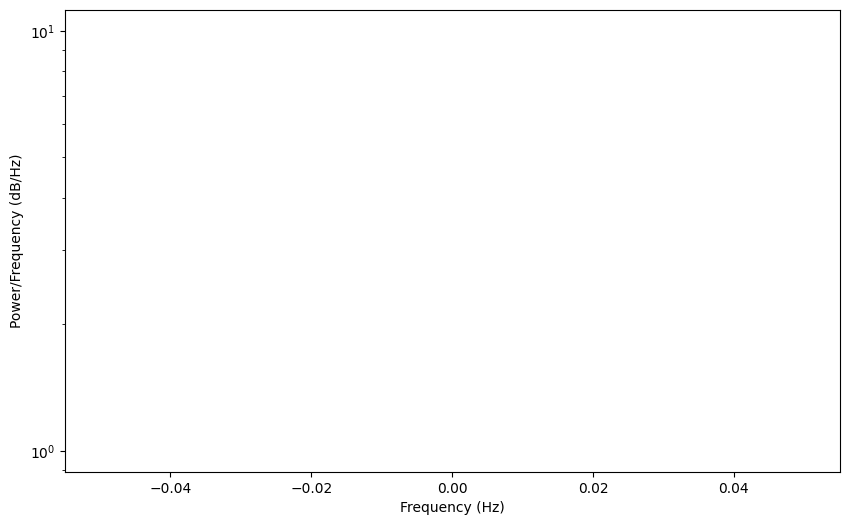

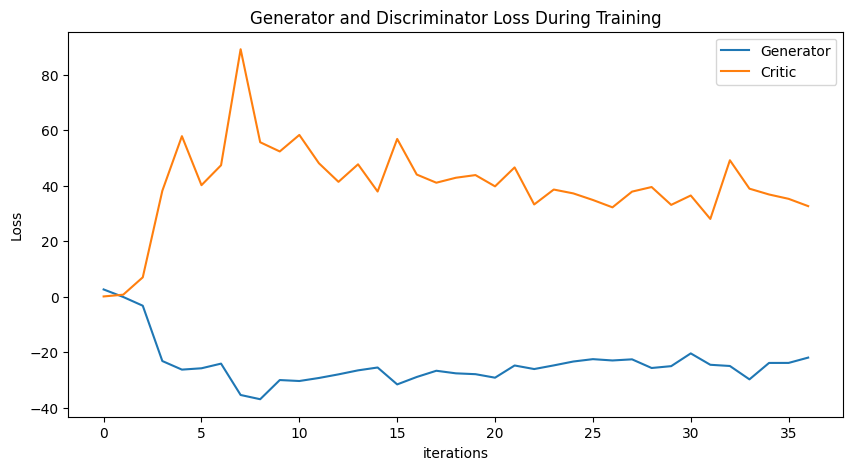

Epoch 240: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

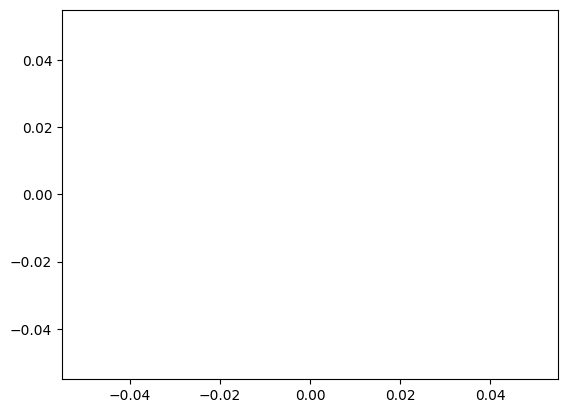

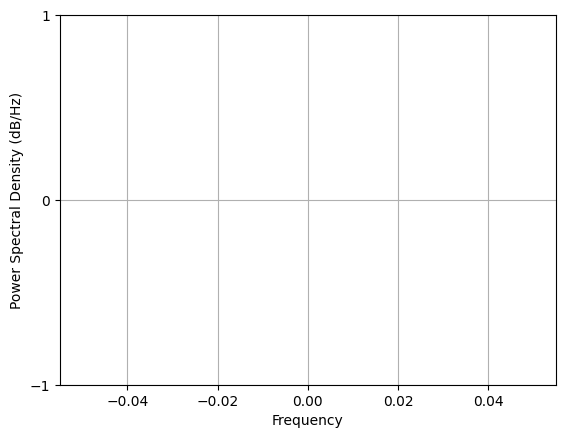

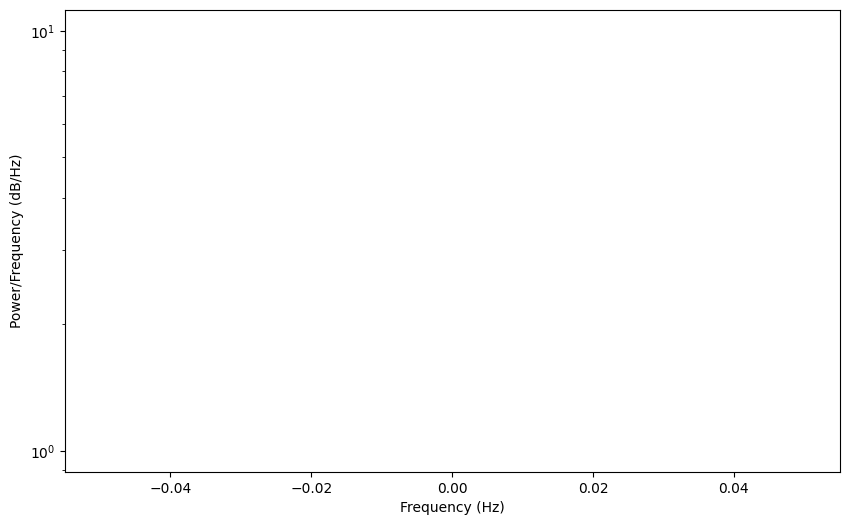

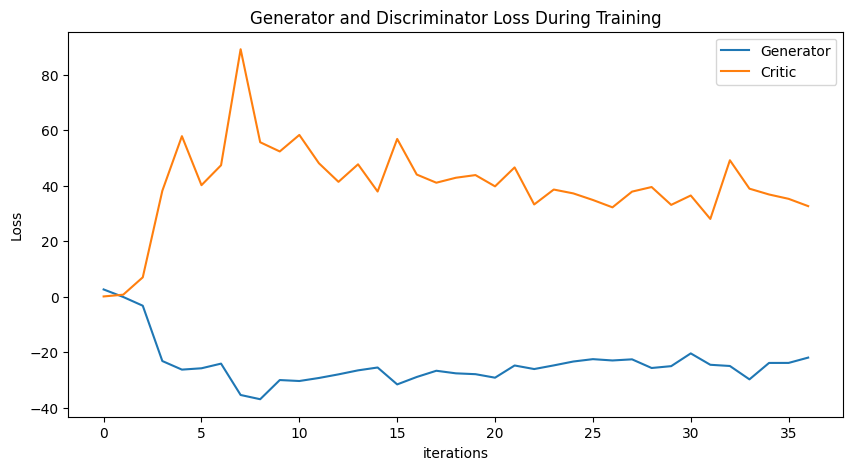

Epoch 250: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

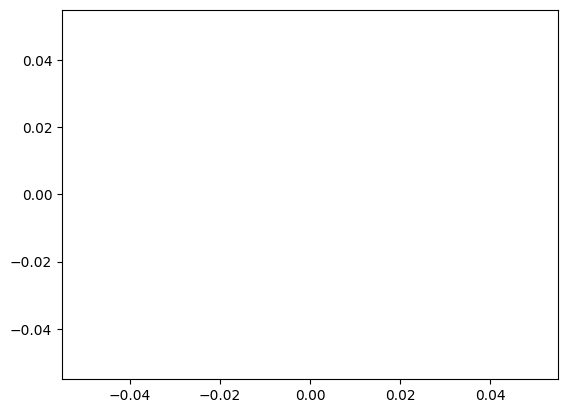

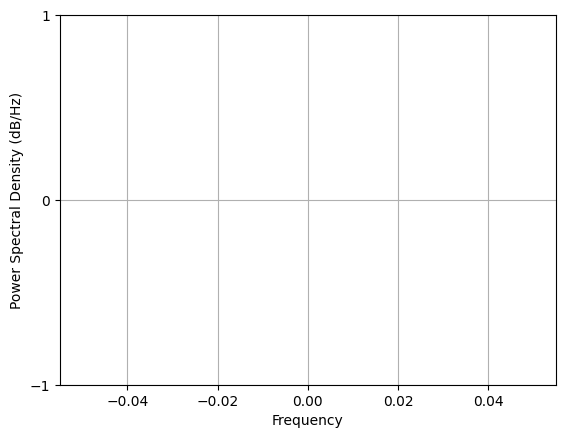

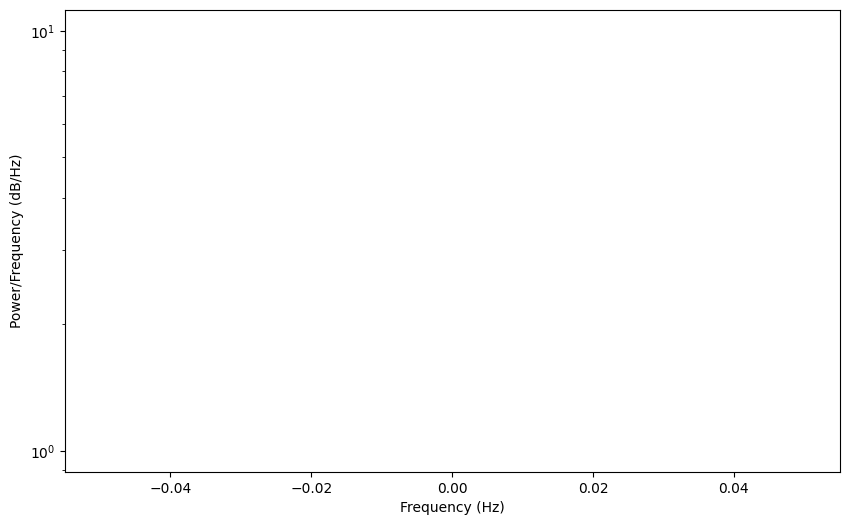

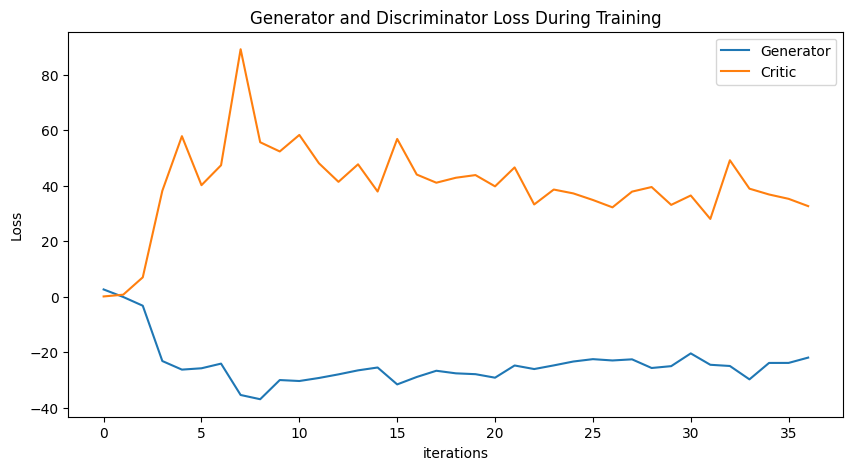

Epoch 260: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

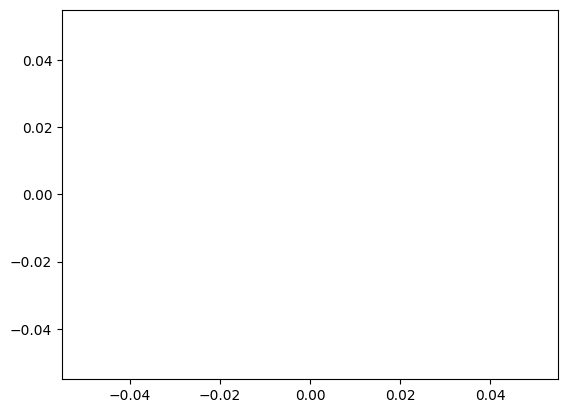

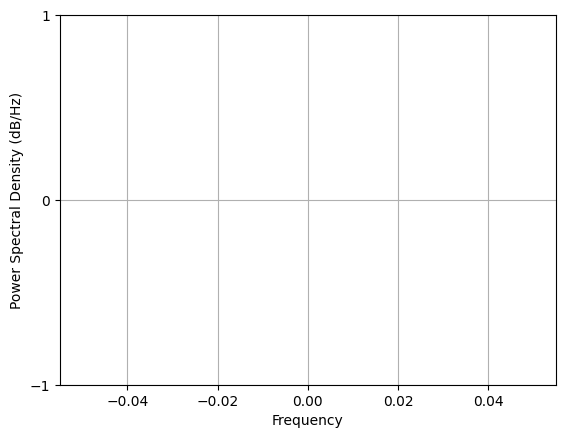

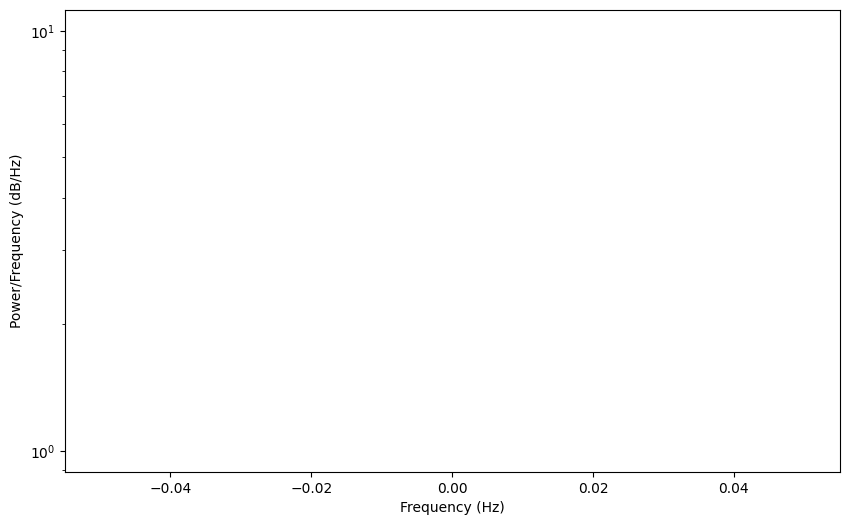

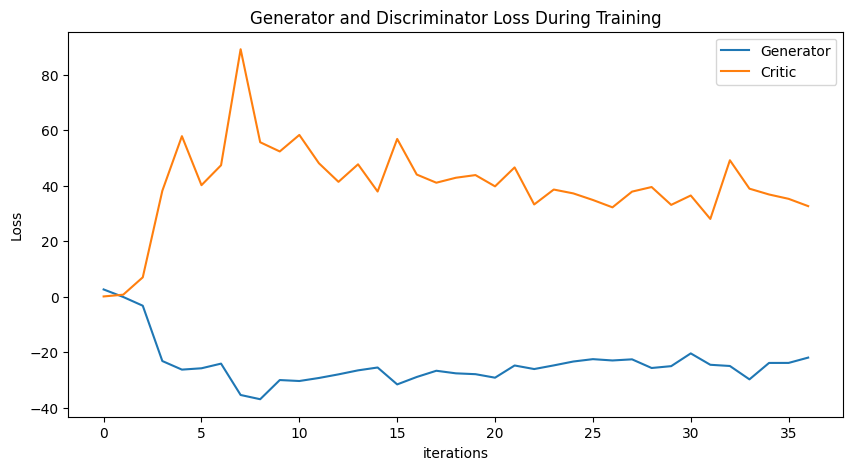

Epoch 270: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

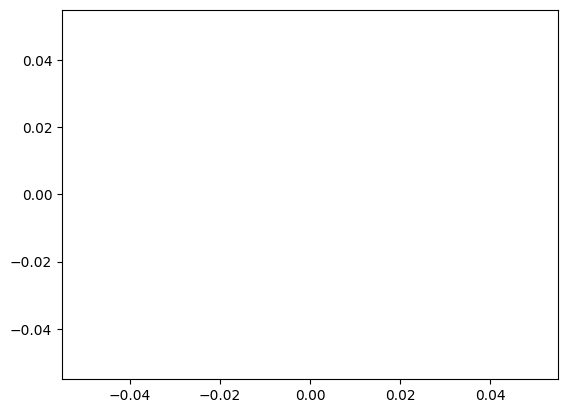

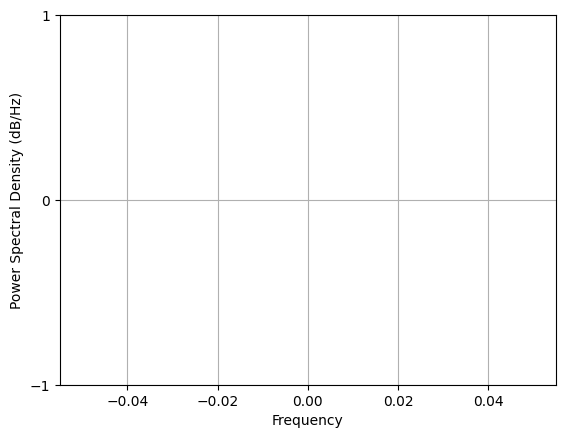

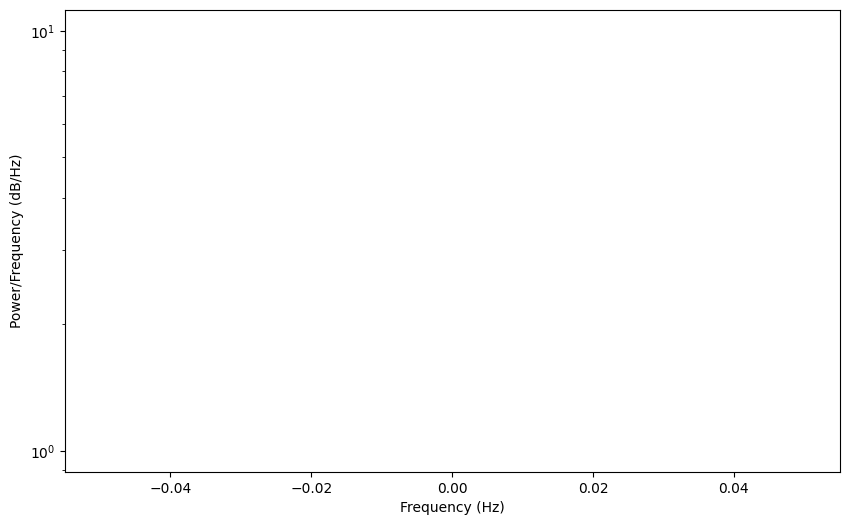

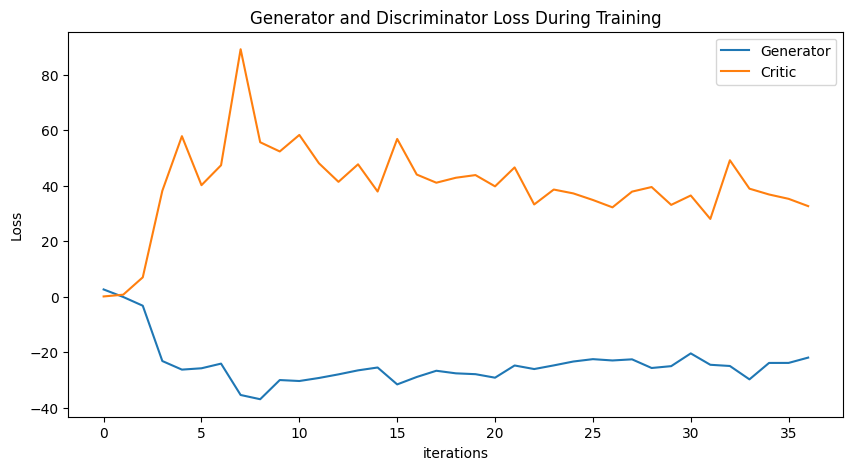

Epoch 280: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

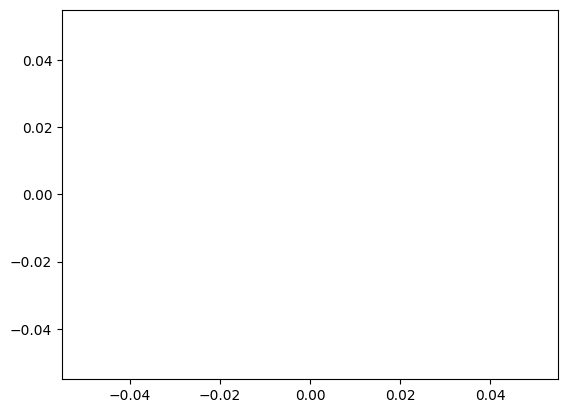

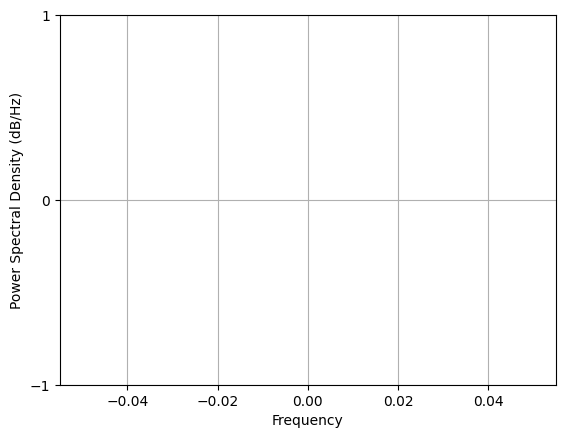

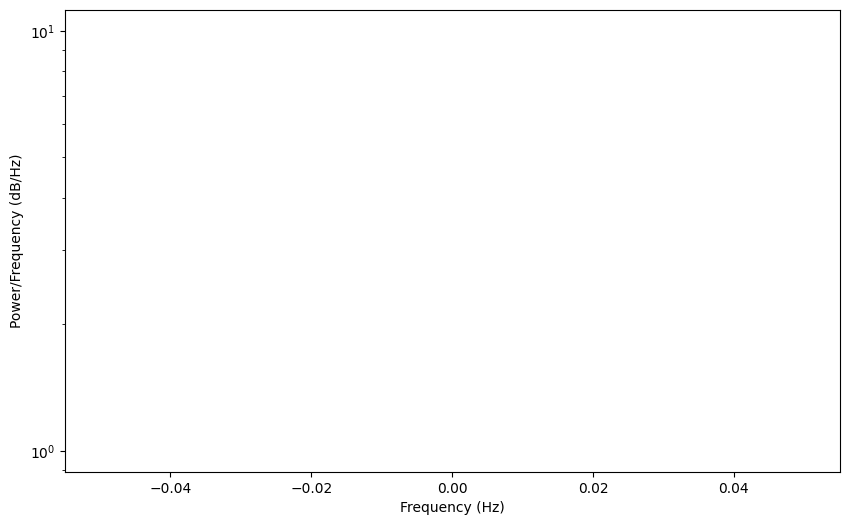

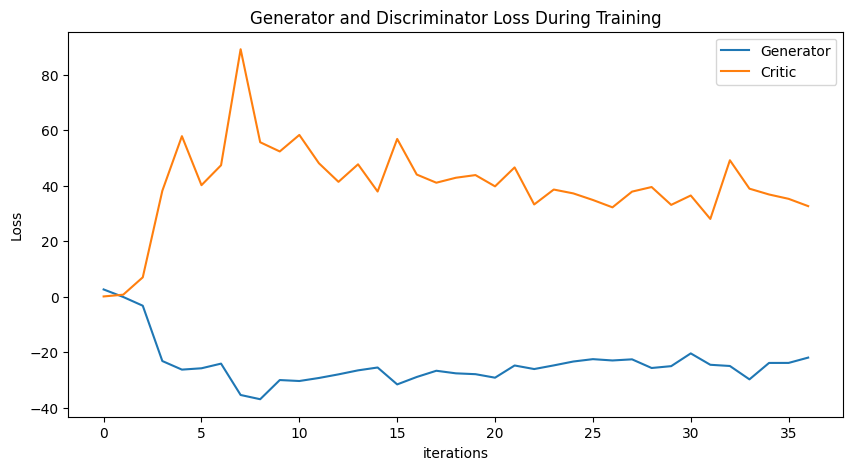

Epoch 290: Critic error ([2.5734890658274168, -0.13796917239794865, -3.293401151567059, -23.23836544742976, -26.332307384463085, -25.849305626799143, -24.172661588232494, -35.47877026866948, -37.0064977578397, -30.09283083016661, -30.440529461559926, -29.34964893083577, -28.04408986173155, -26.598174690863367, -25.57040808041848, -31.665725295324357, -28.98540081551512, -26.74316600418918, -27.672844928083723, -27.975976270883375, -29.241021711114488, -24.843096913680327, -26.126179449972145, -24.811943746546696, -23.410644029499757, -22.55919363601189, -23.032619204027135, -22.625672111058634, -25.746381006140208, -25.082495351536778, -20.482461989931682, -24.589062269389288, -25.022329827046292, -29.848527377508088, -23.92357577718596, -23.916087898109467, -22.00094008480103, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, nan, n

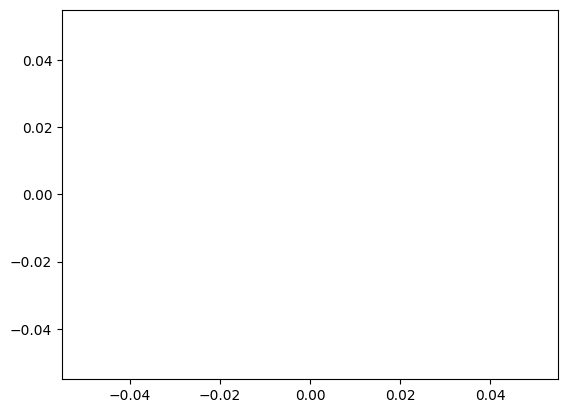

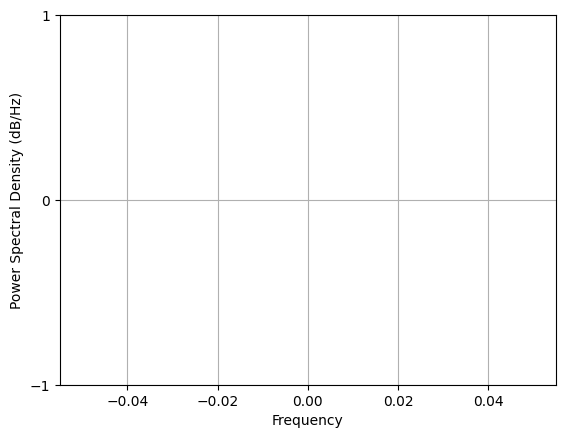

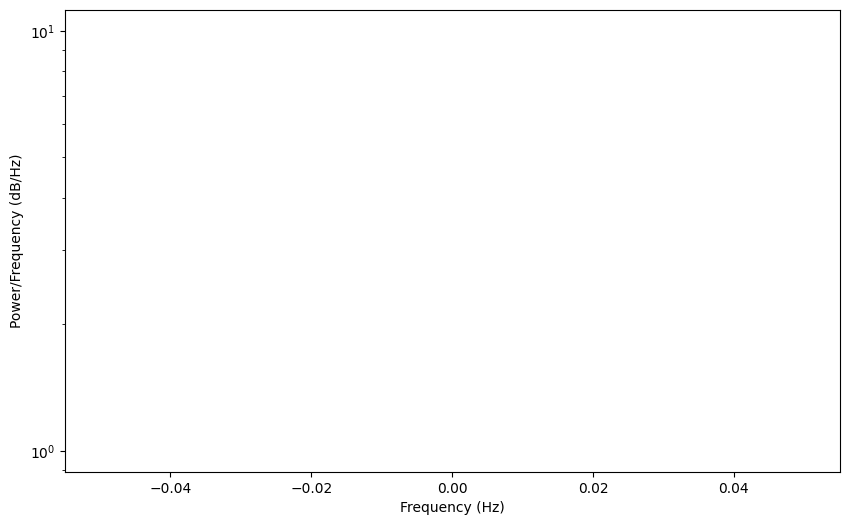

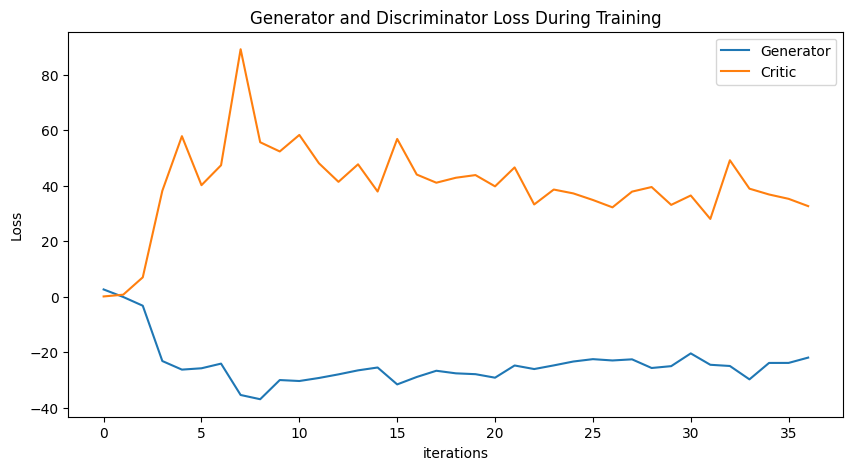

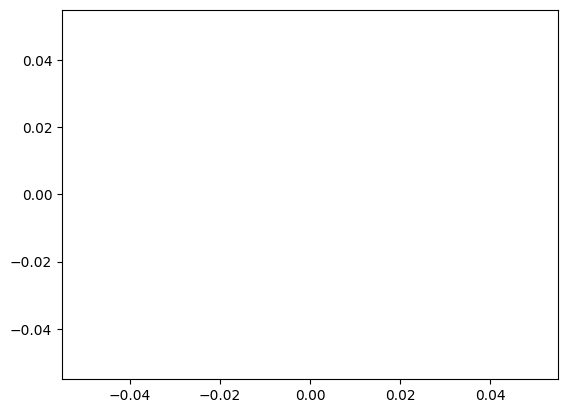

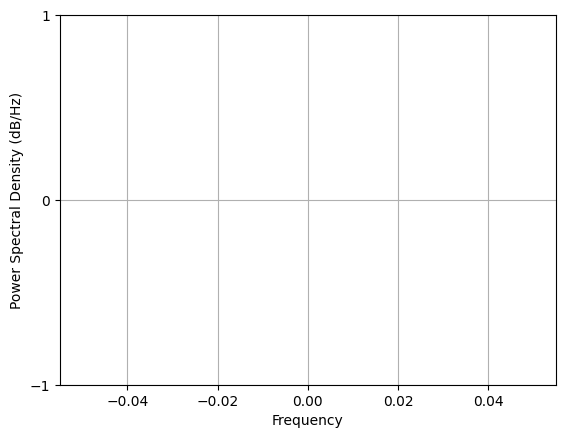

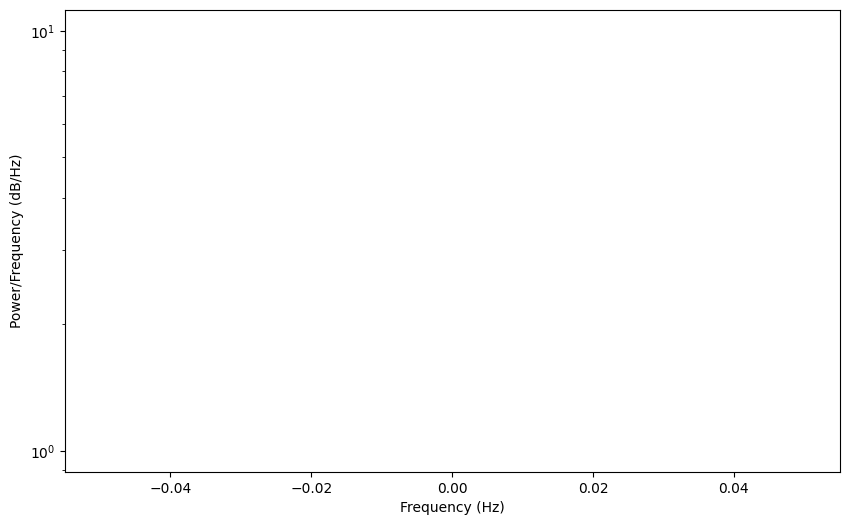

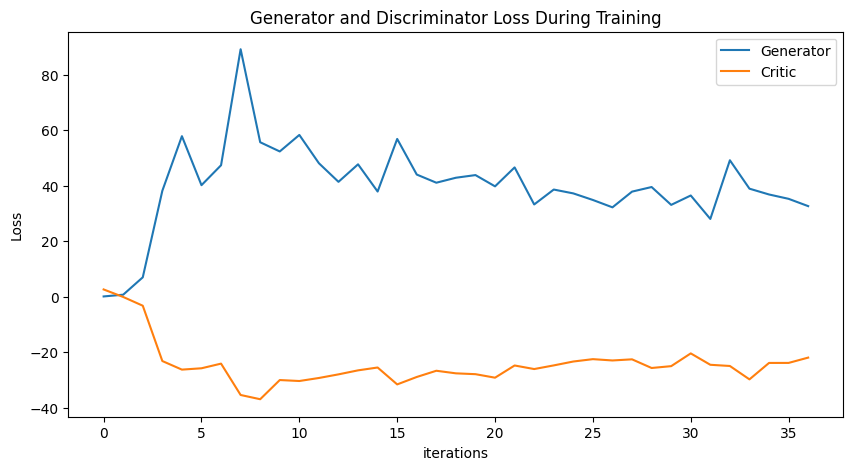

In [24]:
NUM_EPOCHS = 300
PRINT_INTERVAL = 10
BATCH_SIZE = np.shape(training_data_closed)[0]
train_loader = DataLoader(TensorDataset(torch.tensor(training_data_closed).detach()), batch_size=BATCH_SIZE, shuffle=True)

def frequency_penalty(data):
    fft_data = rfft(data)
    magnitude = torch.sqrt(fft_data.real**2 + fft_data.imag**2)
    
    # Seats frequency bins
    freqs = np.fft.rfftfreq(data.size(-1))
    ten_band = ((freqs > 5) & (freqs < 15))
    sixty_band = ((freqs > 56) & (freqs < 64))

    # Normalize magnitudes and target bins
    normalized_magnitude = magnitude / magnitude.sum(dim=-1, keepdim=True)
    ten_magnitude = (normalized_magnitude[..., ten_band].sum(dim=-1) - 0.1).clamp(min=0)
    sixty_magnitude = (normalized_magnitude[..., sixty_band].sum(dim=-1) - 0.1).clamp(min=0)

    return ten_magnitude.mean() + sixty_magnitude.mean()

class Generator(nn.Module):
    def __init__(self):
        super(Generator, self).__init__()
        self.block = nn.Sequential(
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(200, affine=True),
            nn.LeakyReLU(0.2),
            nn.Upsample(scale_factor=2),
            nn.ConvTranspose1d(200, NUM_CHANNELS, kernel_size=9, stride=1, padding=4),
            nn.BatchNorm1d(NUM_CHANNELS, affine=True),
            nn.LeakyReLU(0.2),
        )

    def forward(self, x):
        x = self.block(x)
        return x

class Discriminator(nn.Module):
    def __init__(self):
        super(Discriminator, self).__init__()
        self.block = nn.Sequential(
            nn.Conv1d(NUM_CHANNELS, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, 200, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.AvgPool1d(kernel_size=2, stride=2),
            nn.Conv1d(200, NUM_CHANNELS, kernel_size=9, stride=1, padding=4),
            nn.LeakyReLU(0.2),
            nn.Linear(305, 1)
        )

    def forward(self, x):
        x = x.float()
        x = self.block(x)
        return x

def train():
    critic_err, gen_err, generated_data = [], [], None
    G, D = Generator(), Discriminator()
    weights_init(G)
    weights_init(D)
    critic_optimizer = optim.RMSprop(D.parameters(), lr=2e-4)
    gen_optimizer = optim.RMSprop(G.parameters(), lr=2e-4)

    for epoch in range(NUM_EPOCHS):
        for _ in range(5):
            (real, ) = next(iter(train_loader))
            real.requires_grad=True
            critic_real = D(real).reshape(-1)
            loss_critic_real = -torch.mean(critic_real)
            noise = sample_normal_distribution(BATCH_SIZE, 200, 305)
            fake = G(noise)
            critic_fake = D(fake).reshape(-1)
            loss_critic_fake = torch.mean(critic_fake)
            gp = gradient_penalty(D, real, fake) * LAMBDA_GP
            D.zero_grad()
            loss_critic = loss_critic_real + loss_critic_fake + gp
            loss_critic += frequency_penalty(fake) # punish discriminator if fake data has wrong spectral properties
            loss_critic.backward()
            critic_optimizer.step()  
            
        noise = sample_normal_distribution(BATCH_SIZE, 200, 305)
        fake = G(noise)
        gen_fake = D(fake).reshape(-1)
        loss_gen = -torch.mean(gen_fake)
        loss_gen -= frequency_penalty(fake)  # reward generator if fake data has correct spectral properties
        G.zero_grad()
        loss_gen.backward()
        gen_optimizer.step()
        
        critic_err.append(loss_critic.item())
        gen_err.append(loss_gen.item())

        if epoch % PRINT_INTERVAL == 0:
            print("Epoch %s: Critic error (%s) Generator err (%s)" % (epoch, critic_err, gen_err))
            plot_everything(fake, critic_err, gen_err)

    return critic_err, gen_err, fake, D, G

critic_err, gen_err, generated_data_closed, disc, gen = train()

torch.save(gen, 'generator-spectral.pt')
torch.save(disc, 'discriminator-spectral.pt')
np.save('4ch-spectral.npy', generated_data_closed.detach())
plot_everything(generated_data_closed, gen_err, critic_err)
generated_data_closed = None